In [ ]:
pip install pandas openpyxl matplotlib seaborn scipy scikit-learn umap tslearn lightgbm xgboost catboost



[notice] A new release of pip is available: 23.2.1 -> 25.1.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [6]:
import pandas as pd
import os # Pour gérer les chemins de fichiers si besoin
import numpy as np # Utile pour les opérations numériques
import matplotlib.pyplot as plt # Pour la visualisation
import seaborn as sns # Pour des visualisations plus esthétiques
import re # Librairie pour les expressions régulières (utile pour le nommage des feuilles)

# Configuration pour afficher toutes les colonnes d'un DataFrame (optionnel)
pd.set_option('display.max_columns', None)

## Data loading

In [7]:

# --- Fonctions Utilitaires  ---

def load_excel_file(file_path):
    """Charge un fichier Excel et retourne l'objet ExcelFile."""
    try:
        xls = pd.ExcelFile(file_path)
        print(f"Fichier Excel '{file_path}' chargé avec succès.")
        return xls
    except FileNotFoundError:
        print(f"Erreur : Le fichier '{file_path}' n'a pas été trouvé.")
        return None
    except Exception as e:
        print(f"Erreur lors du chargement du fichier Excel '{file_path}': {e}")
        return None

def get_sheet_names(xls_object):
    """Retourne la liste des noms de feuilles d'un objet ExcelFile."""
    if xls_object:
        return xls_object.sheet_names
    return []

def identify_grid_sheet_categories(sheet_names):
    """
    Sépare les noms de feuilles d'UNE GRILLE en catégories "brutes" (Test xyz)
    et "calculées" (indxyz) basé sur leur nommage spécifique.
    """
    raw_sheets = []
    computed_sheets = []
    
    # Expression régulière pour "Test" suivi d'un espace (optionnel) et de 3 chiffres
    raw_pattern = re.compile(r"Test\s?\d{3}", re.IGNORECASE) 
    # Expression régulière pour "ind" suivi de 3 chiffres
    computed_pattern = re.compile(r"ind\d{3}", re.IGNORECASE)

    for name in sheet_names:
        if raw_pattern.fullmatch(name.strip()): # .strip() pour enlever les espaces avant/après
            raw_sheets.append(name.strip())
        elif computed_pattern.fullmatch(name.strip()):
            computed_sheets.append(name.strip())
            
    print(f"Feuilles de données brutes ('Test xyz') identifiées ({len(raw_sheets)}).")
    # print(raw_sheets) # Décommentez pour voir la liste
    print(f"Feuilles de données calculées ('indxyz') identifiées ({len(computed_sheets)}).")
    # print(computed_sheets) # Décommentez pour voir la liste
    return raw_sheets, computed_sheets

def extract_data_from_sheets(xls_object, sheet_list, data_type_name="données", is_raw_data=False):
    """
    Lit chaque feuille d'une liste dans un DataFrame pandas.
    Si is_raw_data est True, suppose que la 1ère ligne est l'en-tête et la 2nde les unités (à sauter).
    Sinon (pour données calculées), suppose que la 1ère ligne est l'en-tête et les données commencent juste après.
    """
    data_dfs = {}
    if not xls_object:
        print(f"Objet Excel non valide, impossible d'extraire les {data_type_name}.")
        return data_dfs
        
    print(f"\nChargement des {data_type_name}...")
    for sheet_name in sheet_list:
        try:
            if is_raw_data:
                # Pour les données brutes : header à la ligne 0, sauter la ligne 1 (unités)
                df = pd.read_excel(xls_object, sheet_name=sheet_name, header=0, skiprows=[1])
            else:
                # Pour les données calculées (ou autres types sans ligne d'unité supplémentaire) :
                # header à la ligne 0, pas de ligne d'unité à sauter explicitement ici
                df = pd.read_excel(xls_object, sheet_name=sheet_name, header=0) 
            
            match_id = re.search(r'\d{3}', sheet_name) # Correction: 'match_id' au lieu de 'match_raw'
            test_numeric_id = match_id.group(0) if match_id else sheet_name
            
            df['test_id'] = test_numeric_id 
            data_dfs[test_numeric_id] = df
            print(f"Feuille de {data_type_name} '{sheet_name}' (ID: {test_numeric_id}) chargée ({len(df)} lignes).")
        except Exception as e:
            print(f"Erreur lors du chargement de la feuille '{sheet_name}': {e}")
    return data_dfs

def drop_first_data_row_from_dfs(dfs_dict):
    cleaned_dfs_dict = {}
    for test_id, df in dfs_dict.items():
        if not df.empty and len(df) > 0:
            cleaned_dfs_dict[test_id] = df.iloc[1:].reset_index(drop=True) 
        else:
            cleaned_dfs_dict[test_id] = df
    print("Première ligne de données (3ème ligne du fichier Excel original pour les brutes) supprimée des DataFrames concernés.")
    return cleaned_dfs_dict

    

In [4]:
pip install xlrd


[notice] A new release of pip is available: 23.2.1 -> 25.1.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [8]:
excel_file_path = './data/C45 100mN 0p03 1nm 32hz 49 indents grille 1.xls' 
    
# 1. Charger le fichier Excel
xls = load_excel_file(excel_file_path)

if xls:
    # 2. Identifier les catégories de feuilles
    all_sheet_names = get_sheet_names(xls)
    raw_sheet_names, computed_sheet_names = identify_grid_sheet_categories(all_sheet_names)

    # 3. Extraire les données de chaque type de feuille
   # Utiliser is_raw_data=True pour les feuilles "Test xyz"
    raw_data_dict = extract_data_from_sheets(xls, raw_sheet_names, 
                                                "données brutes ('Test xyz')", 
                                                is_raw_data=True)
    
    # Utiliser is_raw_data=False (valeur par défaut) pour les feuilles "indxyz"
    computed_data_dict = extract_data_from_sheets(xls, computed_sheet_names, 
                                                      "données calculées ('indxyz')")

    
    
    # Visualiser les données calculées (partie charge uniquement)
    # Par exemple, Stiffness en fonction du Déplacement pour quelques tests
    print("\nVisualisation des données calculées (partie charge)...")
    sample_computed_keys = list(computed_data_dict.keys())[:3]
    for test_id in sample_computed_keys:
        df_c = computed_data_dict[test_id]
       

    print("\n--- Analyse initiale terminée. Les données sont dans raw_data_dict et computed_data_dict ---")

Fichier Excel './data/C45 100mN 0p03 1nm 32hz 49 indents grille 1.xls' chargé avec succès.
Feuilles de données brutes ('Test xyz') identifiées (49).
Feuilles de données calculées ('indxyz') identifiées (49).

Chargement des données brutes ('Test xyz')...
Feuille de données brutes ('Test xyz') 'Test 049' (ID: 049) chargée (3359 lignes).
Feuille de données brutes ('Test xyz') 'Test 048' (ID: 048) chargée (3356 lignes).
Feuille de données brutes ('Test xyz') 'Test 047' (ID: 047) chargée (3364 lignes).
Feuille de données brutes ('Test xyz') 'Test 046' (ID: 046) chargée (3369 lignes).
Feuille de données brutes ('Test xyz') 'Test 045' (ID: 045) chargée (3370 lignes).
Feuille de données brutes ('Test xyz') 'Test 044' (ID: 044) chargée (3327 lignes).
Feuille de données brutes ('Test xyz') 'Test 043' (ID: 043) chargée (3396 lignes).
Feuille de données brutes ('Test xyz') 'Test 042' (ID: 042) chargée (3490 lignes).
Feuille de données brutes ('Test xyz') 'Test 041' (ID: 041) chargée (3455 lignes)

In [9]:
excel_file_path2 = './data/C45 100mN 0p03 1nm 32Hz 49 indents grille 2.xls' 
    
# 1. Charger le fichier Excel
xls2 = load_excel_file(excel_file_path2)

if xls2:
    # 2. Identifier les catégories de feuilles
    all_sheet_names2 = get_sheet_names(xls2)
    raw_sheet_names2, computed_sheet_names2 = identify_grid_sheet_categories(all_sheet_names2)

    # 3. Extraire les données de chaque type de feuille
   # Utiliser is_raw_data=True pour les feuilles "Test xyz"
    raw_data_dict2 = extract_data_from_sheets(xls2, raw_sheet_names2, 
                                                "données brutes ('Test xyz')", 
                                                is_raw_data=True)
    
    # Utiliser is_raw_data=False (valeur par défaut) pour les feuilles "indxyz"
    computed_data_dict2 = extract_data_from_sheets(xls, computed_sheet_names2, 
                                                      "données calculées ('indxyz')")

    
    
    # Visualiser les données calculées (partie charge uniquement)
    # Par exemple, Stiffness en fonction du Déplacement pour quelques tests
    print("\nVisualisation des données calculées (partie charge)...")
    sample_computed_keys2 = list(computed_data_dict2.keys())[:3]
    for test_id in sample_computed_keys2:
        df_c = computed_data_dict2[test_id]
       

    print("\n--- Analyse initiale terminée. Les données sont dans raw_data_dict et computed_data_dict ---")

Fichier Excel './data/C45 100mN 0p03 1nm 32Hz 49 indents grille 2.xls' chargé avec succès.
Feuilles de données brutes ('Test xyz') identifiées (49).
Feuilles de données calculées ('indxyz') identifiées (48).

Chargement des données brutes ('Test xyz')...
Feuille de données brutes ('Test xyz') 'Test 049' (ID: 049) chargée (3374 lignes).
Feuille de données brutes ('Test xyz') 'Test 048' (ID: 048) chargée (3391 lignes).
Feuille de données brutes ('Test xyz') 'Test 047' (ID: 047) chargée (3361 lignes).
Feuille de données brutes ('Test xyz') 'Test 046' (ID: 046) chargée (3379 lignes).
Feuille de données brutes ('Test xyz') 'Test 045' (ID: 045) chargée (3400 lignes).
Feuille de données brutes ('Test xyz') 'Test 044' (ID: 044) chargée (3400 lignes).
Feuille de données brutes ('Test xyz') 'Test 043' (ID: 043) chargée (3439 lignes).
Feuille de données brutes ('Test xyz') 'Test 042' (ID: 042) chargée (3495 lignes).
Feuille de données brutes ('Test xyz') 'Test 041' (ID: 041) chargée (3497 lignes)

In [10]:
excel_file_path2 = './data/C45 100mN 0p03 1nm 32Hz 49 indents grille 2.xls' 
    
# 1. Charger le fichier Excel
xls2 = load_excel_file(excel_file_path2)

if xls2:
    # 2. Identifier les catégories de feuilles
    all_sheet_names2 = get_sheet_names(xls2)
    raw_sheet_names2, computed_sheet_names2 = identify_grid_sheet_categories(all_sheet_names2)

    # 3. Extraire les données de chaque type de feuille
   # Utiliser is_raw_data=True pour les feuilles "Test xyz"
    raw_data_dict2 = extract_data_from_sheets(xls2, raw_sheet_names2, 
                                                "données brutes ('Test xyz')", 
                                                is_raw_data=True)
    
    # Utiliser is_raw_data=False (valeur par défaut) pour les feuilles "indxyz"
    computed_data_dict2 = extract_data_from_sheets(xls2, computed_sheet_names2, 
                                                      "données calculées ('indxyz')")

    
    
    # Visualiser les données calculées (partie charge uniquement)
    # Par exemple, Stiffness en fonction du Déplacement pour quelques tests
    print("\nVisualisation des données calculées (partie charge)...")
    sample_computed_keys2 = list(computed_data_dict2.keys())[:3]
    for test_id in sample_computed_keys2:
        df_c = computed_data_dict2[test_id]
       

    print("\n--- Analyse initiale terminée. Les données sont dans raw_data_dict et computed_data_dict ---")

Fichier Excel './data/C45 100mN 0p03 1nm 32Hz 49 indents grille 2.xls' chargé avec succès.
Feuilles de données brutes ('Test xyz') identifiées (49).
Feuilles de données calculées ('indxyz') identifiées (48).

Chargement des données brutes ('Test xyz')...
Feuille de données brutes ('Test xyz') 'Test 049' (ID: 049) chargée (3374 lignes).
Feuille de données brutes ('Test xyz') 'Test 048' (ID: 048) chargée (3391 lignes).
Feuille de données brutes ('Test xyz') 'Test 047' (ID: 047) chargée (3361 lignes).
Feuille de données brutes ('Test xyz') 'Test 046' (ID: 046) chargée (3379 lignes).
Feuille de données brutes ('Test xyz') 'Test 045' (ID: 045) chargée (3400 lignes).
Feuille de données brutes ('Test xyz') 'Test 044' (ID: 044) chargée (3400 lignes).
Feuille de données brutes ('Test xyz') 'Test 043' (ID: 043) chargée (3439 lignes).
Feuille de données brutes ('Test xyz') 'Test 042' (ID: 042) chargée (3495 lignes).
Feuille de données brutes ('Test xyz') 'Test 041' (ID: 041) chargée (3497 lignes)

In [11]:
excel_file_path3 = './data/C45 100mN 0p03 1nm 32Hz grille 3.xls' 
    
# 1. Charger le fichier Excel
xls3 = load_excel_file(excel_file_path3)

if xls3:
    # 2. Identifier les catégories de feuilles
    all_sheet_names3 = get_sheet_names(xls3)
    raw_sheet_names3, computed_sheet_names3 = identify_grid_sheet_categories(all_sheet_names3)

    # 3. Extraire les données de chaque type de feuille
   # Utiliser is_raw_data=True pour les feuilles "Test xyz"
    raw_data_dict3 = extract_data_from_sheets(xls3, raw_sheet_names3, 
                                                "données brutes ('Test xyz')", 
                                                is_raw_data=True)
    
    # Utiliser is_raw_data=False (valeur par défaut) pour les feuilles "indxyz"
    computed_data_dict3 = extract_data_from_sheets(xls3, computed_sheet_names3, 
                                                      "données calculées ('indxyz')")

    
    
    # Visualiser les données calculées (partie charge uniquement)
    # Par exemple, Stiffness en fonction du Déplacement pour quelques tests
    print("\nVisualisation des données calculées (partie charge)...")
    sample_computed_keys3 = list(computed_data_dict3.keys())[:3]
    for test_id in sample_computed_keys3:
        df_c = computed_data_dict3[test_id]
       

    print("\n--- Analyse initiale terminée. Les données sont dans raw_data_dict et computed_data_dict ---")

Fichier Excel './data/C45 100mN 0p03 1nm 32Hz grille 3.xls' chargé avec succès.
Feuilles de données brutes ('Test xyz') identifiées (49).
Feuilles de données calculées ('indxyz') identifiées (49).

Chargement des données brutes ('Test xyz')...
Feuille de données brutes ('Test xyz') 'Test 049' (ID: 049) chargée (3374 lignes).
Feuille de données brutes ('Test xyz') 'Test 048' (ID: 048) chargée (3379 lignes).
Feuille de données brutes ('Test xyz') 'Test 047' (ID: 047) chargée (3371 lignes).
Feuille de données brutes ('Test xyz') 'Test 046' (ID: 046) chargée (3376 lignes).
Feuille de données brutes ('Test xyz') 'Test 045' (ID: 045) chargée (3353 lignes).
Feuille de données brutes ('Test xyz') 'Test 044' (ID: 044) chargée (3371 lignes).
Feuille de données brutes ('Test xyz') 'Test 043' (ID: 043) chargée (3399 lignes).
Feuille de données brutes ('Test xyz') 'Test 042' (ID: 042) chargée (3484 lignes).
Feuille de données brutes ('Test xyz') 'Test 041' (ID: 041) chargée (3490 lignes).
Feuille d

In [12]:
excel_file_path4 = './data/C45 100mN 0p03 1nm 32Hz grille 4.xls' 
    
# 1. Charger le fichier Excel
xls4 = load_excel_file(excel_file_path4)

if xls4:
    # 2. Identifier les catégories de feuilles
    all_sheet_names4 = get_sheet_names(xls4)
    raw_sheet_names4, computed_sheet_names4 = identify_grid_sheet_categories(all_sheet_names4)

    # 3. Extraire les données de chaque type de feuille
   # Utiliser is_raw_data=True pour les feuilles "Test xyz"
    raw_data_dict4 = extract_data_from_sheets(xls4, raw_sheet_names4, 
                                                "données brutes ('Test xyz')", 
                                                is_raw_data=True)
    
    # Utiliser is_raw_data=False (valeur par défaut) pour les feuilles "indxyz"
    computed_data_dict4 = extract_data_from_sheets(xls4, computed_sheet_names4, 
                                                      "données calculées ('indxyz')")

    
    
    # Visualiser les données calculées (partie charge uniquement)
    # Par exemple, Stiffness en fonction du Déplacement pour quelques tests
    print("\nVisualisation des données calculées (partie charge)...")
    sample_computed_keys4 = list(computed_data_dict4.keys())[:3]
    for test_id in sample_computed_keys4:
        df_c = computed_data_dict4[test_id]
       

    print("\n--- Analyse initiale terminée. Les données sont dans raw_data_dict et computed_data_dict ---")

Fichier Excel './data/C45 100mN 0p03 1nm 32Hz grille 4.xls' chargé avec succès.
Feuilles de données brutes ('Test xyz') identifiées (49).
Feuilles de données calculées ('indxyz') identifiées (49).

Chargement des données brutes ('Test xyz')...
Feuille de données brutes ('Test xyz') 'Test 049' (ID: 049) chargée (3382 lignes).
Feuille de données brutes ('Test xyz') 'Test 048' (ID: 048) chargée (3377 lignes).
Feuille de données brutes ('Test xyz') 'Test 047' (ID: 047) chargée (3392 lignes).
Feuille de données brutes ('Test xyz') 'Test 046' (ID: 046) chargée (3356 lignes).
Feuille de données brutes ('Test xyz') 'Test 045' (ID: 045) chargée (3385 lignes).
Feuille de données brutes ('Test xyz') 'Test 044' (ID: 044) chargée (3381 lignes).
Feuille de données brutes ('Test xyz') 'Test 043' (ID: 043) chargée (3429 lignes).
Feuille de données brutes ('Test xyz') 'Test 042' (ID: 042) chargée (3487 lignes).
Feuille de données brutes ('Test xyz') 'Test 041' (ID: 041) chargée (3495 lignes).
Feuille d

In [13]:
def shift_and_merge_dicts(*dicts_with_offsets):
    """
    Prend des tuples (dictionnaire, offset), applique un décalage aux clés, puis fusionne tous les dictionnaires.
    """
    merged_dict = {}

    for data_dict, offset in dicts_with_offsets:
        for key, value in data_dict.items():
            try:
                key_int = int(key)
            except ValueError:
                raise ValueError(f"Clé '{key}' n'est pas convertible en entier.")
            new_key = f"{key_int + offset:03d}"  # Format à 3 chiffres avec zéros
            merged_dict[new_key] = value

    return merged_dict


In [14]:
merged_data_dict = shift_and_merge_dicts(
    (computed_data_dict, 0),
    (computed_data_dict2, 50),
    (computed_data_dict3, 100),
    (computed_data_dict4, 150)
)


In [15]:
merged_data_dict

{'001':       Temps (s)  Force (mN)  Raideur brute (N/m)      P/S² (nm)  \
 0       -513.60   -6.533194        1.797693e+308 -765063.822829   
 1       -461.00    0.030188        -6.044130e+01  176078.976721   
 2       -460.80    0.030209        -5.972464e+01  176080.787818   
 3       -460.60    0.030116        -5.537637e+01  176083.280362   
 4       -460.40    0.030036        -5.287899e+01  176086.643615   
 ...         ...         ...                  ...            ...   
 3906     320.00   97.771059         1.142047e+06  181855.229842   
 3907     320.20   98.359520         1.149372e+06  181858.535140   
 3908     320.40   98.947960         1.156754e+06  181862.184101   
 3909     320.60   99.536388         1.163470e+06  181866.041431   
 3910     320.76  100.014498         1.167375e+06  181868.968991   
 
       Déplacement brut (nm)  Amortissement brut  \
 0            -945737.624936       -2.695136e+00   
 1              -4601.939011        3.408969e+08   
 2              -46

In [16]:
first_raw_key = next(iter(raw_data_dict)) # Obtenir la première clé
print(f"\nColonnes pour les données brutes (exemple de la feuille '{first_raw_key}'):")
print(list(raw_data_dict[first_raw_key].columns))


Colonnes pour les données brutes (exemple de la feuille '049'):
['_Time', 'DisplacementIntoSurface', 'LoadOnSample', '_HarmonicStiffness', '_HarmonicDamping', 'Hardness', 'ReducedModulus', '_XPosition', '_YPosition', '_Frame', '_Displacement', 'test_id']


In [17]:
first_computed_key = next(iter(computed_data_dict)) # Obtenir la première clé
print(f"\nColonnes pour les données calculées (exemple de la feuille '{first_computed_key}'):")
print(list(computed_data_dict[first_computed_key].columns))


Colonnes pour les données calculées (exemple de la feuille '001'):
['Temps (s)', 'Force (mN)', 'Raideur brute (N/m)', 'P/S² (nm)', 'Déplacement brut (nm)', 'Amortissement brut', 'Déplacement corrigé dérive thermique (nm)', 'Raideur de contact (N/m)', 'hr (nm)', 'ErL(MPa)', 'HL (MPa)', 'EL (MPa)', 'hcOP (nm)', 'ErOP(MPa)', 'HOP (MPa)', 'EOP (MPa)', 'ErsL(MPa)', 'ErsOP(MPa)', 'tan delta', 'raideur du bati (N/m)', 'E pointe (MPa)', 'Derive thermique (nm/s)', 'h0L (nm)', 'h0OP (nm)', 'HOP charge max (MPa)', 'ErOP charge max (MPa)', 'HL charge max (MPa)', 'ErL charge max (MPa)', 'Position X (µm)', 'Position Y (µm)', 'test_id']


In [18]:

# Appliquer la suppression (si raw_data_dict est déjà chargé)
# Assurez-vous que raw_data_dict est défini et rempli avant cette ligne
if 'raw_data_dict' in locals() and raw_data_dict:
    raw_data_dict_cleaned = drop_first_data_row_from_dfs(raw_data_dict.copy()) # Travaille sur une copie pour ne pas modifier l'original directement
else:
    print("Erreur : raw_data_dict n'est pas défini. Veuillez d'abord charger les données.")
    raw_data_dict_cleaned = {} # Initialise pour éviter les erreurs suivantes



Première ligne de données (3ème ligne du fichier Excel original pour les brutes) supprimée des DataFrames concernés.


In [19]:
computed_data_dict

{'001':       Temps (s)  Force (mN)  Raideur brute (N/m)      P/S² (nm)  \
 0       -513.60   -6.533194        1.797693e+308 -765063.822829   
 1       -461.00    0.030188        -6.044130e+01  176078.976721   
 2       -460.80    0.030209        -5.972464e+01  176080.787818   
 3       -460.60    0.030116        -5.537637e+01  176083.280362   
 4       -460.40    0.030036        -5.287899e+01  176086.643615   
 ...         ...         ...                  ...            ...   
 3906     320.00   97.771059         1.142047e+06  181855.229842   
 3907     320.20   98.359520         1.149372e+06  181858.535140   
 3908     320.40   98.947960         1.156754e+06  181862.184101   
 3909     320.60   99.536388         1.163470e+06  181866.041431   
 3910     320.76  100.014498         1.167375e+06  181868.968991   
 
       Déplacement brut (nm)  Amortissement brut  \
 0            -945737.624936       -2.695136e+00   
 1              -4601.939011        3.408969e+08   
 2              -46

## Visualisation des corrélations 

In [20]:
def plot_ph_curves_grid_simple_filter(dfs_dict, col1, col2, grid_size=(7, 7)):
    """
    Affiche les courbes P-h (pour displacement >= 0) de tous les tests 
    sur une grille. Filtre simple.
    """
    if not dfs_dict:
        print("Aucune donnée à visualiser en grille.")
        return

    num_plots = grid_size[0] * grid_size[1]
    test_ids_to_plot = list(dfs_dict.keys())
    
    fig, axes = plt.subplots(grid_size[0], grid_size[1], figsize=(18, 18), sharex=True, sharey=True)
    # Ajustement du titre pour refléter le filtrage
    fig.suptitle(f'Grille {grid_size[0]}x{grid_size[1]} des Courbes ({col2} vs {col1}, pour {col1} >= 0)', fontsize=16)
    axes_flat = axes.flatten()
    
    last_plotted_index = -1 # Pour suivre le dernier axe utilisé

    for i, test_id in enumerate(test_ids_to_plot):
        if i >= num_plots: 
            break
            
        df_original = dfs_dict.get(test_id)
        ax = axes_flat[i]

        if df_original is not None and col1 in df_original.columns and col2 in df_original.columns and not df_original.empty:
            # --- FILTRAGE SIMPLE EN 1 LIGNE ---
            df_filtered = df_original[df_original[col1] >= 0]
            
            if not df_filtered.empty:
                ax.plot(df_filtered[col1], df_filtered[col2], linewidth=0.8)
                ax.set_title(f'Test {test_id}', fontsize=8)
                ax.xaxis.set_tick_params(labelsize=6)
                ax.yaxis.set_tick_params(labelsize=6)
                last_plotted_index = i # Mettre à jour le dernier index tracé
            else:
                ax.set_title(f'Test {test_id} (h<0)', fontsize=8)
                ax.text(0.5, 0.5, 'h<0 ou vide', ha='center', va='center', transform=ax.transAxes, fontsize=7)
        else:
            ax.set_title(f'Test {test_id} (N/A)', fontsize=8)
            ax.text(0.5, 0.5, 'Pas de données', ha='center', va='center', transform=ax.transAxes, fontsize=7)
        
        if i // grid_size[1] == grid_size[0] - 1: 
            ax.set_xlabel(col1, fontsize=7)
        if i % grid_size[1] == 0: 
            ax.set_ylabel(col2, fontsize=7)
        ax.grid(True, linestyle=':', alpha=0.7)

    # Cacher les axes des subplots vides
    for j in range(last_plotted_index + 1, num_plots):
        if j < len(axes_flat):
             fig.delaxes(axes_flat[j])

    plt.tight_layout(rect=[0, 0, 1, 0.96]) 
    plt.show()


def plot_ph_curves_overlay_simple_filter(dfs_dict, col1, col2):
    """
    Affiche toutes les courbes superposées (pour displacement >= 0) 
    sur une seule figure. Filtre simple.
    """
    if not dfs_dict:
        print("Aucune donnée à visualiser en superposition.")
        return
    
    plt.figure(figsize=(16, 14))
    count_plotted = 0
    for test_id, df_original in dfs_dict.items():
        if df_original is not None and col1 in df_original.columns and col2 in df_original.columns and not df_original.empty:
            # --- FILTRAGE SIMPLE EN 1 LIGNE ---
            df_filtered = df_original[df_original[col1] >= 0]
            
            if not df_filtered.empty:
                plt.plot(df_filtered[col1], df_filtered[col2], linewidth=0.5, alpha=0.5)
                count_plotted +=1
            
    plt.xlabel(col1)
    plt.ylabel(col2)
    # Ajustement du titre pour refléter le filtrage
    plt.title(f'Superposition des Courbes ({count_plotted}/{len(dfs_dict)} tests affichés, pour {col1} >= 0)')
    plt.grid(True)
    plt.show()


--- Visualisation FILTRÉE (simple) des Courbes P-h Brutes (Displacement >= 0) ---


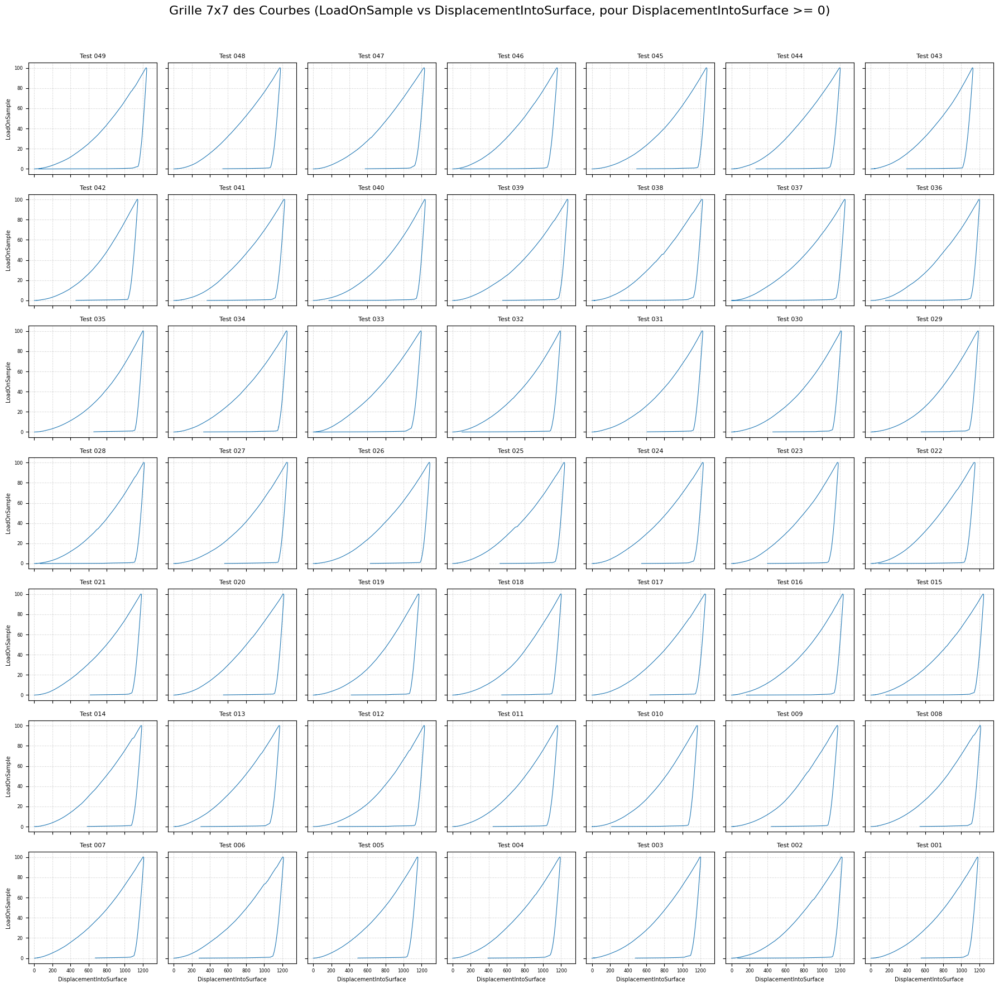

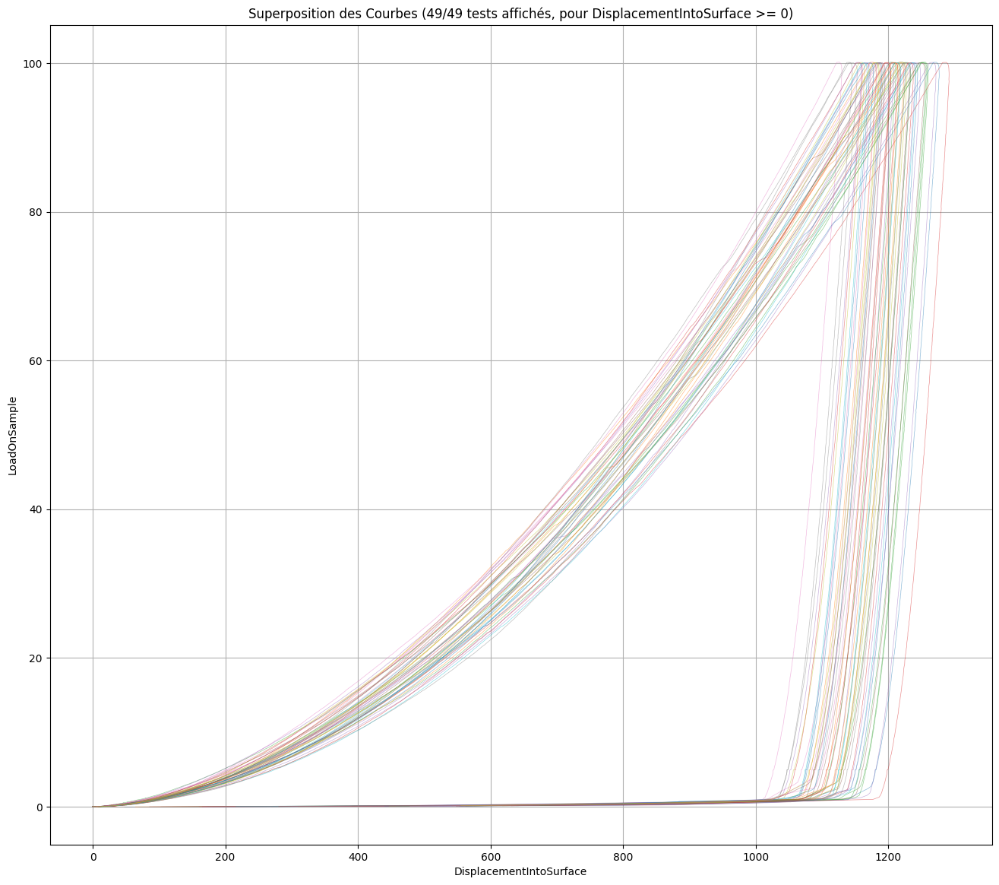

In [21]:
RAW_DISPLACEMENT_COL = 'DisplacementIntoSurface' # Adaptez à votre nom de colonne exact
RAW_LOAD_COL = 'LoadOnSample' 
# Appeler la fonction de visualisation en grille
if 'raw_data_dict_cleaned' in locals() and raw_data_dict_cleaned:

    print("\n--- Visualisation FILTRÉE (simple) des Courbes P-h Brutes (Displacement >= 0) ---")
    plot_ph_curves_grid_simple_filter(raw_data_dict_cleaned, 
                                      RAW_DISPLACEMENT_COL, 
                                     RAW_LOAD_COL)
    
    plot_ph_curves_overlay_simple_filter(raw_data_dict_cleaned,  RAW_DISPLACEMENT_COL, 
                                         RAW_LOAD_COL)
else:
    print("raw_data_dict_cleaned n'est pas défini ou est vide.")

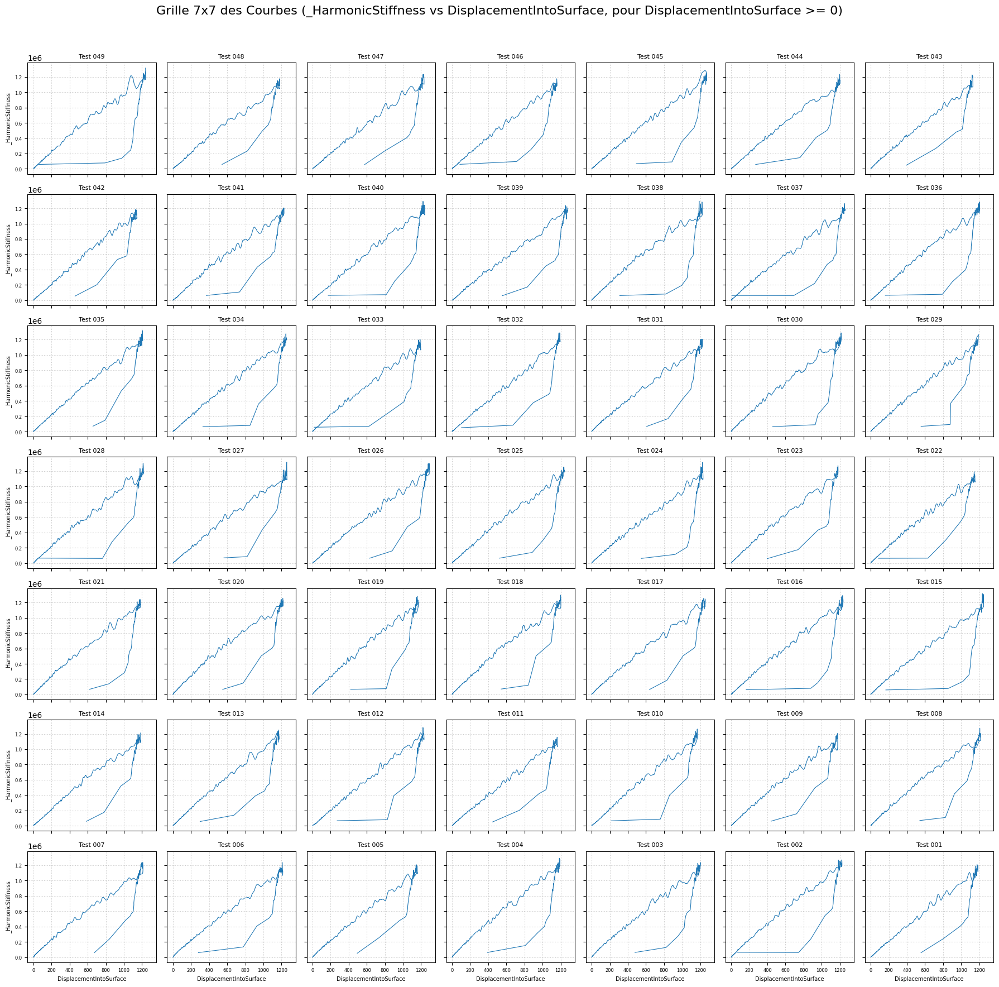

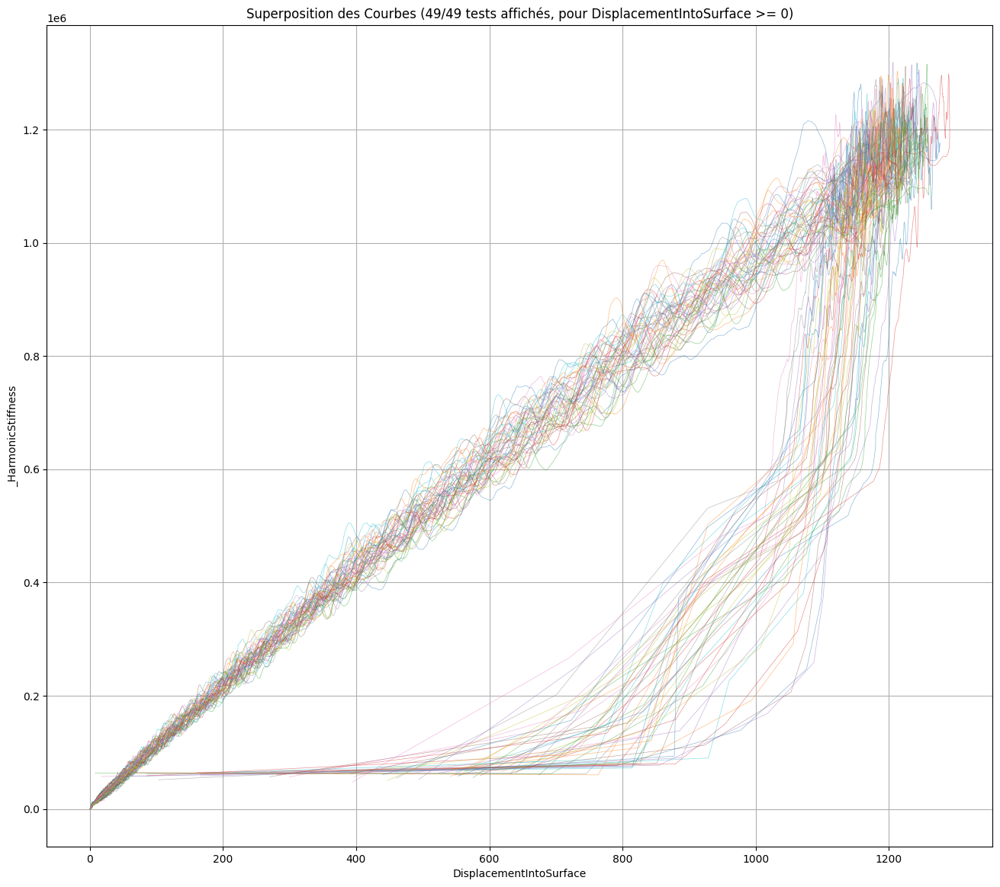

In [22]:
RAW_HarmonicStiffness='_HarmonicStiffness'
plot_ph_curves_grid_simple_filter(raw_data_dict_cleaned, 
                                      RAW_DISPLACEMENT_COL, 
                                     RAW_HarmonicStiffness)
    
plot_ph_curves_overlay_simple_filter(raw_data_dict_cleaned,  RAW_DISPLACEMENT_COL, 
                                         RAW_HarmonicStiffness)

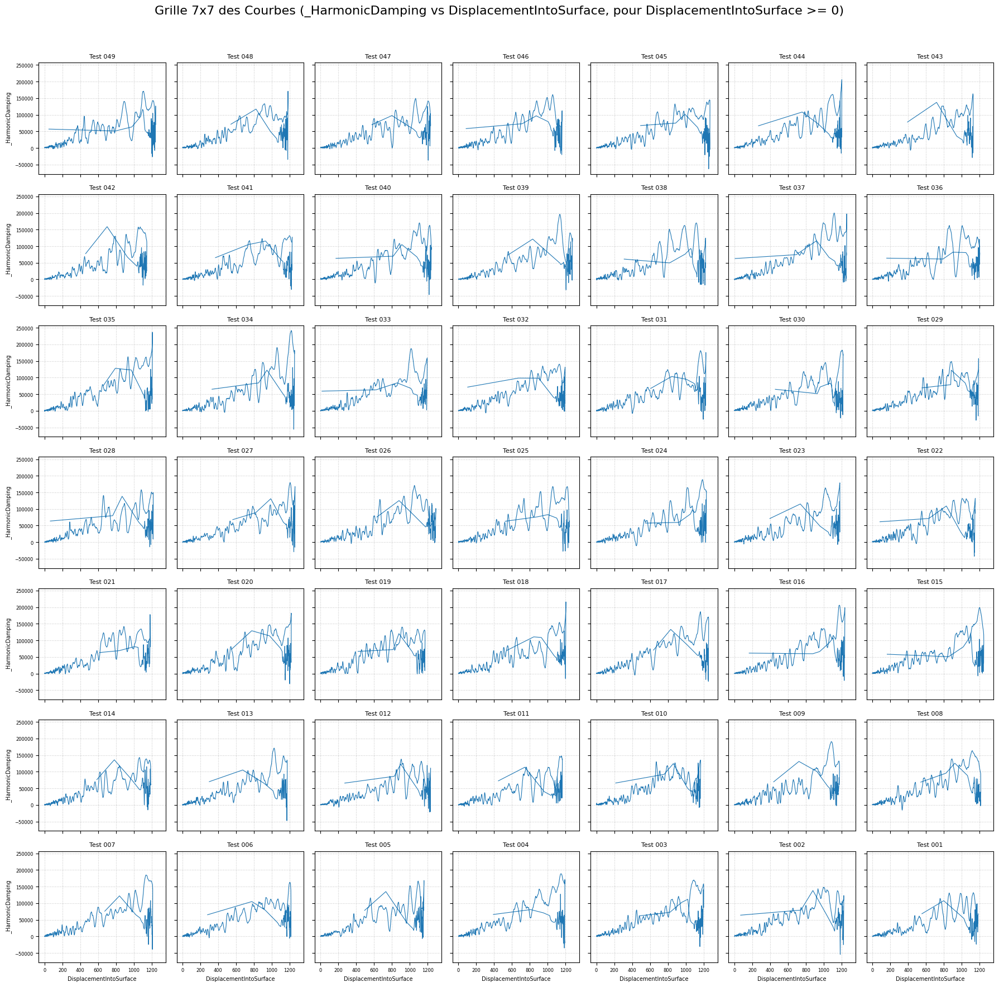

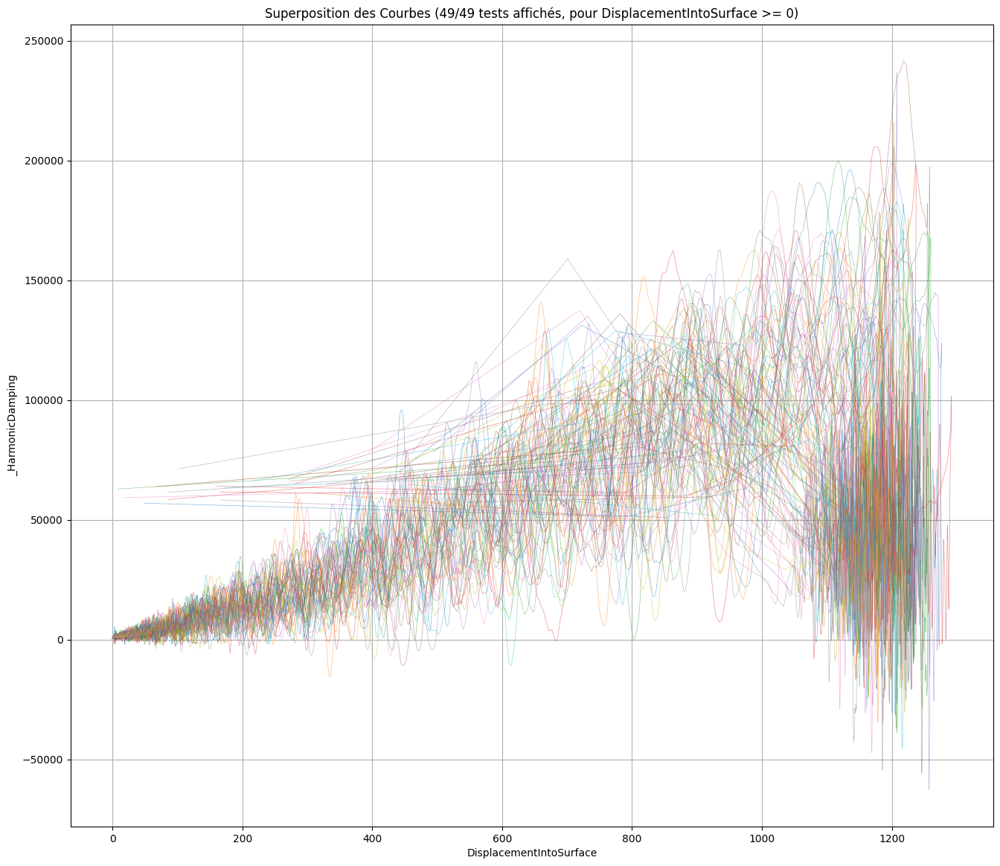

In [23]:
RAW_HarmonicDamping='_HarmonicDamping'
plot_ph_curves_grid_simple_filter(raw_data_dict_cleaned, 
                                      RAW_DISPLACEMENT_COL, 
                                     RAW_HarmonicDamping)
    
plot_ph_curves_overlay_simple_filter(raw_data_dict_cleaned,  RAW_DISPLACEMENT_COL, 
                                         RAW_HarmonicDamping)

['Temps (s)', 'Force (mN)', 'Raideur brute (N/m)', 'P/S² (nm)', 'Déplacement brut (nm)', 'Amortissement brut', 'Déplacement corrigé dérive thermique (nm)', 'Raideur de contact (N/m)', 'hr (nm)', 'ErL(MPa)', 'HL (MPa)', 'EL (MPa)', 'hcOP (nm)', 'ErOP(MPa)', 'HOP (MPa)', 'EOP (MPa)', 'ErsL(MPa)', 'ErsOP(MPa)', 'tan delta', 'raideur du bati (N/m)', 'E pointe (MPa)', 'Derive thermique (nm/s)', 'h0L (nm)', 'h0OP (nm)', 'HOP charge max (MPa)', 'ErOP charge max (MPa)', 'HL charge max (MPa)', 'ErL charge max (MPa)', 'Position X (µm)', 'Position Y (µm)', 'test_id']

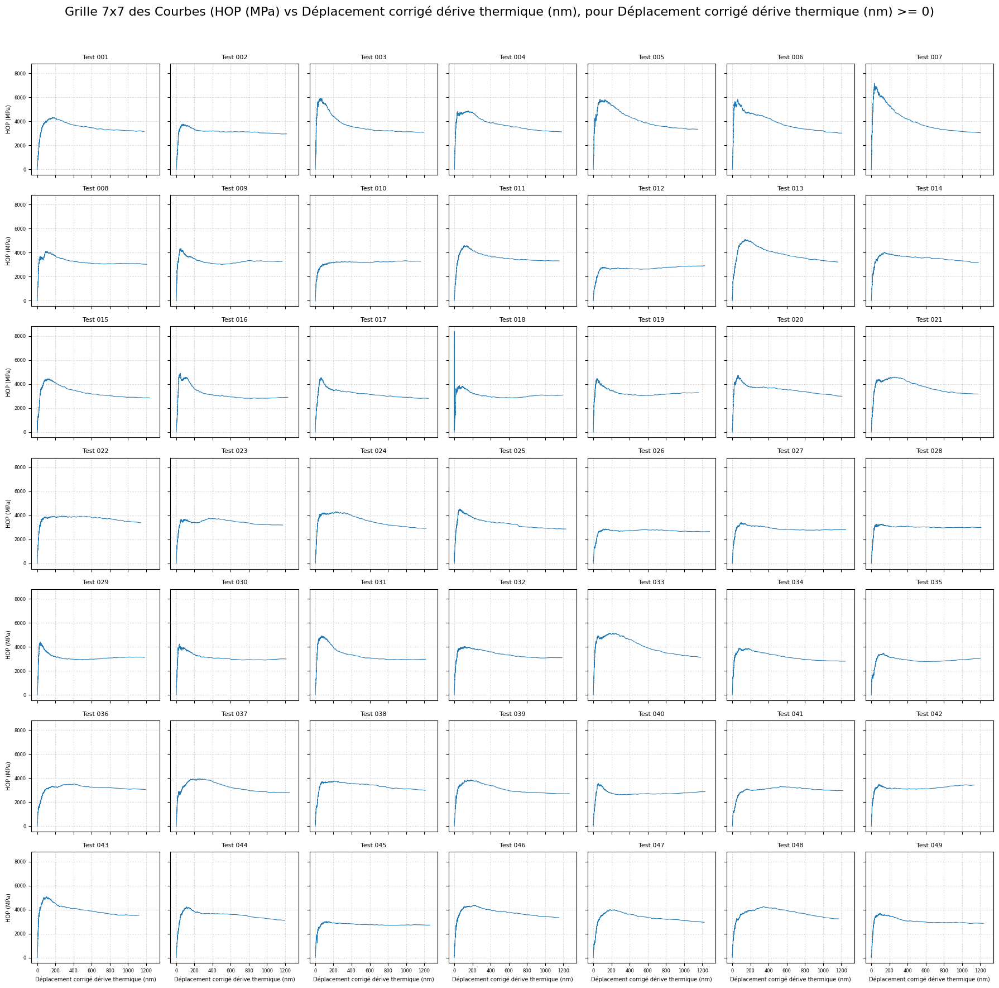

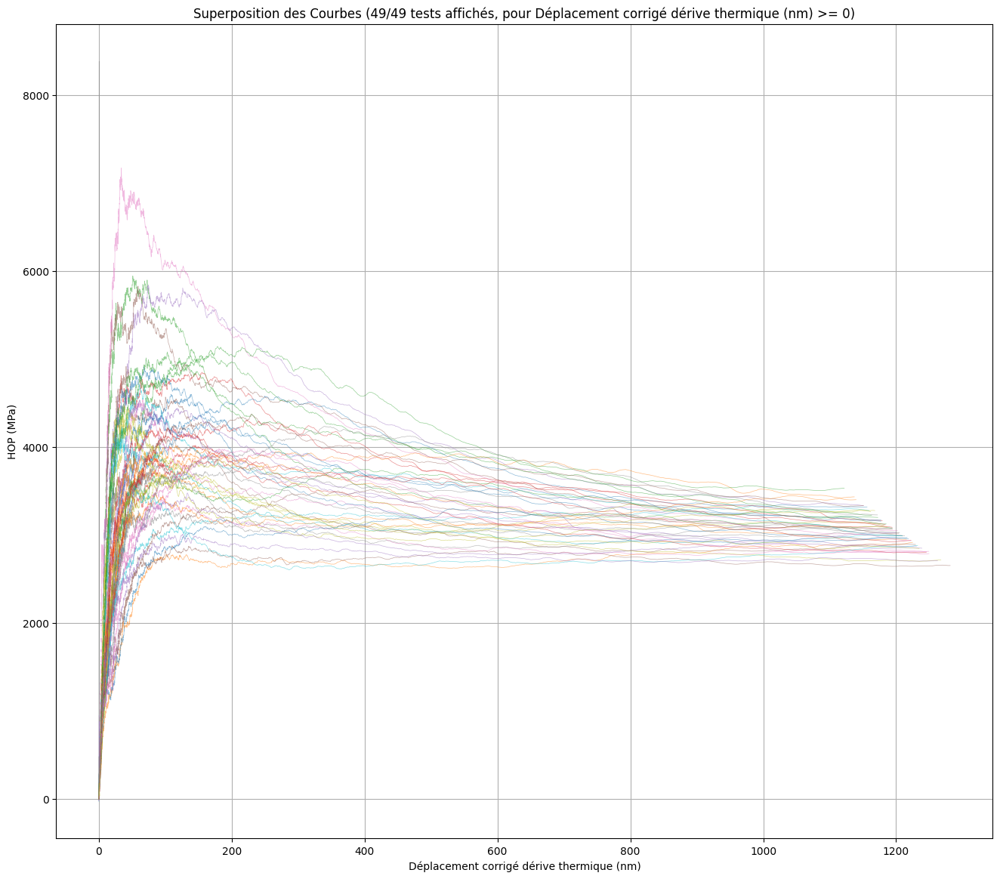

In [24]:
Hardness='HOP (MPa)'
COMP_DISPLACEMENT_COL='Déplacement corrigé dérive thermique (nm)'
plot_ph_curves_grid_simple_filter(computed_data_dict, 
                                      COMP_DISPLACEMENT_COL, 
                                     Hardness)
    
plot_ph_curves_overlay_simple_filter(computed_data_dict,  COMP_DISPLACEMENT_COL, 
                                         Hardness)

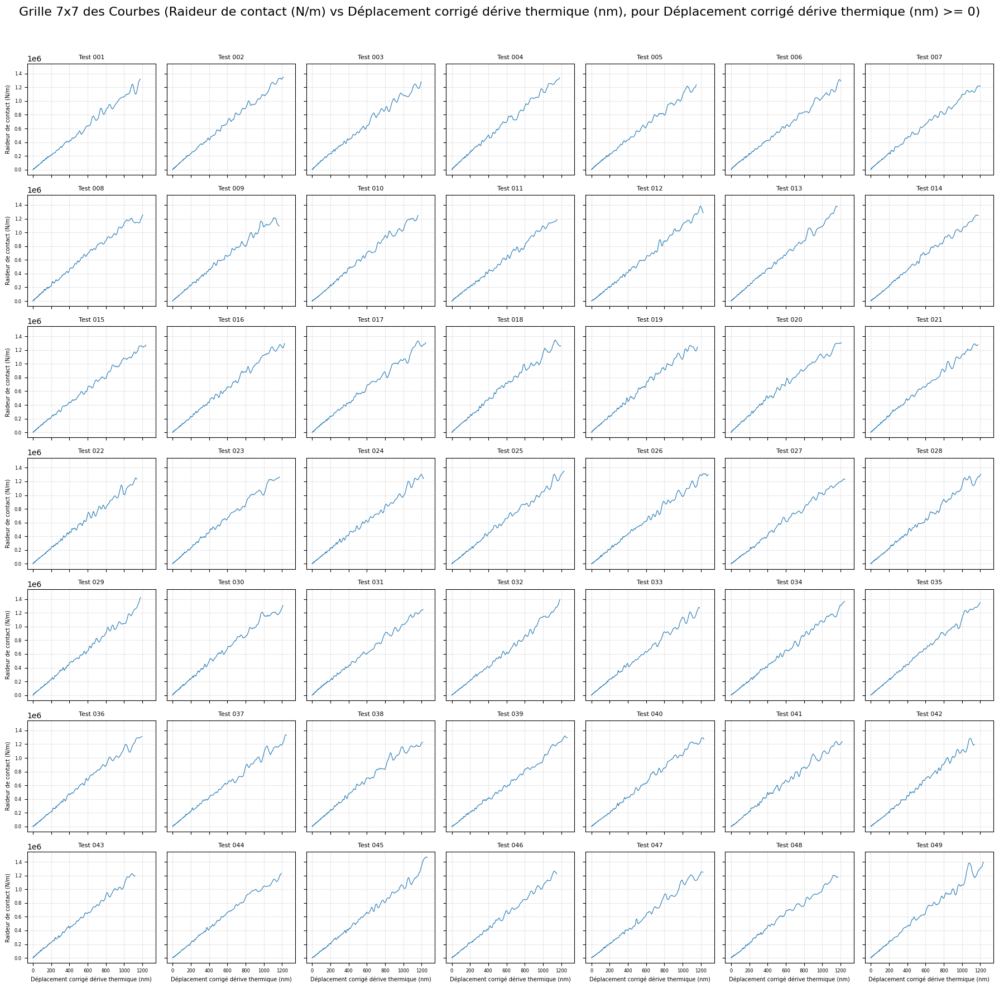

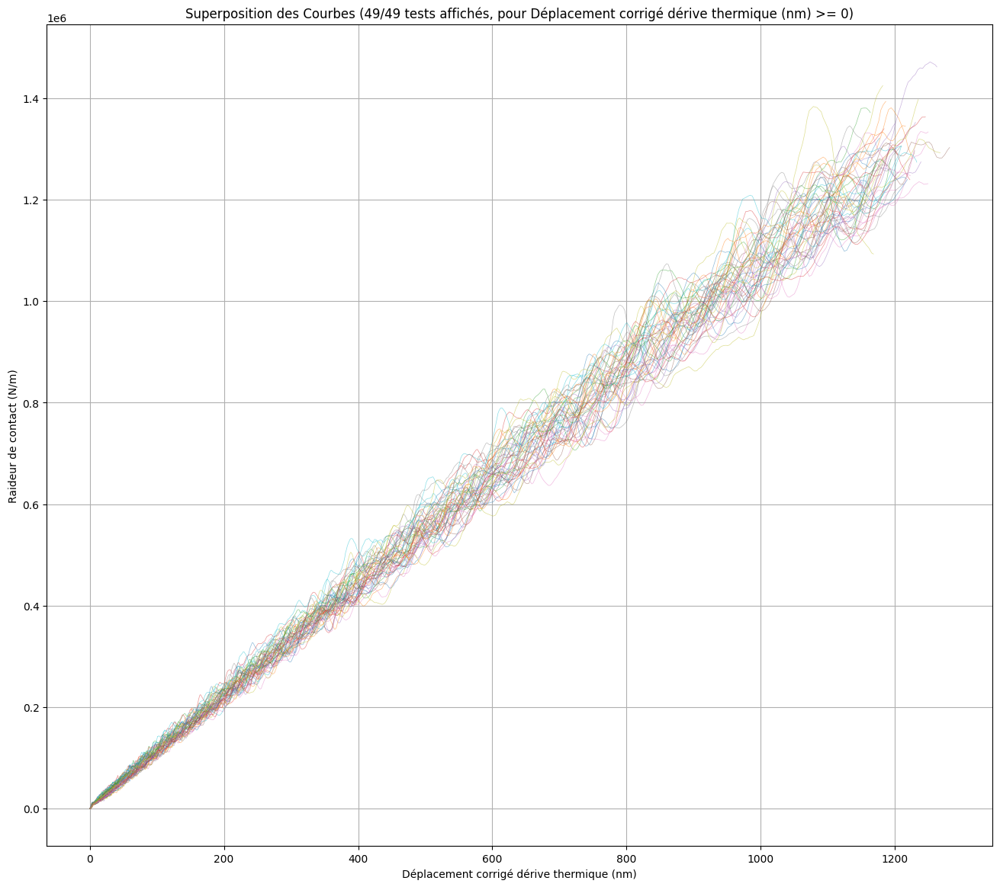

In [25]:
raideur='Raideur de contact (N/m)'
COMP_DISPLACEMENT_COL='Déplacement corrigé dérive thermique (nm)'
plot_ph_curves_grid_simple_filter(computed_data_dict, 
                                      COMP_DISPLACEMENT_COL, 
                                     raideur)
    
plot_ph_curves_overlay_simple_filter(computed_data_dict,  COMP_DISPLACEMENT_COL, 
                                         raideur)

In [26]:
class_N_test_ids = ['006', '011', '014', '015','016','017','021','022','024','031','039','043','046','047','048','054','055','059','063','064','066','068','070','075','076','081','090','095','096','097','098','102','103','105','106','112','123','124','125','127','128','129','135','138','140','140','141','142','144','148','149','154','158','159','163','164','166','178','179','184','189','194','196','198'] # noir pur
class_B_test_ids = ['012', '018', '019', '020','023','036','040','042','049','053','083','091','121','133','134','146','151','155','172','177','192']  # blanc pur
class_NtoB_test_ids = ['001', '003', '005', '004','007','032','033','034','037','056','065','067','070','082','084','086','087','094','107','109','110','111','116','118','119','120','122','131','132','137','147','156','160','165','167','168','169','171','173','176','180','182','183','185','186','191','193','195','199']  # du noir au blanc.
class_BtoN_test_ids = ['002', '008', '009', '010','013','025','026','027','028','029','030','035','038','041','044','045','051','052','057','058','060','061','062','072','073','074','077','078','079','080','085','088','089','092','0093','099','101','104','108','113','114','115','117','126','130','136','139','143','145','152','153','157','161','162','170','174','175','','181','187','188','190','197'] #du blanc au noir

In [27]:
class_comp_N_data = {test_id: df for test_id, df in merged_data_dict.items() if test_id in class_N_test_ids}

class_comp_B_data = {test_id: df for test_id, df in merged_data_dict.items() if test_id in class_B_test_ids}

class_comp_NtoB_data = {test_id: df for test_id, df in merged_data_dict.items() if test_id in class_NtoB_test_ids}
class_comp_BtoN_data = {test_id: df for test_id, df in merged_data_dict.items() if test_id in class_BtoN_test_ids}

In [28]:
class_raw_N_data = {test_id: df for test_id, df in raw_data_dict_cleaned.items() if test_id in class_N_test_ids}

class_raw_B_data = {test_id: df for test_id, df in raw_data_dict_cleaned.items() if test_id in class_B_test_ids}

class_raw_NtoB_data = {test_id: df for test_id, df in raw_data_dict_cleaned.items() if test_id in class_NtoB_test_ids}
class_raw_BtoN_data = {test_id: df for test_id, df in raw_data_dict_cleaned.items() if test_id in class_BtoN_test_ids}

In [29]:
def plot_two_classes_overlay(dict1, dict2, col1, col2, 
                             label1='Classe 1', color1='blue', 
                             label2='Classe 2', color2='red'):
    """
    Affiche les courbes de deux dictionnaires superposées sur un seul graphique, 
    chacun avec sa propre couleur et son propre label.
    Applique un filtrage pour que les valeurs de la colonne 1 soient >= 0.
    """
    plt.figure(figsize=(16, 14))
    
    # --- Tracé du premier dictionnaire ---
    count1 = 0
    if dict1:
        for test_id, df_original in dict1.items():
            if col1 in df_original.columns and col2 in df_original.columns and not df_original.empty:
                df_filtered = df_original[df_original[col1] > 10]
                if not df_filtered.empty:
                    # On met le label uniquement sur la première courbe tracée pour ne pas surcharger la légende
                    current_label = label1 if count1 == 0 else ""
                    plt.plot(df_filtered[col1], df_filtered[col2], color=color1, 
                             linewidth=0.5, alpha=0.5, label=current_label)
                    count1 += 1
    
    # --- Tracé du deuxième dictionnaire ---
    count2 = 0
    if dict2:
        for test_id, df_original in dict2.items():
            if col1 in df_original.columns and col2 in df_original.columns and not df_original.empty:
                df_filtered = df_original[df_original[col1] > 10]
                if not df_filtered.empty:
                    # On met le label uniquement sur la première courbe tracée
                    current_label = label2 if count2 == 0 else ""
                    plt.plot(df_filtered[col1], df_filtered[col2], color=color2, 
                             linewidth=0.5, alpha=0.5, label=current_label)
                    count2 += 1

    # Configuration du graphique
    plt.xlabel(col1)
    plt.ylabel(col2)
    plt.title(f'Superposition des Classes : {label1} ({count1}) vs {label2} ({count2}) {col2}=f({col1})')
    plt.grid(True)
    if count1 > 0 or count2 > 0:
        plt.legend() # Affiche la légende (avec les labels de la première courbe de chaque classe)
    plt.show()

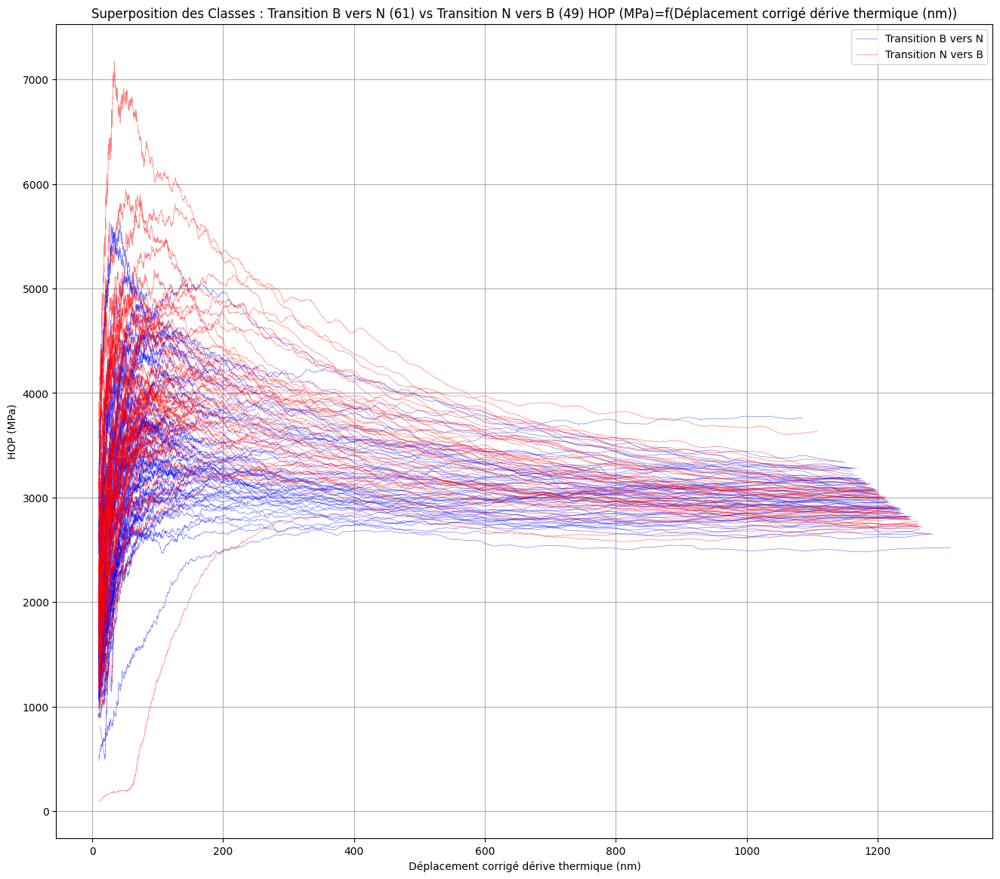

In [30]:
plot_two_classes_overlay(class_comp_BtoN_data, 
                         class_comp_NtoB_data, 
                          col1=COMP_DISPLACEMENT_COL, 
                         col2=Hardness,
                        label1='Transition B vers N', color1='blue',
                         label2='Transition N vers B', color2='red')

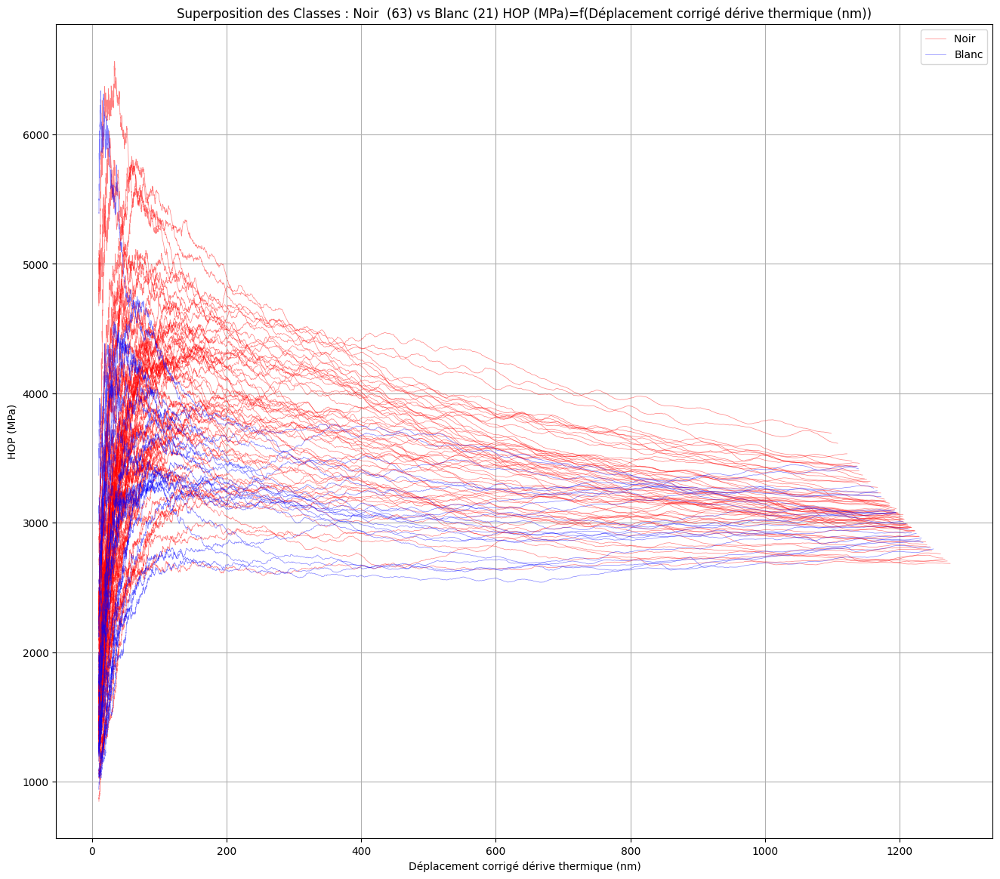

In [31]:
plot_two_classes_overlay(class_comp_N_data, 
                         class_comp_B_data, 
                          col1=COMP_DISPLACEMENT_COL, 
                         col2=Hardness,
                        label1='Noir ', color1='red',
                         label2='Blanc', color2='blue')

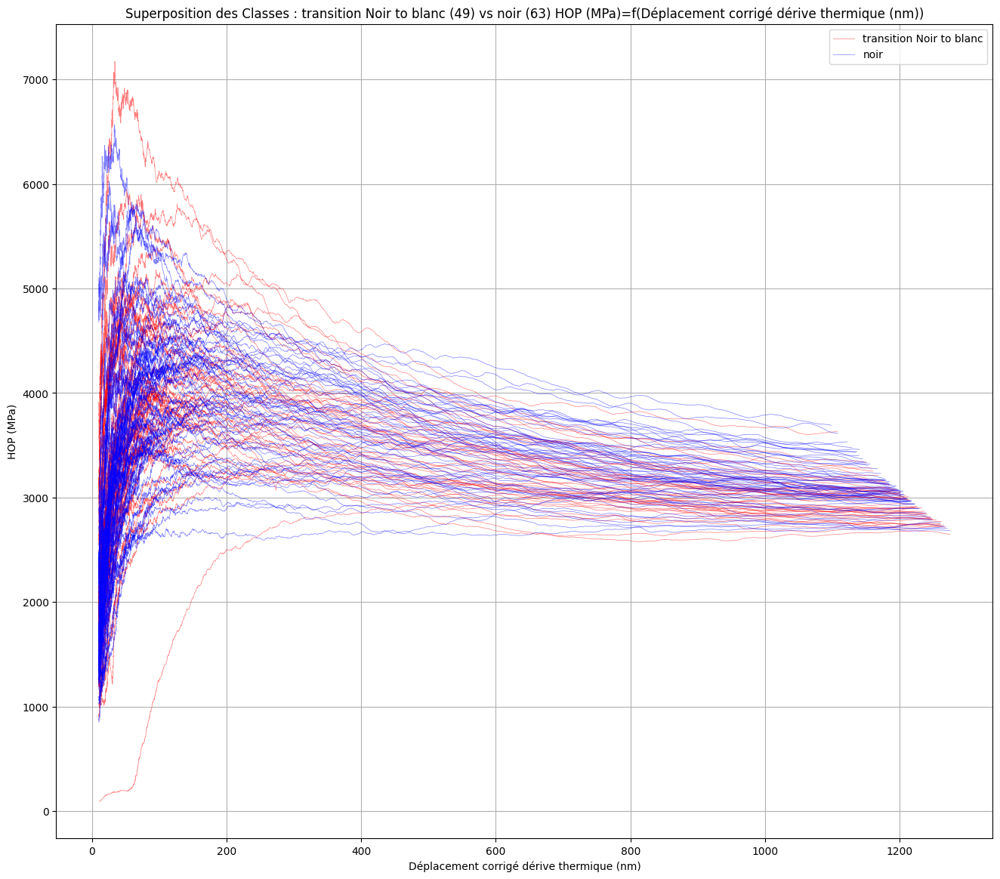

In [32]:
plot_two_classes_overlay(class_comp_NtoB_data, 
                         class_comp_N_data, 
                          col1=COMP_DISPLACEMENT_COL, 
                         col2=Hardness,
                        label1='transition Noir to blanc', color1='red',
                         label2='noir', color2='blue')

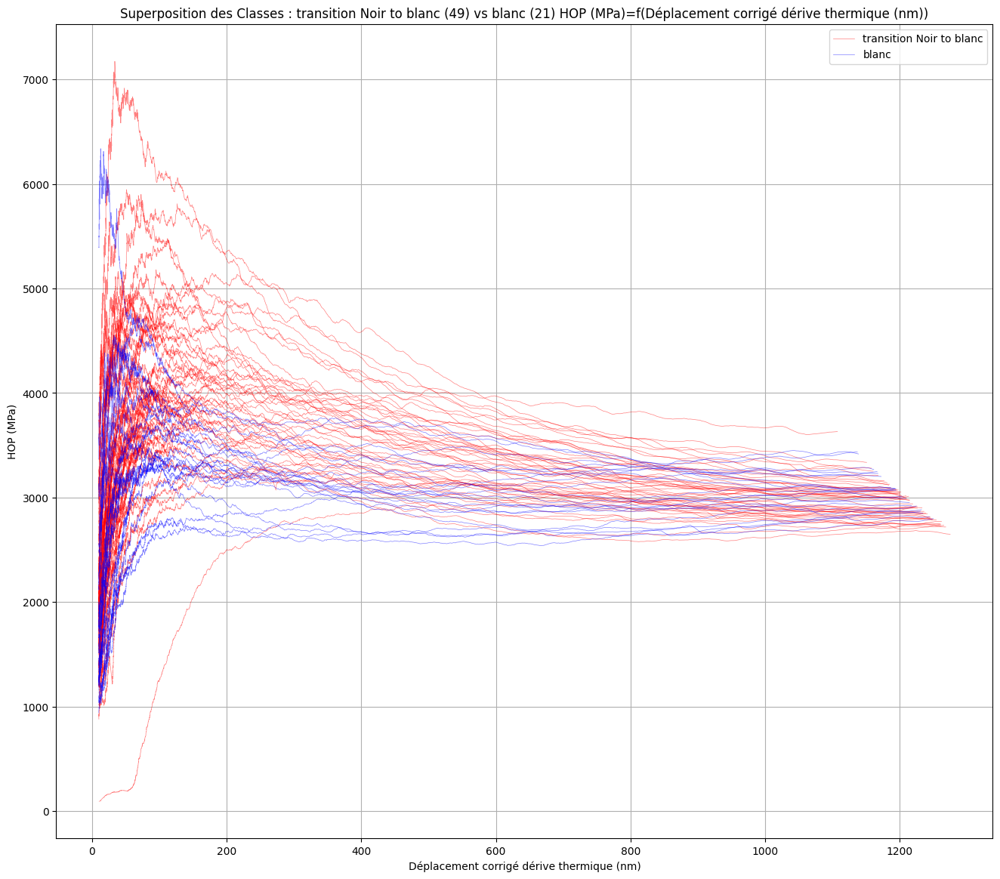

In [33]:
plot_two_classes_overlay(class_comp_NtoB_data, 
                         class_comp_B_data, 
                          col1=COMP_DISPLACEMENT_COL, 
                         col2=Hardness,
                        label1='transition Noir to blanc', color1='red',
                         label2='blanc', color2='blue')

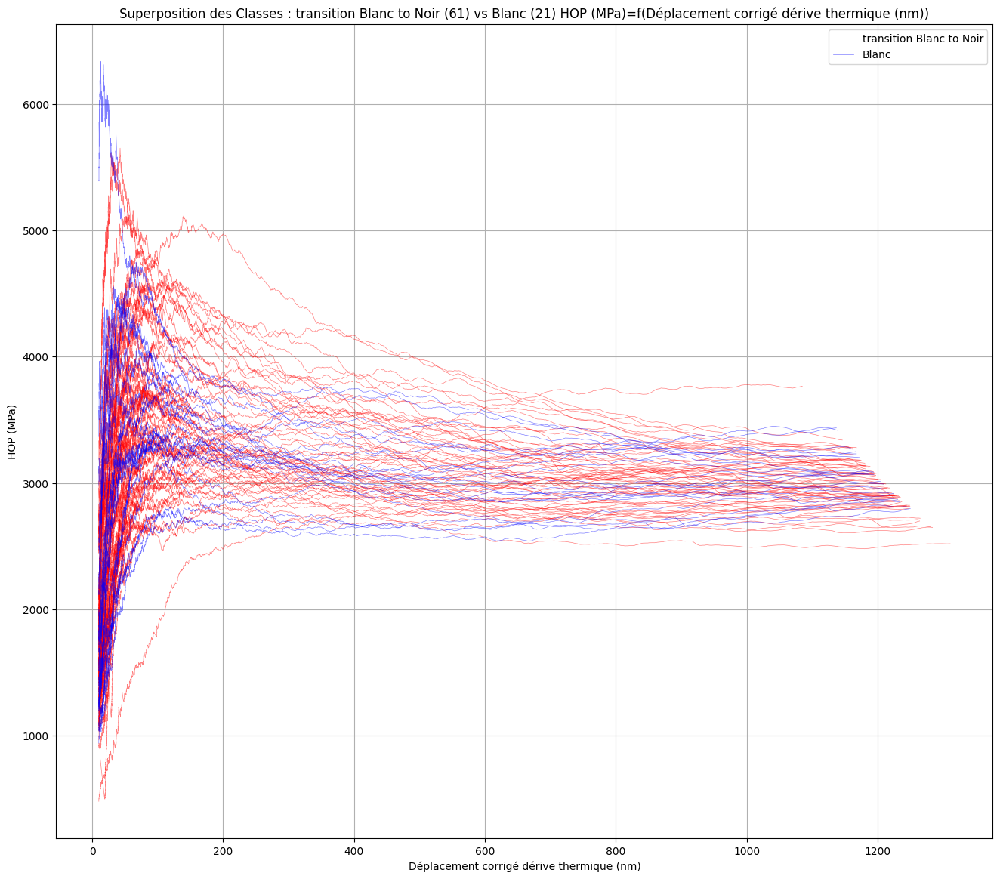

In [34]:
plot_two_classes_overlay(class_comp_BtoN_data, 
                         class_comp_B_data, 
                          col1=COMP_DISPLACEMENT_COL, 
                         col2=Hardness,
                        label1='transition Blanc to Noir', color1='red',
                         label2='Blanc', color2='blue')

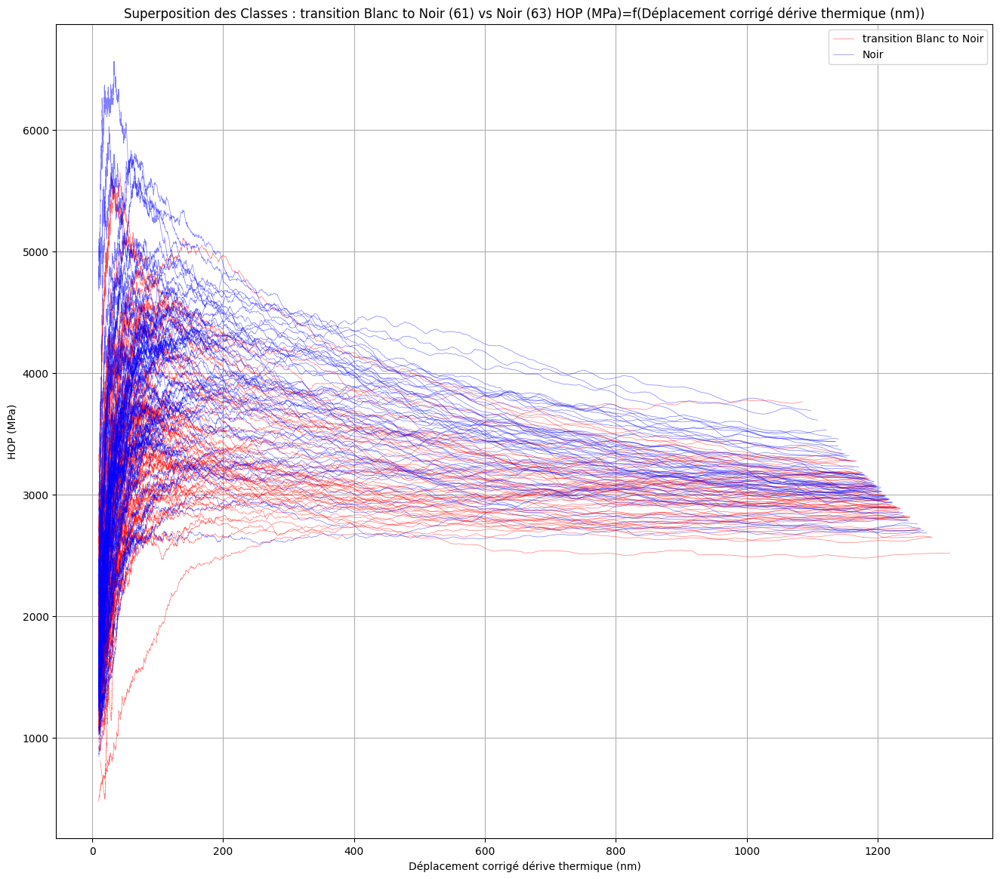

In [35]:
plot_two_classes_overlay(class_comp_BtoN_data, 
                         class_comp_N_data, 
                          col1=COMP_DISPLACEMENT_COL, 
                         col2=Hardness,
                        label1='transition Blanc to Noir', color1='red',
                         label2='Noir', color2='blue')

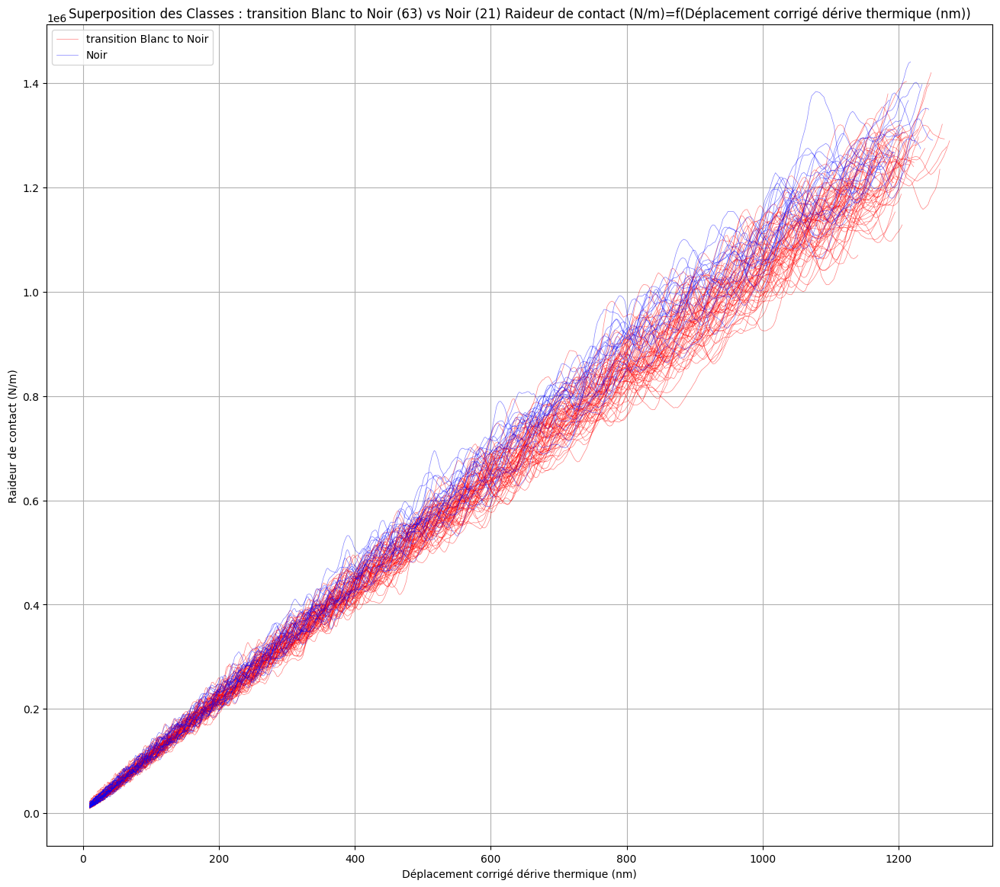

In [36]:
plot_two_classes_overlay(class_comp_N_data, 
                         class_comp_B_data, 
                          col1=COMP_DISPLACEMENT_COL, 
                         col2=raideur,
                        label1='transition Blanc to Noir', color1='red',
                         label2='Noir', color2='blue')

 1. Différences de niveaux de dureté (HOP)
Noir (Perlite) :

Les courbes en bleu (Noir) montrent des valeurs de dureté plus élevées, en particulier dans les premières centaines de nanomètres.

Ceci est cohérent avec le fait que la perlite est plus dure que la ferrite.

Blanc (Ferrite) :

Les courbes en rouge (Blanc) restent généralement en dessous des courbes perlite, avec un pic plus modéré.

Cela reflète bien la nature plus douce de la ferrite.

 2. Transitions de phases (B → N et N → B)
Transition B → N :

Démarre avec une dureté plus basse (ferrite), puis la courbe monte rapidement à un niveau plus élevé, caractéristique de la perlite.

Cela indique que l’indenteur commence sur un grain blanc puis pénètre dans un noir.

Transition N → B :

L’inverse est visible : un haut niveau initial de HOP suivi d’une diminution progressive, indiquant une sortie de la perlite vers la ferrite.

Observation commune : Ces courbes de transition ont souvent des formes intermédiaires ou des dérivées marquées (changements rapides de pente), indiquant le changement de phase.

 3. Courbes mixtes (transition)
Les courbes de transition (en rouge sur certaines figures) montrent une plus grande variabilité :

Cela reflète la nature hétérogène des zones touchées par l’indenteur.

La dispersion est plus grande, surtout entre 200 nm et 600 nm, ce qui pourrait indiquer la profondeur typique des transitions de phase.

 4. Consistance sur les comparaisons
Dans toutes les comparaisons :

Les classes pures (noir vs blanc) sont bien distinguables.

Les transitions sont plus floues mais plus riches en information, potentiellement utiles pour des méthodes de détection de frontière de phase.

## Réduction dimentionnelle et observation des classes obtenues

In [37]:
from scipy.stats import skew, kurtosis
from scipy.signal import find_peaks
import numpy as np

def extract_features_from_curve(df):
    features = {}
    
    h = df['Déplacement corrigé dérive thermique (nm)'].values
    H = df['HOP (MPa)'].values

    valid = h >= 0
    h = h[valid]
    H = H[valid]

    # Corriger les problèmes de gradient (h doit être strictement croissant)
    sorted_indices = np.argsort(h)
    h = h[sorted_indices]
    H = H[sorted_indices]

    _, unique_indices = np.unique(h, return_index=True)
    h = h[unique_indices]
    H = H[unique_indices]

    if len(H) == 0:
        return {}

    features.update({
        'max_HOP': np.max(H),
        'min_HOP': np.min(H),
        'mean_HOP': np.mean(H),
        'std_HOP': np.std(H),
        'range_HOP': np.ptp(H),
        'skew_HOP': skew(H),
        'kurtosis_HOP': kurtosis(H)
    })

    dH_dh = np.gradient(H, h)
    d2H_dh2 = np.gradient(dH_dh, h)

    features.update({
        'max_abs_dH_dh': np.max(np.abs(dH_dh)),
        'mean_dH_dh': np.mean(dH_dh),
        'std_dH_dh': np.std(dH_dh),
        'max_abs_d2H_dh2': np.max(np.abs(d2H_dh2)),
        'n_peaks_dH_dh': len(find_peaks(np.abs(dH_dh))[0]),
        'n_peaks_d2H_dh2': len(find_peaks(np.abs(d2H_dh2))[0])
    })

    segment_edges = [0, 200, 500, 800, np.inf]
    for i in range(len(segment_edges) - 1):
        mask = (h >= segment_edges[i]) & (h < segment_edges[i+1])
        if np.any(mask):
            segment = H[mask]
            features.update({
                f'segment_{i}_mean_HOP': np.mean(segment),
                f'segment_{i}_std_HOP': np.std(segment),
                f'segment_{i}_max_HOP': np.max(segment),
                f'segment_{i}_min_HOP': np.min(segment),
            })

    initial_mask = h <= 50
    if np.sum(initial_mask) > 2:
        poly = np.polyfit(h[initial_mask], H[initial_mask], 1)
        features['initial_stiffness'] = poly[0]
    else:
        features['initial_stiffness'] = np.nan

    return features


In [38]:
features_list = []

for test_id, df in merged_data_dict.items():
    feats = extract_features_from_curve(df)
    if feats:
        feats['test_id'] = test_id
        features_list.append(feats)

df_features = pd.DataFrame(features_list)


In [39]:
df_features

,max_HOP,min_HOP,mean_HOP,std_HOP,range_HOP,skew_HOP,kurtosis_HOP,max_abs_dH_dh,mean_dH_dh,std_dH_dh,max_abs_d2H_dh2,n_peaks_dH_dh,n_peaks_d2H_dh2,segment_0_mean_HOP,segment_0_std_HOP,segment_0_max_HOP,segment_0_min_HOP,segment_1_mean_HOP,segment_1_std_HOP,segment_1_max_HOP,segment_1_min_HOP,segment_2_mean_HOP,segment_2_std_HOP,segment_2_max_HOP,segment_2_min_HOP,segment_3_mean_HOP,segment_3_std_HOP,segment_3_max_HOP,segment_3_min_HOP,initial_stiffness,test_id
0,4328.970551,0.000000,3031.804990,1093.891534,4328.970551,-0.907722,-0.312247,6.398532e+05,-1728.667838,29616.407293,7.754861e+07,454,449,2746.096999,1216.893938,4328.970551,0.000000,3892.167884,209.254384,4225.952065,3561.088337,3422.763660,92.859977,3576.447120,3282.581848,3235.029830,38.282189,3292.665917,3159.620692,65.916847,001
1,3764.368196,0.000000,2830.244751,903.838877,3764.368196,-1.345413,0.675543,1.232348e+06,-4832.018029,72834.814730,6.913715e+08,446,451,2662.127750,1083.646650,3764.368196,0.000000,3201.000151,39.872525,3316.208939,3114.462316,3127.647607,8.736057,3146.790089,3110.142651,3028.268506,56.986167,3118.735999,2946.217845,77.849894,002
2,5947.255954,0.000000,3952.700359,1413.157282,5947.255954,-0.573498,-0.261993,9.984621e+05,-3528.315446,74647.924250,2.140320e+08,432,445,4162.871838,1658.282323,5947.255954,0.000000,3819.444916,295.791546,4408.750670,3424.317690,3293.533998,71.604569,3429.040093,3203.833090,3145.371803,40.780977,3225.516968,3079.927264,117.748774,003
3,4851.549154,0.000000,3626.064691,1189.646786,4851.549154,-1.168845,0.527181,7.704728e+05,-1919.995125,41913.108680,9.463694e+07,427,474,3558.753361,1399.575903,4851.549154,0.000000,4137.741771,301.333310,4764.188476,3724.315534,3568.394628,106.725165,3737.704333,3361.294685,3221.537658,64.761302,3353.005489,3119.169225,99.790478,004
4,5844.495931,0.000000,4082.538233,1371.603515,5844.495931,-0.860425,0.213207,5.357497e+06,6706.284078,222878.133902,1.017927e+10,433,462,4040.624788,1587.089006,5844.495931,0.000000,4727.855308,393.198046,5369.839549,4043.721744,3772.836180,154.792958,4046.315588,3564.649138,3421.831066,60.863036,3572.575432,3336.470044,84.921540,005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190,3740.700559,-16.782573,2951.883921,803.565247,3757.483133,-1.591877,2.146556,9.328359e+05,-2557.200264,54836.024069,1.282950e+09,446,446,2830.373782,948.212912,3740.700559,-16.782573,3427.891222,124.567890,3598.886839,3179.347776,3025.861926,79.183083,3176.510622,2903.669207,2886.361748,11.116416,2916.828181,2866.089612,58.440358,195
191,4384.335325,0.000000,3045.846634,1161.155468,4384.335325,-0.679676,-0.798201,2.320119e+06,648.619626,93595.584953,1.282067e+08,415,444,2721.689547,1259.685439,4384.335325,0.000000,4102.842700,120.379979,4299.650917,3813.015949,3478.000668,174.441870,3807.278607,3229.698321,3112.119638,55.947796,3221.976589,3032.687951,55.695056,196
192,4130.740351,0.000000,3136.372303,896.210508,4130.740351,-1.431742,1.495649,4.528757e+05,852.969400,20577.749510,1.012476e+08,459,471,2987.841786,1056.267841,4130.740351,0.000000,3633.529898,135.117371,3819.568836,3381.288653,3269.417633,52.652239,3381.001264,3194.477954,3173.486099,58.113814,3255.298034,3073.062072,64.649089,197
193,3840.882075,0.000000,3111.870104,872.657411,3840.882075,-1.518795,1.563094,7.045631e+05,-866.071250,35837.604022,5.511458e+07,451,476,2877.610328,980.904283,3840.882075,0.000000,3718.346807,47.802629,3801.978649,3617.055636,3600.477502,119.646684,3787.310756,3350.071647,3163.350431,117.012807,3338.328834,2936.071049,64.794445,198


In [40]:
pip install umap-learn


Note: you may need to restart the kernel to use updated packages.


/Users/lfu/opt/miniconda3/envs/gym/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/Users/lfu/opt/miniconda3/envs/gym/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
/Users/lfu/opt/miniconda3/envs/gym/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


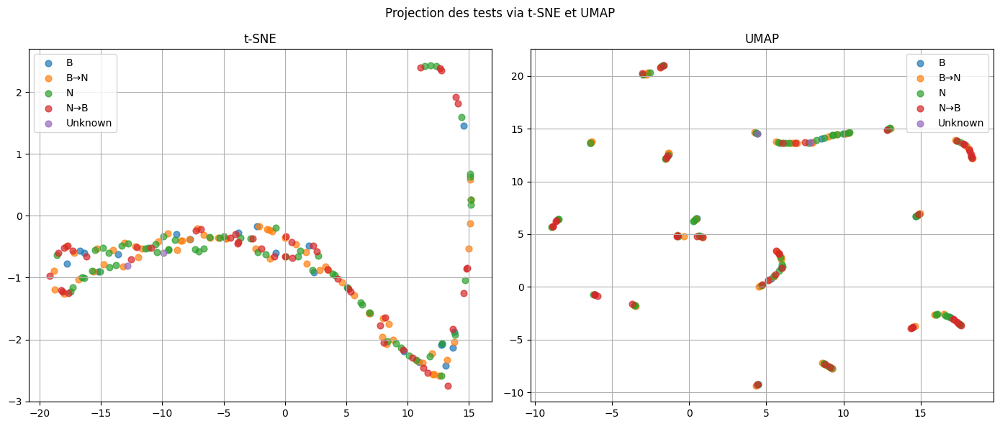

In [41]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import umap.umap_ as umap
# --- Dictionnaires de classes ---


# --- Charger les features ---
df = df_features.copy()

# --- Attribuer les labels de classe ---
def assign_class(test_id):
    if test_id in class_N_test_ids:
        return 'N'
    elif test_id in class_B_test_ids:
        return 'B'
    elif test_id in class_NtoB_test_ids:
        return 'N→B'
    elif test_id in class_BtoN_test_ids:
        return 'B→N'
    else:
        return 'Unknown'

df['class'] = df['test_id'].apply(assign_class)

# --- Sélectionner les features numériques ---
feature_cols = [col for col in df.columns if col not in ['test_id', 'class']]
features = df[feature_cols].values
labels = df['class'].values

# --- t-SNE ---
tsne_result = TSNE(n_components=2, random_state=42).fit_transform(features)

# --- UMAP (correct usage) ---
umap_model = umap.UMAP(n_neighbors=5, random_state=42).fit(features)
umap_result = umap_model.embedding_

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

for ax, result, title in zip(axes, [tsne_result, umap_result], ['t-SNE', 'UMAP']):
    for class_name in np.unique(labels):
        idx = labels == class_name
        ax.scatter(result[idx, 0], result[idx, 1], label=class_name, s=40, alpha=0.7)
    ax.set_title(title)
    ax.legend()
    ax.grid(True)

plt.suptitle("Projection des tests via t-SNE et UMAP")
plt.tight_layout()
plt.show()


In [42]:
from scipy.stats import skew, kurtosis
from scipy.signal import find_peaks
import numpy as np

def extract_features_from_curve_limited(df):
    features = {}

    # Get the data
    h = df['Déplacement corrigé dérive thermique (nm)'].values
    H = df['HOP (MPa)'].values

    # Keep only valid and sorted unique points
    valid = (h >= 200) & (h <= 600)
    h = h[valid]
    H = H[valid]

    if len(h) == 0 or len(H) == 0:
        return {}

    # Sort and ensure uniqueness
    sorted_indices = np.argsort(h)
    h = h[sorted_indices]
    H = H[sorted_indices]

    _, unique_indices = np.unique(h, return_index=True)
    h = h[unique_indices]
    H = H[unique_indices]

    # --- Basic stats ---
    features.update({
        'max_HOP': np.max(H),
        'min_HOP': np.min(H),
        'mean_HOP': np.mean(H),
        'std_HOP': np.std(H),
        'range_HOP': np.ptp(H),
        'skew_HOP': skew(H),
        'kurtosis_HOP': kurtosis(H)
    })

    # --- Derivatives ---
    dH_dh = np.gradient(H, h)
    d2H_dh2 = np.gradient(dH_dh, h)

    features.update({
        'max_abs_dH_dh': np.max(np.abs(dH_dh)),
        'mean_dH_dh': np.mean(dH_dh),
        'std_dH_dh': np.std(dH_dh),
        'max_abs_d2H_dh2': np.max(np.abs(d2H_dh2)),
        'n_peaks_dH_dh': len(find_peaks(np.abs(dH_dh))[0]),
        'n_peaks_d2H_dh2': len(find_peaks(np.abs(d2H_dh2))[0])
    })

    # --- Segments within [200, 600] only ---
    segment_edges = [200, 300, 400, 500, 600]
    for i in range(len(segment_edges) - 1):
        mask = (h >= segment_edges[i]) & (h < segment_edges[i+1])
        if np.any(mask):
            segment = H[mask]
            features.update({
                f'segment_{i}_mean_HOP': np.mean(segment),
                f'segment_{i}_std_HOP': np.std(segment),
                f'segment_{i}_max_HOP': np.max(segment),
                f'segment_{i}_min_HOP': np.min(segment),
            })

    # --- "Initial" stiffness in this context = slope between 200–250 nm (optional) ---
    stiffness_mask = (h >= 200) & (h <= 250)
    if np.sum(stiffness_mask) > 2:
        poly = np.polyfit(h[stiffness_mask], H[stiffness_mask], 1)
        features['initial_stiffness_200_250nm'] = poly[0]
    else:
        features['initial_stiffness_200_250nm'] = np.nan

    return features


In [43]:
features_list = []

for test_id, df in merged_data_dict.items():
    feats = extract_features_from_curve_limited(df)
    if feats:
        feats['test_id'] = test_id
        features_list.append(feats)

features = pd.DataFrame(features_list)


/Users/lfu/opt/miniconda3/envs/gym/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


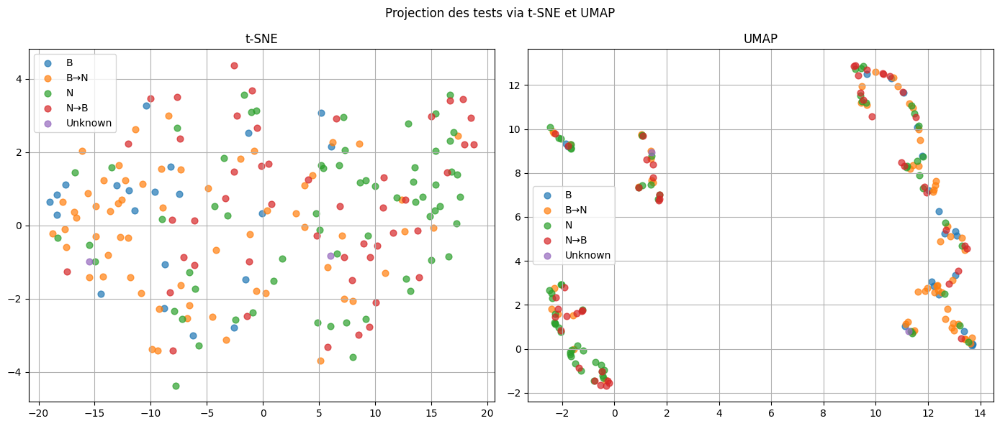

In [44]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import umap.umap_ as umap
# --- Dictionnaires de classes ---


# --- Charger les features ---
df = features.copy()

# --- Attribuer les labels de classe ---
def assign_class(test_id):
    if test_id in class_N_test_ids:
        return 'N'
    elif test_id in class_B_test_ids:
        return 'B'
    elif test_id in class_NtoB_test_ids:
        return 'N→B'
    elif test_id in class_BtoN_test_ids:
        return 'B→N'
    else:
        return 'Unknown'

df['class'] = df['test_id'].apply(assign_class)

# --- Sélectionner les features numériques ---
feature_cols = [col for col in df.columns if col not in ['test_id', 'class']]
features = df[feature_cols].values
labels = df['class'].values

# --- t-SNE ---
tsne_result = TSNE(n_components=2, random_state=42).fit_transform(features)

# --- UMAP (correct usage) ---
umap_model = umap.UMAP(n_neighbors=5, random_state=42).fit(features)
umap_result = umap_model.embedding_

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

for ax, result, title in zip(axes, [tsne_result, umap_result], ['t-SNE', 'UMAP']):
    for class_name in np.unique(labels):
        idx = labels == class_name
        ax.scatter(result[idx, 0], result[idx, 1], label=class_name, s=40, alpha=0.7)
    ax.set_title(title)
    ax.legend()
    ax.grid(True)

plt.suptitle("Projection des tests via t-SNE et UMAP")
plt.tight_layout()
plt.show()


## visualisation du bruit

In [45]:

# Nouveau dictionnaire pour stocker les dérivées
derivative_data_dict = {}

for test_id, df in merged_data_dict.items():
    if 'Déplacement corrigé dérive thermique (nm)' in df.columns and 'HOP (MPa)' in df.columns:
        h = df['Déplacement corrigé dérive thermique (nm)'].values
        H = df['HOP (MPa)'].values

        # Filtrer entre 0 et 600 nm
        mask = (h>= 0) & (h<=200)
        h_filtered = h[mask]
        H_filtered = H[mask]

        # Ordonner h et H
        sorted_indices = np.argsort(h_filtered)
        h_sorted = h_filtered[sorted_indices]
        H_sorted = H_filtered[sorted_indices]

        # Supprimer doublons
        _, unique_indices = np.unique(h_sorted, return_index=True)
        h_unique = h_sorted[unique_indices]
        H_unique = H_sorted[unique_indices]

        # Calcul dérivée si possible
        if len(H_unique) > 1:
            dH_dh = np.gradient(H_unique, h_unique)
            df_derivative = pd.DataFrame({
                'Déplacement corrigé dérive thermique (nm)': h_unique,
                'dH_dh': dH_dh
            })
            derivative_data_dict[test_id] = df_derivative


In [46]:
derivative_data_dict

{'001':       Déplacement corrigé dérive thermique (nm)        dH_dh
 0                                      0.000000    24.897814
 1                                      0.345195   141.651539
 2                                      0.501730   280.423422
 3                                      0.603941   260.925023
 4                                      0.940740  1036.877320
 ...                                         ...          ...
 1073                                 196.851293     9.991157
 1074                                 197.258486    10.995279
 1075                                 198.374077     3.000062
 1076                                 198.892117     4.485718
 1077                                 199.764465    -8.884705
 
 [1078 rows x 2 columns],
 '002':       Déplacement corrigé dérive thermique (nm)       dH_dh
 0                                      0.000000  121.252806
 1                                      0.215801  131.013216
 2                             

In [47]:
# Correct filtering for each class
class_N_data = {test_id: df for test_id, df in derivative_data_dict.items() if test_id in class_N_test_ids}
class_B_data = {test_id: df for test_id, df in derivative_data_dict.items() if test_id in class_B_test_ids}
class_NtoB_data = {test_id: df for test_id, df in derivative_data_dict.items() if test_id in class_NtoB_test_ids}
class_BtoN_data = {test_id: df for test_id, df in derivative_data_dict.items() if test_id in class_BtoN_test_ids}


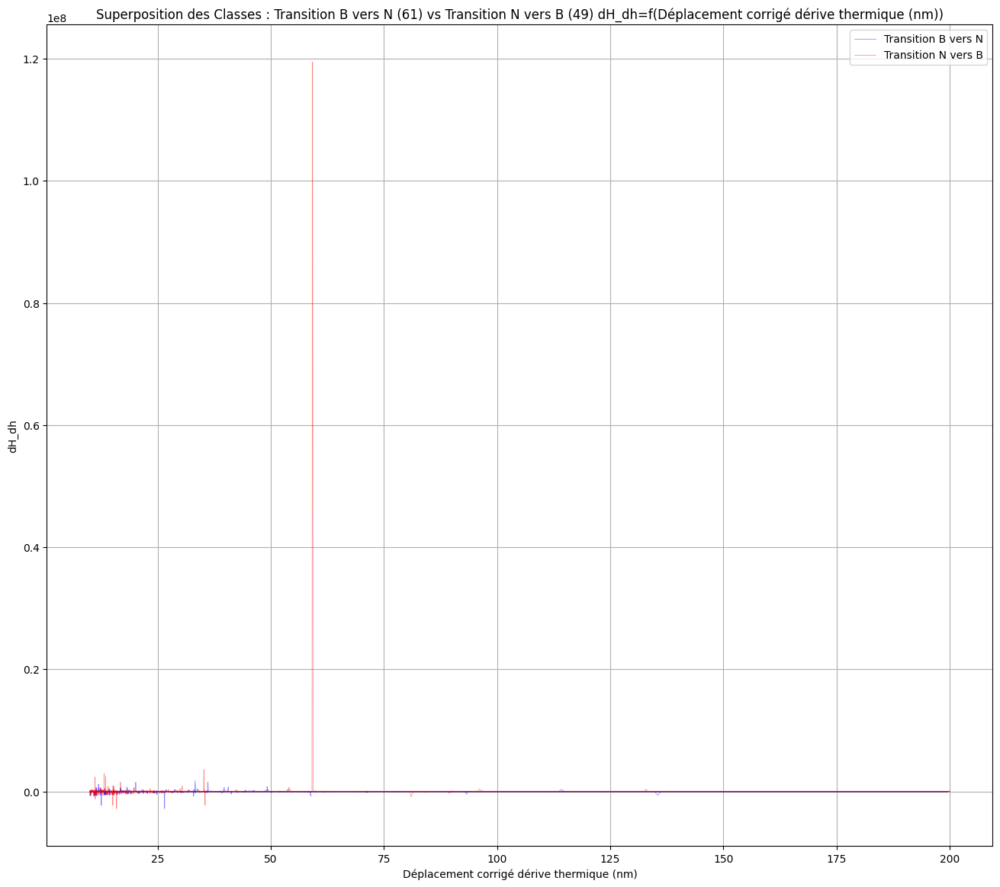

In [48]:
dH_dh="dH_dh"
plot_two_classes_overlay(class_BtoN_data, 
                         class_NtoB_data, 
                          col1=COMP_DISPLACEMENT_COL, 
                         col2=dH_dh,
                        label1='Transition B vers N', color1='blue',
                         label2='Transition N vers B', color2='red')

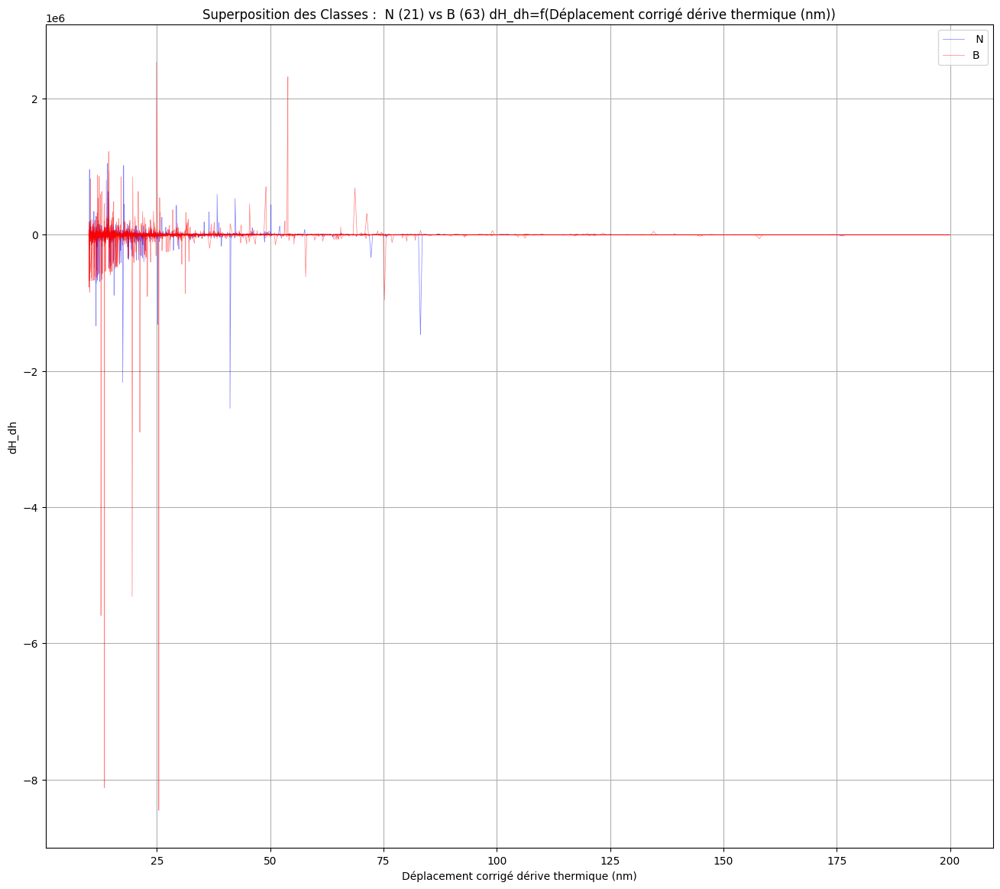

In [49]:
plot_two_classes_overlay(class_B_data, 
                         class_N_data, 
                          col1=COMP_DISPLACEMENT_COL, 
                         col2=dH_dh,
                        label1=' N', color1='blue',
                         label2='B', color2='red')

## Elimination du bruit par lissage avec algorithme de Savitzky-Golay

In [50]:
import numpy as np
from scipy.signal import savgol_filter

def apply_savgol_filter(df, window_length=51, polyorder=2):
    """
    Applique le filtre Savitzky-Golay sur la colonne HOP pour les déplacements > 0
    """
    # Copie du DataFrame
    df_smoothed = df.copy()
    
    # Séparation des données selon le déplacement
    displacement = df['Déplacement corrigé dérive thermique (nm)'].values
    hop = df['HOP (MPa)'].values
    
    # Identifier les indices où le déplacement est positif
    positive_mask = displacement > 0
    negative_mask = ~positive_mask
    
    # Traiter uniquement les points avec déplacement > 0
    if np.any(positive_mask):
        disp_pos = displacement[positive_mask]
        hop_pos = hop[positive_mask]
        
        # Vérifier la taille de la fenêtre
        n_points = len(disp_pos)
        if n_points < window_length:
            window_length = max(3, n_points - 1) if n_points % 2 == 0 else max(3, n_points)
        
        # Vérifier l'équidistance des points
        diffs = np.diff(disp_pos)
        if len(diffs) > 0 and np.std(diffs) > 0.1 * np.mean(diffs):
            # Rééchantillonnage sur grille régulière
            disp_new = np.linspace(disp_pos.min(), disp_pos.max(), n_points)
            hop_interp = np.interp(disp_new, disp_pos, hop_pos)
            hop_smooth = savgol_filter(hop_interp, window_length, polyorder)
            # Réinterpolation sur les points originaux
            hop_smooth = np.interp(disp_pos, disp_new, hop_smooth)
        else:
            hop_smooth = savgol_filter(hop_pos, window_length, polyorder)
        
        # Mettre à jour les valeurs lissées
        df_smoothed.loc[positive_mask, 'HOP (MPa)'] = hop_smooth
    
    # Conserver les valeurs originales pour les déplacements négatifs
    return df_smoothed

# Application à toutes les entrées du dictionnaire
smoothed_comb_data_dict = {}
for test_id, df in merged_data_dict.items():
    smoothed_comb_data_dict[test_id] = apply_savgol_filter(df)

In [51]:
# Correct filtering for each class
class_N_data_liss = {test_id: df for test_id, df in smoothed_comb_data_dict.items() if test_id in class_N_test_ids}
class_B_data_liss = {test_id: df for test_id, df in smoothed_comb_data_dict.items() if test_id in class_B_test_ids}
class_NtoB_data_liss = {test_id: df for test_id, df in smoothed_comb_data_dict.items() if test_id in class_NtoB_test_ids}
class_BtoN_data_liss = {test_id: df for test_id, df in smoothed_comb_data_dict.items() if test_id in class_BtoN_test_ids}


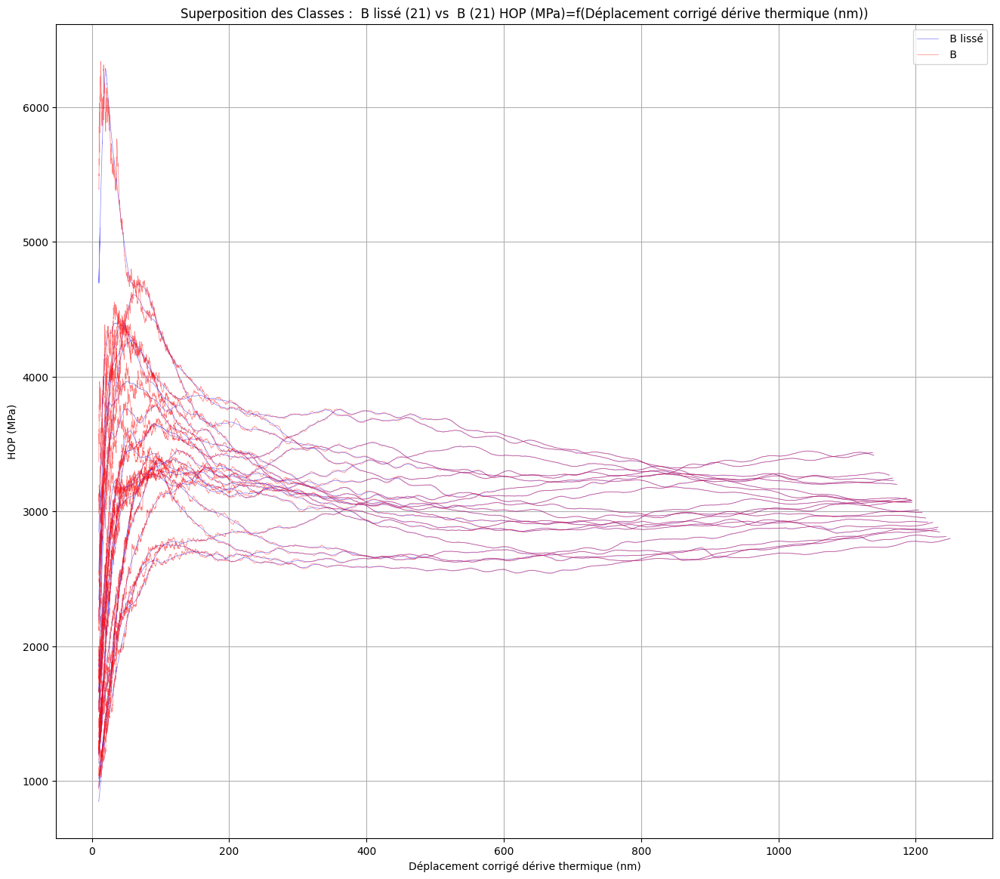

In [52]:
plot_two_classes_overlay(class_B_data_liss, 
                         class_comp_B_data, 
                          col1=COMP_DISPLACEMENT_COL, 
                         col2=Hardness,
                        label1=' B lissé', color1='blue',
                         label2=' B', color2='red')

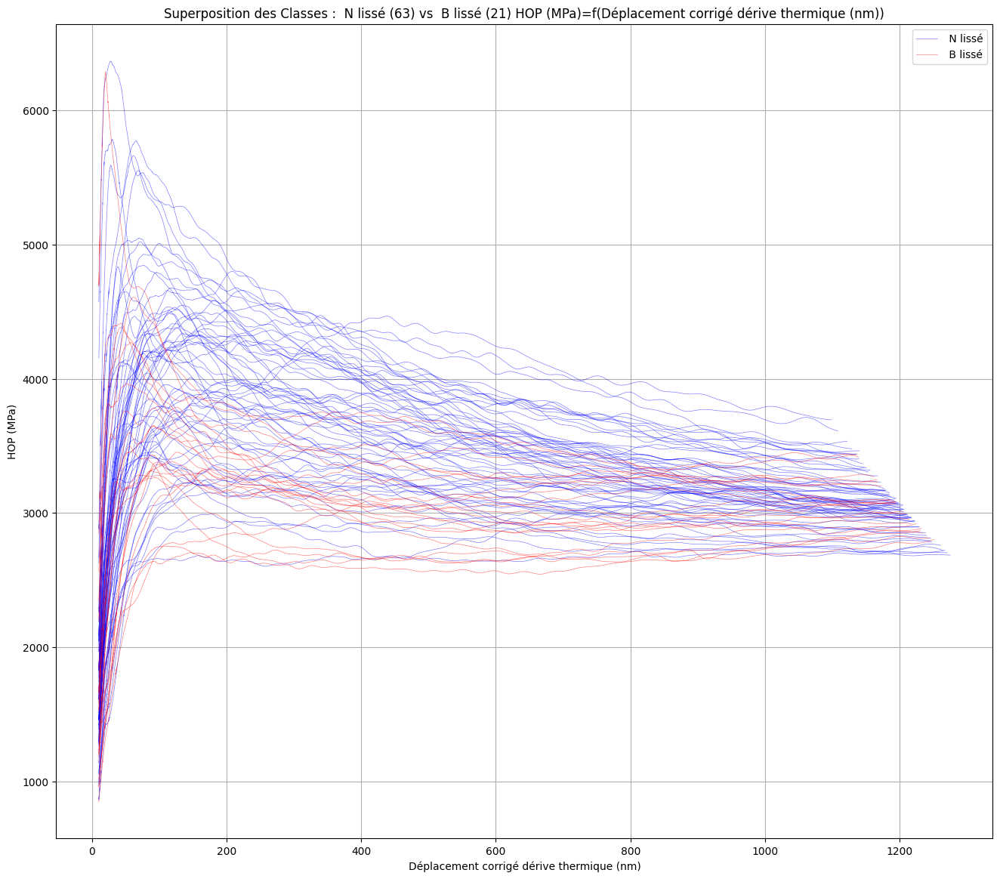

In [53]:
plot_two_classes_overlay(class_N_data_liss, 
                         class_B_data_liss, 
                          col1=COMP_DISPLACEMENT_COL, 
                         col2=Hardness,
                        label1=' N lissé', color1='blue',
                         label2=' B lissé', color2='red')

## comparaison des courbes des tests aux courbes de polynomes de réference obtenus par regression polynomiale :


1. **Lissage des données avec Savitzky-Golay** :
   - Appliqué uniquement sur les points où le déplacement est positif.
   - Pour chaque test, on a lissé la colonne 'HOP (MPa)' en utilisant une fenêtre de taille adaptée.
2. **Création des polynômes de référence pour les classes N et B** :
   - Pour chaque phase pure (N et B), nous avons collecté toutes les courbes (après lissage et pour déplacement > 0).
   - Nous avons interpolé chaque courbe sur une grille commune `common_h` (100 points entre le déplacement minimal et maximal).
   - Calcul de la courbe médiane pour chaque phase.
   - Ajustement d'un polynôme de degré 4 sur cette courbe médiane.
3. **Calcul des distances** :
   - Pour chaque test (uniquement déplacement > 0), nous avons interpolé la courbe HOP sur la grille commune `common_h`.
   - Calcul de la distance RMSE entre cette courbe interpolée et les prédictions des polynômes de référence (pour N et B).
4. **Classification** :
   - Calcul d'un seuil basé sur le 95ème percentile des distances intra-classe (pour les classes N et B).
   - Pour chaque test, on compare les distances à N et B avec ce seuil :
     - Si les deux distances sont en dessous du seuil → classe mixte (transition).
     - Si seule la distance à N est en dessous → classe N.
     - Si seule la distance à B est en dessous → classe B.
     - Sinon → indéterminé.
### Affichage des informations :

1. Afficher les coefficients des polynômes de référence.
2. Afficher les distances pour chaque test.
3. Afficher le seuil de classification.
4. Afficher les résultats de classification.

In [54]:
from sklearn.metrics.pairwise import cosine_similarity

# Normalize and compute cosine similarity → convert to distance
def cosine_distance(y1, y2):
    y1_norm = (y1 - np.mean(y1)) / np.std(y1)
    y2_norm = (y2 - np.mean(y2)) / np.std(y2)
    return 1 - cosine_similarity([y1_norm], [y2_norm])[0][0]  # Smaller is better

1. rescaling to a commun grid

we have Different h values across tests (not aligned).

so we can’t just average point-by-point because they’re not measured at the same h

common_h = np.linspace(h_min, h_max, 100)

This means:

we create 100 evenly spaced h values, e.g. from 150 to 800.

Then for each test, we interpolate its curve to get values of HOP at exactly these 100 h points.

hop_interp = np.interp(common_h, h, hop)

np.interp means:

→ “At the value common_h[i], estimate what HOP would have been using linear interpolation between known points of h and hop”.

Now, all curves are evaluated on the same 100 h-points.

So we can do:

Medians point by point

Fit a polynomial to the median curve

Compare test curves to the reference

Without this step, it would be mathematically invalid to compute distances between curves.

2. What’s a Polynomial Model Doing Here?
When we do:


poly_model.fit(common_h.reshape(-1, 1), median_curve)
We are:

Fitting a 4th-degree polynomial (a₀ + a₁x + a₂x² + a₃x³ + a₄x⁴)

To the median HOP curve over the common grid common_h.

So the polynomial "learns" to approximate the shape of that phase’s behavior (e.g., N or B).



In [55]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline

# Organisation des classes
classes = {
    'N': class_N_test_ids,
    'B': class_B_test_ids,
    'NtoB': class_NtoB_test_ids,
    'BtoN': class_BtoN_test_ids
}

# 1. Création des polynômes de référence pour N et B (uniquement déplacement > 0)
reference_polynomials = {}
reference_curves = {}

for phase in ['N', 'B']:
    all_curves = []
    common_h = None
    
    for test_id in classes[phase]:
        df = smoothed_comb_data_dict[test_id]
        
        # Filtrer les points avec déplacement > 0
        positive_mask = df['Déplacement corrigé dérive thermique (nm)'] > 150
        if not positive_mask.any():
            continue
            
        h = df.loc[positive_mask, 'Déplacement corrigé dérive thermique (nm)'].values
        hop = df.loc[positive_mask, 'HOP (MPa)'].values
        
        if common_h is None:
            common_h = np.linspace(min(h), max(h), 100)
        else:
            h_min = min(common_h.min(), min(h))
            h_max = max(common_h.max(), max(h))
            common_h = np.linspace(h_min, h_max, 100)
        
        hop_interp = np.interp(common_h, h, hop)
        all_curves.append(hop_interp)
    
    if not all_curves:
        continue
        
    # Courbe médiane et polynôme de référence
    median_curve = np.median(all_curves, axis=0)
    reference_curves[phase] = (common_h, median_curve)
    
    poly_model = make_pipeline(PolynomialFeatures(degree=4), LinearRegression())
    poly_model.fit(common_h.reshape(-1, 1), median_curve)
    reference_polynomials[phase] = poly_model

# 2. Calcul des distances pour toutes les courbes (déplacement > 0)
results = {}

for test_id, df in smoothed_comb_data_dict.items():
    # Filtrer les points positifs
    positive_mask = df['Déplacement corrigé dérive thermique (nm)'] > 150
    if not positive_mask.any():
        results[test_id] = {'N': np.inf, 'B': np.inf}
        continue
        
    h = df.loc[positive_mask, 'Déplacement corrigé dérive thermique (nm)'].values
    hop = df.loc[positive_mask, 'HOP (MPa)'].values
    
    # Interpolation sur grille commune
    hop_interp = np.interp(common_h, h, hop)
    
    # Calcul des distances
    distances = {}
    for phase in ['N', 'B']:
        if phase in reference_polynomials:
            pred = reference_polynomials[phase].predict(common_h.reshape(-1, 1)).flatten()
            distances[phase] = cosine_distance(hop_interp, pred)
        else:
            distances[phase] = np.inf
    
    results[test_id] = distances

# 3. Classification basée sur les distances
def classify_test(distances, threshold_factor=1.5):
    dN = distances['N']
    dB = distances['B']
    
    # Calcul du seuil basé sur la variabilité intra-classe
    intra_distances = []
    for phase in ['N', 'B']:
        for test_id in classes[phase]:
            if test_id in results:
                intra_distances.append(results[test_id][phase])
    
    if not intra_distances:
        threshold = np.inf
    else:
        threshold = np.percentile(intra_distances, 75) * threshold_factor
    
    if dN < threshold and dB < threshold:
        return "Mixte (transition)"
    elif dN < threshold:
        return "N"
    elif dB < threshold:
        return "B"
    else:
        return "Mixte (transition)"

# Classification de tous les tests
classification_results = {}
for test_id in smoothed_comb_data_dict.keys():
    classification_results[test_id] = classify_test(results[test_id])

In [56]:
# import matplotlib.pyplot as plt

# # 1. Visualisation des polynômes de référence
# plt.figure(figsize=(10, 6))
# for phase, color in zip(['N', 'B'], ['blue', 'red']):
#     if phase in reference_polynomials:
#         h_ref, curve_ref = reference_polynomials[phase]
#         plt.plot(h_ref, curve_ref, color=color, label=f'Phase {phase}')
# plt.title('Polynômes de Référence (déplacement > 0)')
# plt.xlabel('Déplacement corrigé (nm)')
# plt.ylabel('HOP (MPa)')
# plt.legend()
# plt.grid(True)

# # # 2. Visualisation par classe (déplacement > 0)
# # fig, axs = plt.subplots(2, 2, figsize=(15, 12))
# # class_types = ['N', 'B', 'NtoB', 'BtoN']

# # for i, class_type in enumerate(class_types):
# #     ax = axs[i//2, i%2]
# #     for test_id in classes[class_type]:
# #         df = smoothed_comb_data_dict[test_id]
        
# #         # Filtrer les points positifs
# #         positive_mask = df['Déplacement corrigé dérive thermique (nm)'] > 150
# #         if not positive_mask.any():
# #             continue
            
# #         h = df.loc[positive_mask, 'Déplacement corrigé dérive thermique (nm)'].values
# #         hop = df.loc[positive_mask, 'HOP (MPa)'].values
        
# #         ax.plot(h, hop, alpha=0.6, label=f'Test {test_id}')
    
# #     ax.set_title(f'Classe {class_type} (déplacement > 0)')
# #     ax.set_xlabel('Déplacement corrigé (nm)')
# #     ax.set_ylabel('HOP (MPa)')
# #     ax.grid(True)
# #     ax.legend()

# plt.tight_layout()

In [57]:
# Afficher les expressions polynomiales
def print_polynomial_expression(model, feature_name="h"):
    coefs = model.named_steps['linearregression'].coef_
    intercept = model.named_steps['linearregression'].intercept_
    
    terms = [f"{intercept:.6f}"]
    for i, coef in enumerate(coefs[1:], start=1):
        terms.append(f"{coef:.6f} * {feature_name}^{i}")
    
    expression = " + ".join(terms)
    return expression

print("\n=== Polynômes de Référence ===")
for phase in ['N', 'B']:
    # [Code existant pour créer reference_polynomials...]
    
    # Afficher l'expression polynomiale
    expr = print_polynomial_expression(reference_polynomials[phase])
    print(f"Polynôme {phase}: HOP = {expr}")
    
    # Afficher les données utilisées pour la référence
    print(f"\nDonnées de Référence pour {phase}:")
    for test_id in classes[phase]:
        df = smoothed_comb_data_dict[test_id]
        positive_mask = df['Déplacement corrigé dérive thermique (nm)'] > 150
        h = df.loc[positive_mask, 'Déplacement corrigé dérive thermique (nm)'].values
        hop = df.loc[positive_mask, 'HOP (MPa)'].values
        
        print(f"\nTest {test_id}:")
        print(pd.DataFrame({'Déplacement': h, 'HOP': hop}).head())


=== Polynômes de Référence ===
Polynôme N: HOP = 4196.662160 + -1.588047 * h^1 + 0.000679 * h^2 + -0.000000 * h^3 + 0.000000 * h^4

Données de Référence pour N:

Test 006:
   Déplacement          HOP
0   150.283459  4705.178121
1   150.671813  4703.532053
2   151.249827  4701.935774
3   151.312200  4701.767663
4   151.749417  4700.971320

Test 011:
   Déplacement          HOP
0   150.202294  4494.483682
1   150.580869  4491.920810
2   151.182171  4487.847478
3   151.821493  4483.396910
4   152.464766  4478.599258

Test 014:
   Déplacement          HOP
0   150.251790  3997.954412
1   150.526310  3996.955768
2   151.183809  3994.421092
3   151.572394  3992.923387
4   152.408415  3989.590870

Test 015:
   Déplacement          HOP
0   150.515065  4325.105130
1   150.735627  4324.673125
2   151.238662  4323.749069
3   151.760454  4322.951558
4   152.372863  4322.271547

Test 016:
   Déplacement          HOP
0   150.159030  4105.799848
1   150.973546  4095.937204
2   151.414935  4090.568102

In [58]:
# Afficher les calculs de distance en détail
print("\n=== Calcul des Distances ===")
for test_id in smoothed_comb_data_dict.keys():
    # [Code existant pour calculer les distances...]
    
    print(f"\nTest {test_id}:")
    print(f"Distance à N: {distances['N']:.4f}")
    print(f"Distance à B: {distances['B']:.4f}")
    
    # Afficher la courbe interpolée vs prédiction
    if 'common_h' in locals():
        pred_N = reference_polynomials['N'].predict(common_h.reshape(-1, 1))
        pred_B = reference_polynomials['B'].predict(common_h.reshape(-1, 1))
        
        comparison_df = pd.DataFrame({
            'Déplacement': common_h,
            'HOP Interpolé': hop_interp,
            'Prédiction N': pred_N,
            'Prédiction B': pred_B
        })
        print(comparison_df.head(10))


=== Calcul des Distances ===

Test 001:
Distance à N: 0.0446
Distance à B: 0.1134
   Déplacement  HOP Interpolé  Prédiction N  Prédiction B
0   150.013805    3874.534857   3972.705779   3308.802558
1   161.126550    3888.451890   3957.173903   3296.390848
2   172.239295    3847.745509   3941.777895   3284.172048
3   183.352040    3807.191627   3926.516054   3272.150928
4   194.464785    3778.307320   3911.386743   3260.332074
5   205.577530    3732.009417   3896.388388   3248.719890
6   216.690275    3644.773822   3881.519478   3237.318596
7   227.803020    3586.380601   3866.778563   3226.132231
8   238.915765    3588.574956   3852.164258   3215.164652
9   250.028510    3571.307062   3837.675241   3204.419532

Test 002:
Distance à N: 0.0446
Distance à B: 0.1134
   Déplacement  HOP Interpolé  Prédiction N  Prédiction B
0   150.013805    3874.534857   3972.705779   3308.802558
1   161.126550    3888.451890   3957.173903   3296.390848
2   172.239295    3847.745509   3941.777895   3284.1

In [59]:
# Afficher les seuils et décisions
print("\n=== Classification ===")
intra_distances = []
for phase in ['N', 'B']:
    for test_id in classes[phase]:
        intra_distances.append(results[test_id][phase])

threshold = np.percentile(intra_distances, 75) * 1.5
print(f"Seuil calculé: {threshold:.4f}")

print("\nDétails de Classification:")
for test_id, classif in classification_results.items():
    dist = results[test_id]
    decision = ""
    
    if dist['N'] < threshold and dist['B'] < threshold:
        decision = f"Mixte (d_N={dist['N']:.4f} < seuil ET d_B={dist['B']:.4f} < seuil)"
    elif dist['N'] < threshold:
        decision = f"Phase N (d_N={dist['N']:.4f} < seuil)"
    elif dist['B'] < threshold:
        decision = f"Phase B (d_B={dist['B']:.4f} < seuil)"
    else:
        decision = f"Mixte (d_N={dist['N']:.4f} < seuil ET d_B={dist['B']:.4f} < seuil)"
    
    print(f"Test {test_id}: {classif} | {decision}")


=== Classification ===
Seuil calculé: 0.4020

Détails de Classification:
Test 001: Mixte (transition) | Mixte (d_N=0.0263 < seuil ET d_B=0.1592 < seuil)
Test 002: Mixte (transition) | Mixte (d_N=0.0914 < seuil ET d_B=0.3776 < seuil)
Test 003: Mixte (transition) | Mixte (d_N=0.0925 < seuil ET d_B=0.1093 < seuil)
Test 004: Mixte (transition) | Mixte (d_N=0.0242 < seuil ET d_B=0.1852 < seuil)
Test 005: Mixte (transition) | Mixte (d_N=0.0293 < seuil ET d_B=0.1426 < seuil)
Test 006: Mixte (transition) | Mixte (d_N=0.0067 < seuil ET d_B=0.2470 < seuil)
Test 007: Mixte (transition) | Mixte (d_N=0.0337 < seuil ET d_B=0.1423 < seuil)
Test 008: Mixte (transition) | Mixte (d_N=0.1264 < seuil ET d_B=0.0761 < seuil)
Test 009: Mixte (transition) | Mixte (d_N=0.9553 < seuil ET d_B=0.4904 < seuil)
Test 010: Mixte (transition) | Mixte (d_N=1.7861 < seuil ET d_B=1.3932 < seuil)
Test 011: Mixte (transition) | Mixte (d_N=0.0609 < seuil ET d_B=0.1198 < seuil)
Test 012: Mixte (transition) | Mixte (d_N=1.80

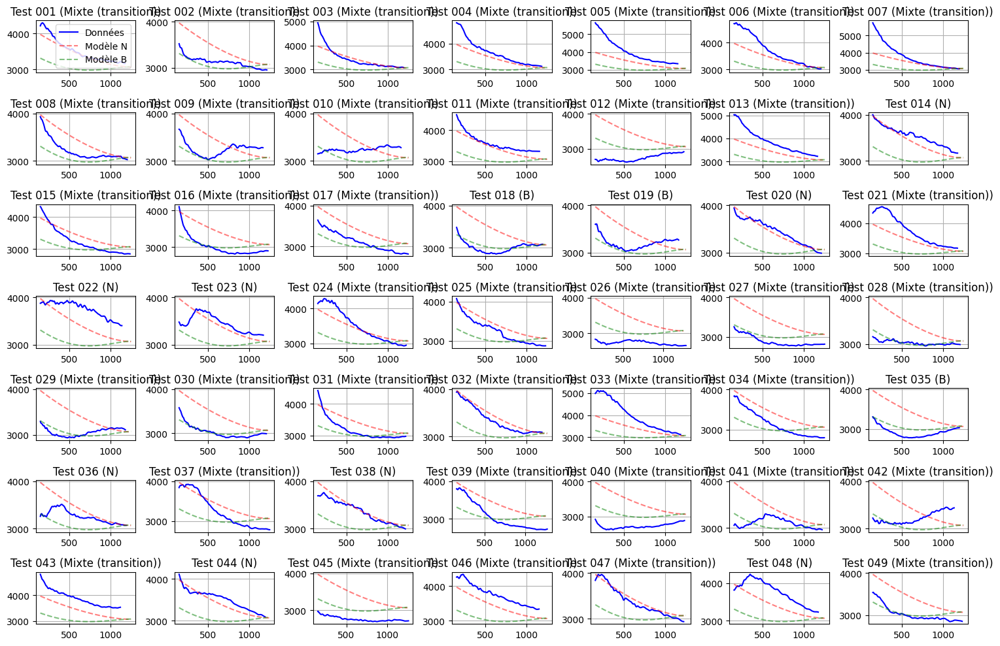

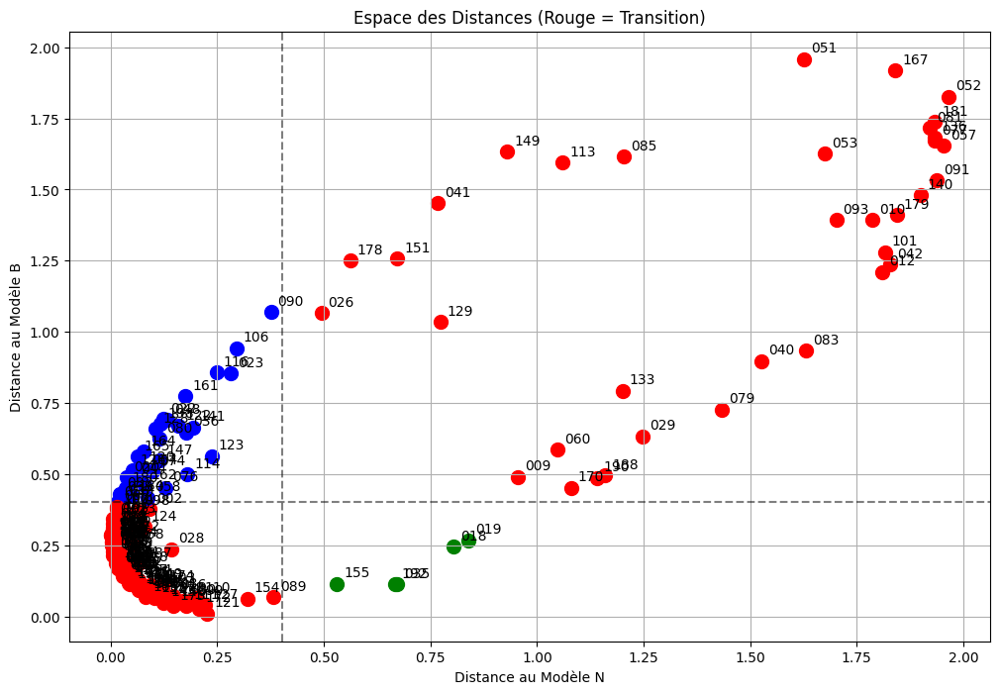

In [68]:
# Choose the first 49 values for visualization

import matplotlib.pyplot as plt

# Visualisation de toutes les courbes avec prédictions
plt.figure(figsize=(15, 10))
for i, test_id in enumerate(list(smoothed_comb_data_dict.keys())[:49], 1):
    plt.subplot(7, 7, i)
    
    df = smoothed_comb_data_dict[test_id]
    positive_mask = df['Déplacement corrigé dérive thermique (nm)'] > 150
    h = df.loc[positive_mask, 'Déplacement corrigé dérive thermique (nm)'].values
    hop = df.loc[positive_mask, 'HOP (MPa)'].values
    
    # Courbe réelle
    plt.plot(h, hop, 'b-', label='Données')
    
    # Prédictions des modèles
    if 'common_h' in locals():
        pred_N = reference_polynomials['N'].predict(common_h.reshape(-1, 1))
        pred_B = reference_polynomials['B'].predict(common_h.reshape(-1, 1))
        
        plt.plot(common_h, pred_N, 'r--', alpha=0.5, label='Modèle N')
        plt.plot(common_h, pred_B, 'g--', alpha=0.5, label='Modèle B')
    
    plt.title(f"Test {test_id} ({classification_results[test_id]})")
    plt.grid(True)
    
    if i == 1:
        plt.legend()

plt.tight_layout()
plt.show()

# Matrice de distance détaillée
plt.figure(figsize=(12, 8))
for test_id, dist in results.items():
    color = 'red' if classification_results[test_id].startswith('Mixte') else \
            'blue' if 'N' in classification_results[test_id] else \
            'green' if 'B' in classification_results[test_id] else 'gray'
    
    plt.scatter(dist['N'], dist['B'], c=color, s=100)
    plt.annotate(test_id, (dist['N'], dist['B']), 
                 xytext=(5, 5), textcoords='offset points')

plt.axhline(threshold, color='k', linestyle='--', alpha=0.5)
plt.axvline(threshold, color='k', linestyle='--', alpha=0.5)
plt.xlabel('Distance au Modèle N')
plt.ylabel('Distance au Modèle B')
plt.title('Espace des Distances (Rouge = Transition)')
plt.grid(True)

In [69]:
import pandas as pd

# Créer le tableau de comparaison
comparison_table = []
for test_id in sorted(computed_data_dict.keys()):
    # Récupérer la classe réelle
    if test_id in class_N_test_ids:
        true_class = "N Pure"
    elif test_id in class_B_test_ids:
        true_class = "B Pure"
    elif test_id in class_NtoB_test_ids:
        true_class = "Transition N→B"
    else:
        true_class = "Transition B→N"
    
    # Récupérer la classe prédite
    pred_class = classification_results.get(test_id, "Non classé")
    
    # Ajouter au tableau
    comparison_table.append({
        'Test ID': test_id,
        'Classe Réelle': true_class,
        'Classe Prédite': pred_class
    })

# Créer un DataFrame et l'afficher
df_comparison = pd.DataFrame(comparison_table)
print("\nTableau Comparatif des Classes Réelles vs Prédites:")
print(df_comparison.to_string(index=False))


Tableau Comparatif des Classes Réelles vs Prédites:
Test ID  Classe Réelle     Classe Prédite
    001 Transition N→B Mixte (transition)
    002 Transition B→N Mixte (transition)
    003 Transition N→B Mixte (transition)
    004 Transition N→B Mixte (transition)
    005 Transition N→B Mixte (transition)
    006         N Pure Mixte (transition)
    007 Transition N→B Mixte (transition)
    008 Transition B→N Mixte (transition)
    009 Transition B→N Mixte (transition)
    010 Transition B→N Mixte (transition)
    011         N Pure Mixte (transition)
    012         B Pure Mixte (transition)
    013 Transition B→N Mixte (transition)
    014         N Pure                  N
    015         N Pure Mixte (transition)
    016         N Pure Mixte (transition)
    017         N Pure Mixte (transition)
    018         B Pure                  B
    019         B Pure                  B
    020         B Pure                  N
    021         N Pure Mixte (transition)
    022         N Pure 

## comparaison des pente locales par regression linéaire sur des fenetres glissantes

Analyse par Pentes Locales
#### Étapes Clés :
1. **Calcul des pentes locales** pour chaque courbe (déjà lissée) sur des intervalles successifs.
2. **Normalisation** des pentes pour se focaliser sur la forme, non les valeurs absolues.
3. **Création de modèles de référence** pour les pentes des phases pures.
4. **Comparaison des séquences de pentes** entre courbes test et références.

In [70]:
def compute_local_slopes(h, hop, window_size=10):
    """
    Calcule les pentes locales par régression linéaire sur des fenêtres glissantes.
    """
    slopes = []
    positions = []
    
    for i in range(len(h) - window_size):
        # Extraire la fenêtre
        h_win = h[i:i+window_size]
        hop_win = hop[i:i+window_size]
        
        # Régression linéaire
        slope = np.polyfit(h_win, hop_win, 1)[0]
        slopes.append(slope)
        positions.append(np.mean(h_win))
    
    return np.array(positions), np.array(slopes)

# Calcul pour toutes les courbes
slope_profiles = {}
for test_id, df in smoothed_comb_data_dict.items():
    positive_mask = df['Déplacement corrigé dérive thermique (nm)'] > 0
    h = df.loc[positive_mask, 'Déplacement corrigé dérive thermique (nm)'].values
    hop = df.loc[positive_mask, 'HOP (MPa)'].values
    
    if len(h) > 10:  # Minimum de points
        positions, slopes = compute_local_slopes(h, hop, window_size=10)
        slope_profiles[test_id] = (positions, slopes)

In [71]:
# Calcul des profils médians pour chaque phase
reference_slopes = {}
reference_positions = {}

for phase in ['N', 'B']:
    all_slope_curves = []
    common_positions = None
    
    for test_id in classes[phase]:
        if test_id in slope_profiles:
            positions, slopes = slope_profiles[test_id]
            
            if common_positions is None:
                common_positions = np.linspace(min(positions), max(positions), 100)
            else:
                # Mise à jour de la grille commune
                min_pos = min(common_positions.min(), positions.min())
                max_pos = max(common_positions.max(), positions.max())
                common_positions = np.linspace(min_pos, max_pos, 100)
            
            # Interpolation sur grille commune
            slopes_interp = np.interp(common_positions, positions, slopes)
            all_slope_curves.append(slopes_interp)
    
    if all_slope_curves:
        median_slopes = np.median(all_slope_curves, axis=0)
        reference_slopes[phase] = median_slopes
        reference_positions[phase] = common_positions

In [72]:
from scipy.spatial.distance import cdist

def compute_slope_similarity(slopes1, slopes2):
    """Calcule la similarité entre deux profils de pente"""
    # Normalisation pour comparer les formes
    slopes1_norm = (slopes1 - np.mean(slopes1)) / np.std(slopes1)
    slopes2_norm = (slopes2 - np.mean(slopes2)) / np.std(slopes2)
    
    # Distance cosinus
    return np.dot(slopes1_norm, slopes2_norm) / (np.linalg.norm(slopes1_norm) * np.linalg.norm(slopes2_norm))

# Calcul des similarités pour toutes les courbes
similarity_results = {}

for test_id in slope_profiles:
    positions, slopes = slope_profiles[test_id]
    
    # Interpolation sur grille commune
    slopes_interp = np.interp(common_positions, positions, slopes)
    
    # Calcul des similarités aux références
    similarities = {}
    for phase in ['N', 'B']:
        if phase in reference_slopes:
            similarity = compute_slope_similarity(slopes_interp, reference_slopes[phase])
            similarities[phase] = similarity
    
    similarity_results[test_id] = similarities

In [73]:
def classify_by_slope(similarities):
    """Classifie basé sur les similarités aux profils de pente"""
    sim_N = similarities.get('N', -1)
    sim_B = similarities.get('B', -1)
    
    # Seuils à déterminer empiriquement
    threshold = 0.7
    
    if sim_N > threshold and sim_B > threshold:
        return "Mixte (transition)"
    elif sim_N > threshold:
        return "N"
    elif sim_B > threshold:
        return "B"
    else:
        return "Indéterminé"

# Classification de tous les tests
slope_classification = {}
for test_id, sims in similarity_results.items():
    slope_classification[test_id] = classify_by_slope(sims)

In [74]:
def compute_curvature_profile(h, hop, window_size=10):
    """Calcule le profil de courbure locale"""
    curvatures = []
    positions = []
    
    for i in range(len(h) - window_size):
        h_win = h[i:i+window_size]
        hop_win = hop[i:i+window_size]
        
        # Ajustement polynomial quadratique
        try:
            p = np.polyfit(h_win, hop_win, 2)
            # Courbure = dérivée seconde (2*a)
            curvature = 2 * p[0]
            curvatures.append(curvature)
            positions.append(np.mean(h_win))
        except:
            continue
    
    return np.array(positions), np.array(curvatures)

# Calcul pour toutes les courbes
curvature_profiles = {}
for test_id, df in smoothed_comb_data_dict.items():
    positive_mask = df['Déplacement corrigé dérive thermique (nm)'] > 0
    h = df.loc[positive_mask, 'Déplacement corrigé dérive thermique (nm)'].values
    hop = df.loc[positive_mask, 'HOP (MPa)'].values
    
    if len(h) > 10:
        positions, curvatures = compute_curvature_profile(h, hop, window_size=100)
        curvature_profiles[test_id] = (positions, curvatures)

/var/folders/px/j_6k9lr95lb7s4kfkc001bm00000gn/T/ipykernel_37974/296063087.py:37: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


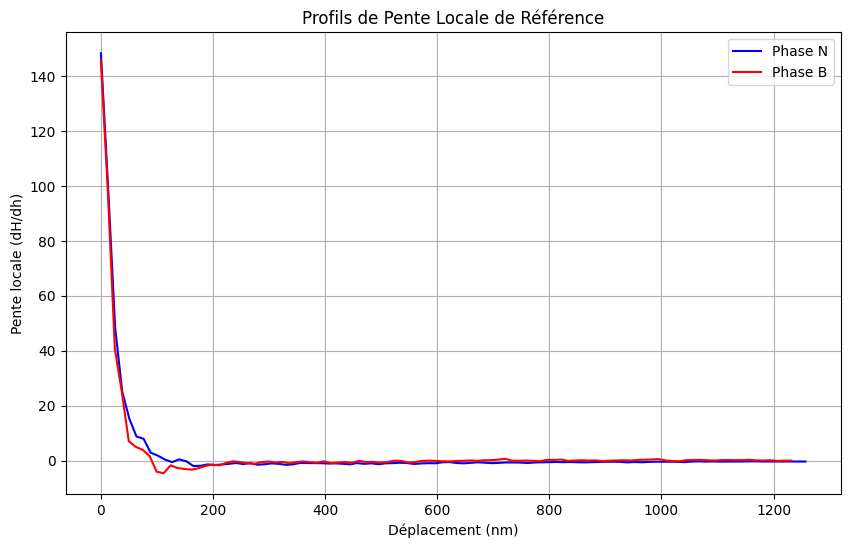

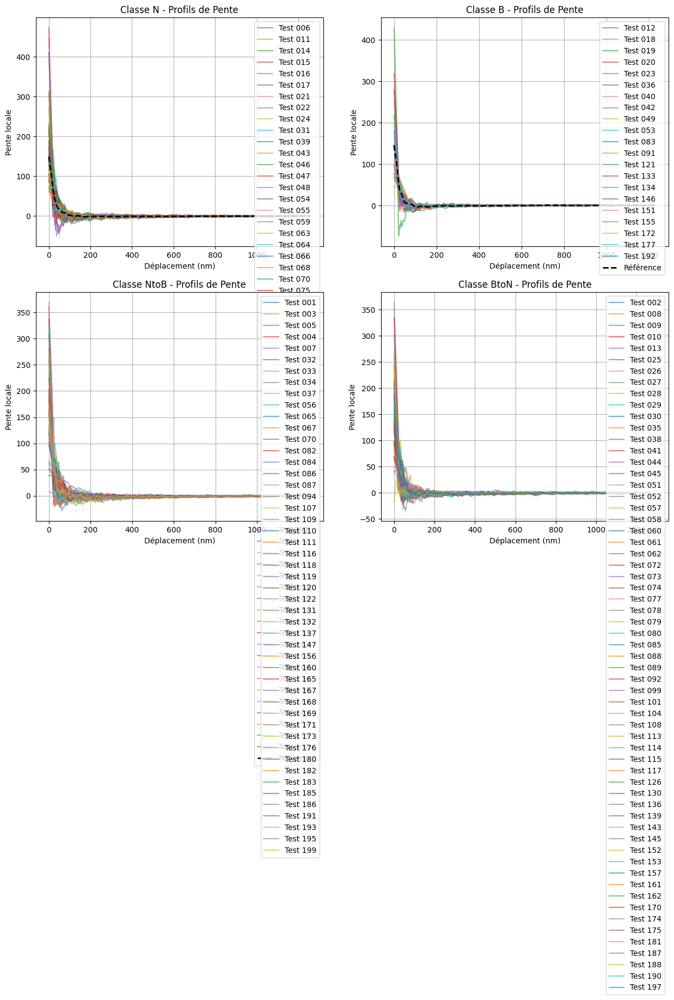

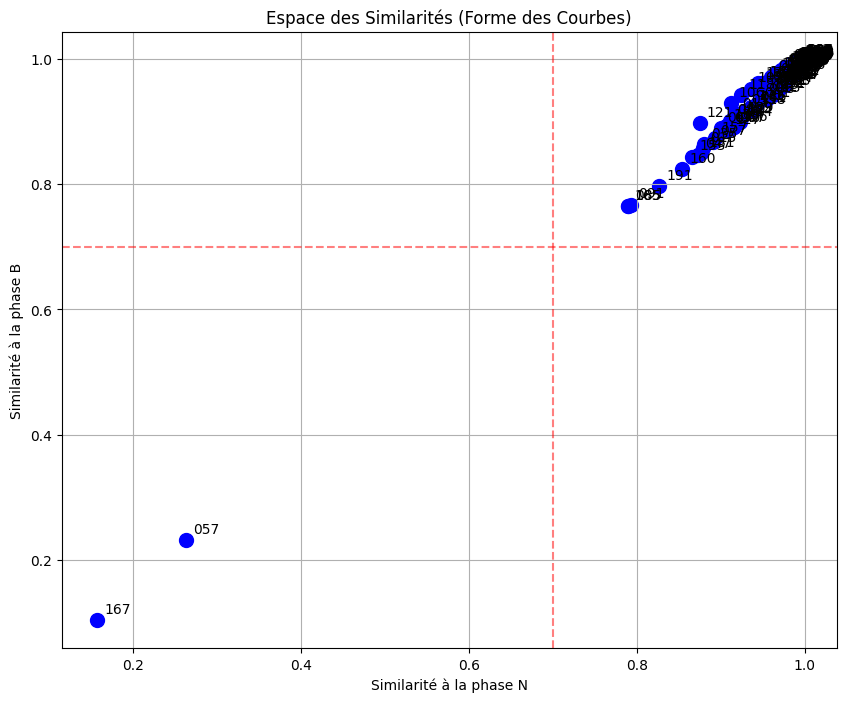

In [75]:
import matplotlib.pyplot as plt

# 1. Visualisation des profils de pente de référence
plt.figure(figsize=(10, 6))
for phase, color in zip(['N', 'B'], ['blue', 'red']):
    if phase in reference_slopes:
        plt.plot(reference_positions[phase], reference_slopes[phase], 
                 color=color, label=f'Phase {phase}')
plt.title('Profils de Pente Locale de Référence')
plt.xlabel('Déplacement (nm)')
plt.ylabel('Pente locale (dH/dh)')
plt.legend()
plt.grid(True)

# 2. Comparaison des profils de pente par classe
fig, axs = plt.subplots(2, 2, figsize=(15, 12))
class_types = ['N', 'B', 'NtoB', 'BtoN']

for i, class_type in enumerate(class_types):
    ax = axs[i//2, i%2]
    for test_id in classes[class_type]:
        if test_id in slope_profiles:
            positions, slopes = slope_profiles[test_id]
            ax.plot(positions, slopes, alpha=0.6, label=f'Test {test_id}')
    
    # Ajouter la référence si disponible
    if class_type in ['N', 'B'] and class_type in reference_slopes:
        ax.plot(reference_positions[class_type], reference_slopes[class_type], 
                'k--', linewidth=2, label='Référence')
    
    ax.set_title(f'Classe {class_type} - Profils de Pente')
    ax.set_xlabel('Déplacement (nm)')
    ax.set_ylabel('Pente locale')
    ax.grid(True)
    ax.legend()

plt.tight_layout()

# 3. Carte des similarités
plt.figure(figsize=(10, 8))
test_ids = sorted(slope_profiles.keys())
sim_N = [similarity_results[test_id].get('N', 0) for test_id in test_ids]
sim_B = [similarity_results[test_id].get('B', 0) for test_id in test_ids]

plt.scatter(sim_N, sim_B, c='blue', s=100)
for i, test_id in enumerate(test_ids):
    plt.annotate(test_id, (sim_N[i], sim_B[i]), 
                 xytext=(5, 5), textcoords='offset points')

plt.axhline(0.7, color='r', linestyle='--', alpha=0.5)
plt.axvline(0.7, color='r', linestyle='--', alpha=0.5)
plt.xlabel('Similarité à la phase N')
plt.ylabel('Similarité à la phase B')
plt.title('Espace des Similarités (Forme des Courbes)')
plt.grid(True)

In [76]:
# Calculer les prédictions de classe explicites
def classify_curve(similarities, threshold=0.7):
    sim_N = similarities.get('N', -1)
    sim_B = similarities.get('B', -1)
    
    if sim_N > threshold and sim_B > threshold:
        return "Mixte (N+B)"
    elif sim_N > threshold:
        return "N Pure"
    elif sim_B > threshold:
        return "B Pure"
    else:
        return "Indéterminé"

# Classification de tous les tests
classification_results = {}
for test_id, sims in similarity_results.items():
    classification_results[test_id] = classify_curve(sims)

# Afficher les résultats de classification
print("\n=== Résultats de Classification Basée sur la Forme des Courbes ===")
print("(Basée sur la similarité des profils de pente locale)")
print("\nLégende:")
print("- 'N Pure': Courbe très similaire au profil de pente de la phase N")
print("- 'B Pure': Courbe très similaire au profil de pente de la phase B")
print("- 'Mixte (N+B)': Courbe présentant des caractéristiques des deux phases")
print("- 'Indéterminé': Courbe ne correspondant clairement à aucun profil")

# Organiser par classe prédite
results_by_class = {"N Pure": [], "B Pure": [], "Mixte (N+B)": [], "Indéterminé": []}
for test_id, pred in classification_results.items():
    results_by_class[pred].append(test_id)

# Afficher les résultats
for class_name, test_ids in results_by_class.items():
    print(f"\n{len(test_ids)} tests classés comme {class_name}:")
    if test_ids:
        print(", ".join(sorted(test_ids)))


=== Résultats de Classification Basée sur la Forme des Courbes ===
(Basée sur la similarité des profils de pente locale)

Légende:
- 'N Pure': Courbe très similaire au profil de pente de la phase N
- 'B Pure': Courbe très similaire au profil de pente de la phase B
- 'Mixte (N+B)': Courbe présentant des caractéristiques des deux phases
- 'Indéterminé': Courbe ne correspondant clairement à aucun profil

0 tests classés comme N Pure:

0 tests classés comme B Pure:

193 tests classés comme Mixte (N+B):
001, 002, 003, 004, 005, 006, 007, 008, 009, 010, 011, 012, 013, 014, 015, 016, 017, 018, 019, 020, 021, 022, 023, 024, 025, 026, 027, 028, 029, 030, 031, 032, 033, 034, 035, 036, 037, 038, 039, 040, 041, 042, 043, 044, 045, 046, 047, 048, 049, 051, 052, 053, 054, 055, 056, 058, 059, 060, 061, 062, 063, 064, 065, 066, 067, 068, 070, 071, 072, 073, 074, 075, 076, 077, 078, 079, 080, 081, 082, 083, 084, 085, 086, 087, 088, 089, 090, 091, 092, 093, 094, 095, 096, 097, 098, 099, 101, 102, 103, 

In [77]:
# Vos classes originales
true_classes = {
    "N Pure": class_N_test_ids,
    "B Pure": class_B_test_ids,
    "NtoB": class_NtoB_test_ids,
    "BtoN": class_BtoN_test_ids
}

# Fonction pour mapper vos classes aux nôtres
def map_to_broad_class(test_id):
    if test_id in class_N_test_ids:
        return "N Pure"
    elif test_id in class_B_test_ids:
        return "B Pure"
    elif test_id in class_NtoB_test_ids or test_id in class_BtoN_test_ids:
        return "Mixte (N+B)"
    else:
        return "Indéterminé"

# Comparaison détaillée
print("\n=== Comparaison avec les Vraies Classes ===")
print("Test ID | Vraie Classe | Classe Prédite | Similarité N | Similarité B")
print("---------------------------------------------------------------------")

for test_id in sorted(similarity_results.keys()):
    true_class = map_to_broad_class(test_id)
    pred_class = classification_results[test_id]
    sim_N = similarity_results[test_id].get('N', 0)
    sim_B = similarity_results[test_id].get('B', 0)
    
    match = "✓" if true_class == pred_class else "✗"
    
    print(f"{test_id:6} | {true_class:10} | {pred_class:12} | {sim_N:.3f}     | {sim_B:.3f}     | {match}")

# Calcul de précision
correct = 0
total = len(classification_results)
for test_id, pred_class in classification_results.items():
    true_class = map_to_broad_class(test_id)
    if true_class == pred_class:
        correct += 1

accuracy = correct / total
print(f"\nPrécision: {accuracy:.2f} ({correct}/{total} tests correctement classés)")


=== Comparaison avec les Vraies Classes ===
Test ID | Vraie Classe | Classe Prédite | Similarité N | Similarité B
---------------------------------------------------------------------
001    | Mixte (N+B) | Mixte (N+B)  | 0.975     | 0.958     | ✓
002    | Mixte (N+B) | Mixte (N+B)  | 0.988     | 0.985     | ✓
003    | Mixte (N+B) | Mixte (N+B)  | 0.972     | 0.982     | ✓
004    | Mixte (N+B) | Mixte (N+B)  | 0.986     | 0.990     | ✓
005    | Mixte (N+B) | Mixte (N+B)  | 0.962     | 0.966     | ✓
006    | N Pure     | Mixte (N+B)  | 0.969     | 0.977     | ✗
007    | Mixte (N+B) | Mixte (N+B)  | 0.979     | 0.985     | ✓
008    | Mixte (N+B) | Mixte (N+B)  | 0.970     | 0.977     | ✓
009    | Mixte (N+B) | Mixte (N+B)  | 0.978     | 0.989     | ✓
010    | Mixte (N+B) | Mixte (N+B)  | 0.989     | 0.988     | ✓
011    | N Pure     | Mixte (N+B)  | 0.978     | 0.964     | ✗
012    | B Pure     | Mixte (N+B)  | 0.960     | 0.945     | ✗
013    | Mixte (N+B) | Mixte (N+B)  | 0.955     | 

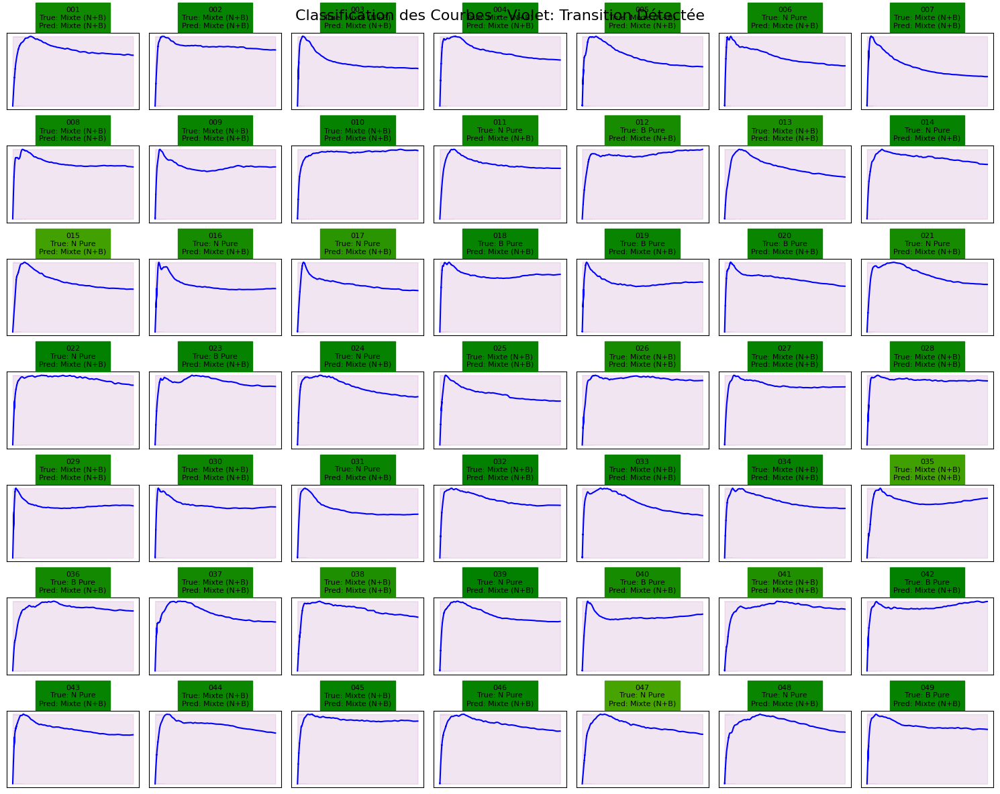

In [79]:
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# Créer une colormap pour les similarités
cmap = LinearSegmentedColormap.from_list("similarity", ["red", "yellow", "green"])

# Visualisation des courbes avec code couleur
plt.figure(figsize=(15, 12))

# Déterminer l'ordre des sous-graphiques (7x7)
test_ids_sorted = sorted(list(smoothed_comb_data_dict.keys())[0:49])  # Limiter à 49 pour une grille 7x7
for i, test_id in enumerate(test_ids_sorted, 1):
    ax = plt.subplot(7, 7, i)
    
    # Données de la courbe
    df = smoothed_comb_data_dict[test_id]
    positive_mask = df['Déplacement corrigé dérive thermique (nm)'] > 0
    h = df.loc[positive_mask, 'Déplacement corrigé dérive thermique (nm)'].values
    hop = df.loc[positive_mask, 'HOP (MPa)'].values
    
    # Tracer la courbe principale
    plt.plot(h, hop, 'b-')
    
    # Ajouter les informations de classification
    pred_class = classification_results[test_id]
    true_class = map_to_broad_class(test_id)
    
    # Calculer la couleur de fond basée sur la similarité moyenne
    sim_avg = (similarity_results[test_id].get('N', 0) + similarity_results[test_id].get('B', 0)) / 2
    bg_color = cmap(sim_avg)
    
    # Mettre en évidence les transitions
    if "Mixte" in pred_class:
        plt.fill_between(h, hop.min(), hop.max(), color='purple', alpha=0.1)
    
    # Titre avec résultats
    title = f"{test_id}\nTrue: {true_class}\nPred: {pred_class}"
    plt.title(title, fontsize=8, backgroundcolor=bg_color)
    plt.grid(True, alpha=0.3)
    
    # Cacher les axes pour plus de clarté
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()
plt.suptitle("Classification des Courbes - Violet: Transition Détectée", fontsize=16)
plt.subplots_adjust(top=0.95)
plt.show()


=== Analyse des Classes Mixtes (Transitions) ===
Test ID | Sim N | Sim B | Prédiction | Vraie Classe | Détails
001    | 0.975 | 0.958 | Mixte (N+B) | Mixte (N+B) | Fortes similarités aux deux phases (bonne détection de transition)
002    | 0.988 | 0.985 | Mixte (N+B) | Mixte (N+B) | Fortes similarités aux deux phases (bonne détection de transition)
003    | 0.972 | 0.982 | Mixte (N+B) | Mixte (N+B) | Fortes similarités aux deux phases (bonne détection de transition)
004    | 0.986 | 0.990 | Mixte (N+B) | Mixte (N+B) | Fortes similarités aux deux phases (bonne détection de transition)
005    | 0.962 | 0.966 | Mixte (N+B) | Mixte (N+B) | Fortes similarités aux deux phases (bonne détection de transition)
006    | 0.969 | 0.977 | Mixte (N+B) | N Pure     | Fortes similarités aux deux phases (bonne détection de transition)
007    | 0.979 | 0.985 | Mixte (N+B) | Mixte (N+B) | Fortes similarités aux deux phases (bonne détection de transition)
008    | 0.970 | 0.977 | Mixte (N+B) | Mixte (N+B

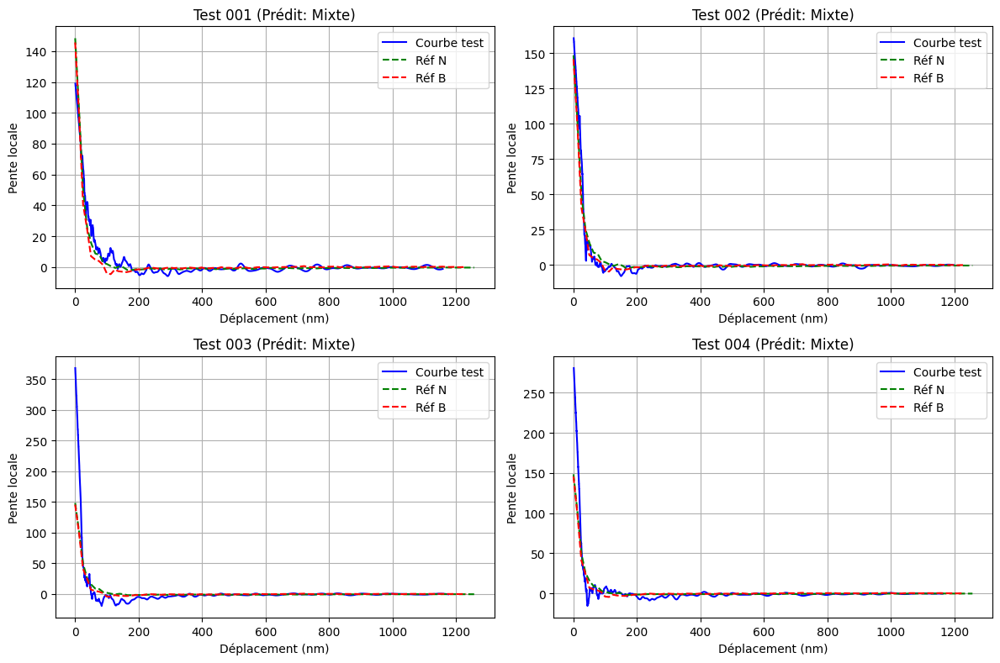

In [80]:
# Analyse spécifique des classes mixtes
print("\n=== Analyse des Classes Mixtes (Transitions) ===")
print("Test ID | Sim N | Sim B | Prédiction | Vraie Classe | Détails")

mixed_ids = [tid for tid in classification_results if "Mixte" in classification_results[tid]]
for test_id in mixed_ids:
    sim_N = similarity_results[test_id].get('N', 0)
    sim_B = similarity_results[test_id].get('B', 0)
    pred_class = classification_results[test_id]
    true_class = map_to_broad_class(test_id)
    
    # Détails supplémentaires
    details = ""
    if sim_N > 0.7 and sim_B > 0.7:
        details = "Fortes similarités aux deux phases (bonne détection de transition)"
    elif sim_N > 0.7 and sim_B < 0.5:
        details = "Similaire seulement à N - possible erreur"
    elif sim_B > 0.7 and sim_N < 0.5:
        details = "Similaire seulement à B - possible erreur"
    else:
        details = "Similarités modérées aux deux phases"
    
    print(f"{test_id:6} | {sim_N:.3f} | {sim_B:.3f} | {pred_class:10} | {true_class:10} | {details}")

# Visualisation comparative des profils de pente
plt.figure(figsize=(12, 8))

for i, test_id in enumerate(mixed_ids[:4], 1):
    plt.subplot(2, 2, i)
    
    # Profil de pente de la courbe
    positions, slopes = slope_profiles[test_id]
    plt.plot(positions, slopes, 'b-', label='Courbe test')
    
    # Profils de référence
    plt.plot(reference_positions['N'], reference_slopes['N'], 'g--', label='Réf N')
    plt.plot(reference_positions['B'], reference_slopes['B'], 'r--', label='Réf B')
    
    plt.title(f"Test {test_id} (Prédit: Mixte)")
    plt.xlabel('Déplacement (nm)')
    plt.ylabel('Pente locale')
    plt.grid(True)
    plt.legend()

plt.tight_layout()
plt.show()

## Classification


Validation avec Random Forest

Fold 1
Accuracy: 0.1795

Détails pour le premier fold:
              precision    recall  f1-score   support

           B       0.00      0.00      0.00         8
        BtoN       0.25      0.17      0.20        18
           N       0.29      0.32      0.31        28
        NtoB       0.15      0.08      0.11        24

    accuracy                           0.18        78
   macro avg       0.17      0.14      0.15        78
weighted avg       0.21      0.18      0.19        78


Fold 2
Accuracy: 0.1667

Fold 3
Accuracy: 0.3077

Fold 4
Accuracy: 0.2692

Fold 5
Accuracy: 0.3077

Accuracy moyenne: 0.2462 ± 0.0614

Modèle Final - Random Forest
Classification Report:
              precision    recall  f1-score   support

           B       0.98      1.00      0.99        42
        BtoN       0.99      0.96      0.97       122
           N       0.94      0.98      0.96       128
        NtoB       0.99      0.96      0.97        98

    accuracy      

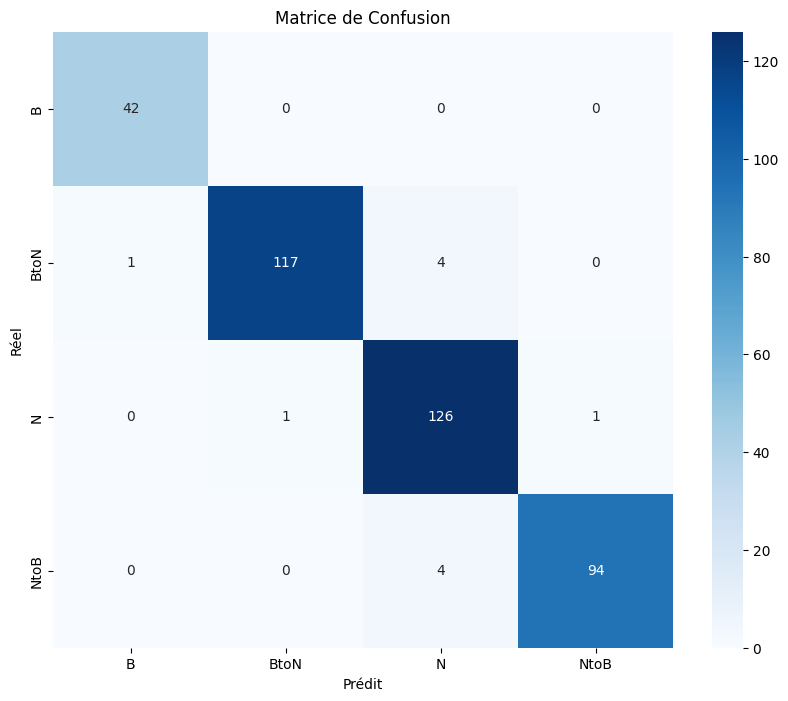


Validation avec SVM

Fold 1
Accuracy: 0.1538

Détails pour le premier fold:
              precision    recall  f1-score   support

           B       0.10      0.50      0.17         8
        BtoN       0.00      0.00      0.00        18
           N       0.25      0.29      0.27        28
        NtoB       0.00      0.00      0.00        24

    accuracy                           0.15        78
   macro avg       0.09      0.20      0.11        78
weighted avg       0.10      0.15      0.11        78


Fold 2
Accuracy: 0.1410

Fold 3
Accuracy: 0.2436

Fold 4
Accuracy: 0.2308

Fold 5
Accuracy: 0.1667

Accuracy moyenne: 0.1872 ± 0.0418

Modèle Final - SVM
Classification Report:
              precision    recall  f1-score   support

           B       0.13      0.64      0.21        42
        BtoN       0.45      0.15      0.22       122
           N       0.28      0.14      0.19       128
        NtoB       0.32      0.24      0.28        98

    accuracy                          

/Users/lfu/opt/miniconda3/envs/gym/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lfu/opt/miniconda3/envs/gym/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/lfu/opt/miniconda3/envs/gym/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitaliz

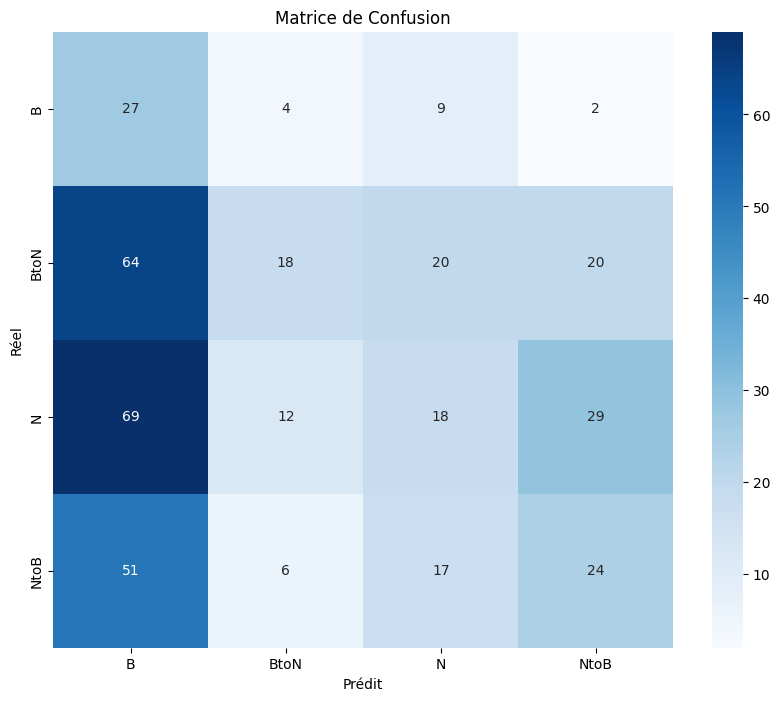


Importance des Caractéristiques (Random Forest)


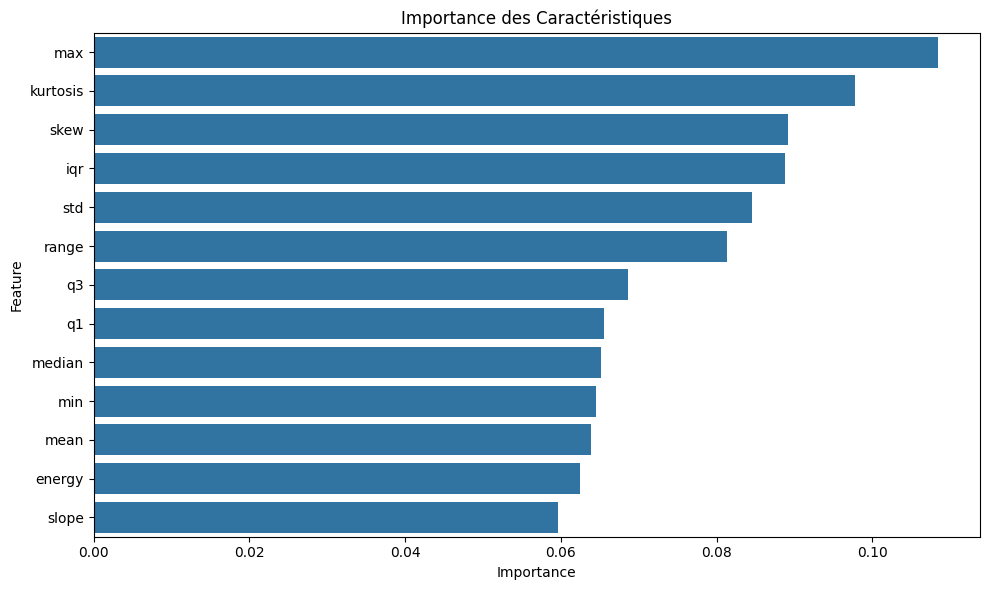

In [81]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, GroupKFold
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.pipeline import make_pipeline
from scipy import stats
import seaborn as sns

# Configuration des paramètres
WINDOW_SIZE = 100  # Taille de la fenêtre en nm
STEP_SIZE = 100      # Pas de déplacement de la fenêtre
MAX_DISPLACEMENT = 600  # Plage maximale à considérer

# 1. Fonction d'extraction de caractéristiques pour une fenêtre
def extract_window_features(window):
    """Extrait les caractéristiques statistiques d'une fenêtre de données"""
    features = {
        'mean': np.mean(window),
        'std': np.std(window),
        'skew': stats.skew(window),
        'kurtosis': stats.kurtosis(window),
        'min': np.min(window),
        'max': np.max(window),
        'range': np.ptp(window),
        'q1': np.quantile(window, 0.25),
        'median': np.median(window),
        'q3': np.quantile(window, 0.75),
        'iqr': np.quantile(window, 0.75) - np.quantile(window, 0.25),
        'slope': np.polyfit(np.arange(len(window)), window, 1)[0],
        'energy': np.sum(window**2) / len(window)
    }
    return features

# 2. Découpage en fenêtres glissantes pour un test
def process_test_data(df, test_id, label):
    """Traite les données d'un test en fenêtres glissantes"""
    # Filtrer les données entre 0 et 1000 nm
    df_filtered = df[(df.iloc[:, 0] >= 200) & (df.iloc[:, 0] <= MAX_DISPLACEMENT)]
    
    if len(df_filtered) == 0:
        return pd.DataFrame(), []
    
    displacement = df_filtered.iloc[:, 0].values
    hop = df_filtered.iloc[:, 1].values
    
    # Créer des fenêtres glissantes
    windows = []
    window_info = []
    start_idx = 0
    
    while start_idx < len(displacement):
        end_idx = np.searchsorted(displacement, displacement[start_idx] + WINDOW_SIZE, side='right')
        
        if end_idx <= start_idx:
            break
            
        window_data = hop[start_idx:end_idx]
        
        if len(window_data) >= 10:  # Minimum de points pour une fenêtre
            features = extract_window_features(window_data)
            features['test_id'] = test_id
            features['label'] = label
            features['window_start'] = displacement[start_idx]
            features['window_end'] = displacement[end_idx-1]
            windows.append(features)
            window_info.append({
                'test_id': test_id,
                'start': displacement[start_idx],
                'end': displacement[end_idx-1],
                'label': label
            })
        
        # Trouver l'index suivant (basé sur le déplacement, pas les index)
        next_start = displacement[start_idx] + STEP_SIZE
        start_idx = np.searchsorted(displacement, next_start, side='left')
    
    return pd.DataFrame(windows), window_info

# 3. Traitement de toutes les données
def process_all_data(comp_data_dict, class_dict):
    """Traite toutes les données et construit le DataFrame final"""
    all_windows = []
    all_window_info = []
    
    for class_name, test_ids in class_dict.items():
        for test_id in test_ids:
            if test_id in comp_data_dict:
                df = comp_data_dict[test_id]
                windows_df, info = process_test_data(df, test_id, class_name)
                if not windows_df.empty:
                    all_windows.append(windows_df)
                    all_window_info.extend(info)
    
    return pd.concat(all_windows, ignore_index=True), all_window_info

# 4. Préparation des données
class_dict = {
    'N': class_N_test_ids,
    'B': class_B_test_ids,
    'NtoB': class_NtoB_test_ids,
    'BtoN': class_BtoN_test_ids
}

# Traiter toutes les données
features_df, window_info = process_all_data(smoothed_comb_data_dict, class_dict)

# Vérifier si nous avons des données
if features_df.empty:
    raise ValueError("Aucune fenêtre valide n'a été créée. Vérifiez vos données et paramètres.")

# Préparer les données pour l'apprentissage
X = features_df.drop(['test_id', 'label', 'window_start', 'window_end'], axis=1)
y = features_df['label']
groups = features_df['test_id']  # Pour la validation croisée groupée

# Encodage des étiquettes
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# 5. Fonction d'évaluation
def evaluate_model(model, X_test, y_test):
    """Évalue le modèle et affiche les métriques"""
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test) if hasattr(model, 'predict_proba') else None
    
    # Rapport de classification
    print("Classification Report:")
    print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))
    
    # Matrice de confusion
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=label_encoder.classes_, 
                yticklabels=label_encoder.classes_)
    plt.xlabel('Prédit')
    plt.ylabel('Réel')
    plt.title('Matrice de Confusion')
    plt.show()
    
    # Retourner les prédictions pour une analyse plus approfondie
    return y_pred, y_proba

# 6. Validation croisée groupée avec Random Forest
print("\n" + "="*50)
print("Validation avec Random Forest")
print("="*50)

rf_model = make_pipeline(
    StandardScaler(),
    RandomForestClassifier(n_estimators=200, 
                          max_depth=10, 
                          class_weight='balanced',
                          random_state=42)
)

# Validation croisée groupée (par test_id)
group_kfold = GroupKFold(n_splits=5)
accuracies = []

for fold_idx, (train_idx, test_idx) in enumerate(group_kfold.split(X, y_encoded, groups)):
    print(f"\nFold {fold_idx+1}")
    
    # Séparation des données
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y_encoded[train_idx], y_encoded[test_idx]
    
    # Entraînement
    rf_model.fit(X_train, y_train)
    
    # Évaluation
    y_pred = rf_model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    accuracies.append(acc)
    print(f"Accuracy: {acc:.4f}")
    
    # Rapport détaillé pour le premier fold
    if fold_idx == 0:
        print("\nDétails pour le premier fold:")
        print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))

print(f"\nAccuracy moyenne: {np.mean(accuracies):.4f} ± {np.std(accuracies):.4f}")

# Entraînement final et évaluation sur toutes les données
print("\n" + "="*50)
print("Modèle Final - Random Forest")
print("="*50)
rf_model.fit(X, y_encoded)
y_pred_rf, y_proba_rf = evaluate_model(rf_model, X, y_encoded)

# 7. Validation croisée avec SVM
print("\n" + "="*50)
print("Validation avec SVM")
print("="*50)

svm_model = make_pipeline(
    StandardScaler(),
    SVC(kernel='rbf', C=10, gamma='scale', 
        class_weight='balanced', probability=True, random_state=42)
)

# Réinitialisation des précisions
accuracies = []

for fold_idx, (train_idx, test_idx) in enumerate(group_kfold.split(X, y_encoded, groups)):
    print(f"\nFold {fold_idx+1}")
    
    # Séparation des données
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y_encoded[train_idx], y_encoded[test_idx]
    
    # Entraînement
    svm_model.fit(X_train, y_train)
    
    # Évaluation
    y_pred = svm_model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    accuracies.append(acc)
    print(f"Accuracy: {acc:.4f}")
    
    # Rapport détaillé pour le premier fold
    if fold_idx == 0:
        print("\nDétails pour le premier fold:")
        print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))

print(f"\nAccuracy moyenne: {np.mean(accuracies):.4f} ± {np.std(accuracies):.4f}")

# Entraînement final et évaluation sur toutes les données
print("\n" + "="*50)
print("Modèle Final - SVM")
print("="*50)
svm_model.fit(X, y_encoded)
y_pred_svm, y_proba_svm = evaluate_model(svm_model, X, y_encoded)

# 8. Analyse des caractéristiques importantes (Random Forest)
print("\n" + "="*50)
print("Importance des Caractéristiques (Random Forest)")
print("="*50)

rf = rf_model.named_steps['randomforestclassifier']
feature_importances = pd.DataFrame({
    'Feature': X.columns,
    'Importance': rf.feature_importances_
}).sort_values('Importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importances)
plt.title('Importance des Caractéristiques')
plt.tight_layout()
plt.show()



In [83]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import signal
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras import layers, models, utils, callbacks
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import seaborn as sns

# Configuration
NFFT = 256  # Taille de la fenêtre pour la STFT
NOVERLAP = 64  # Chevauchement des fenêtres
NPERS = 128  # Nombre de points par segment
TARGET_SHAPE = (128, 128, 1)  # Taille cible des images
RESAMPLE_LENGTH = 1024  # Longueur fixe pour le rééchantillonnage

# 1. Prétraitement des courbes
def preprocess_curve(displacement, hop):
    """Prétraite une courbe : filtre, rééchantillonne, normalise"""
    # Filtrer les valeurs de déplacement positives
    pos_mask = displacement > 0
    displacement = displacement[pos_mask]
    hop = hop[pos_mask]
    
    if len(displacement) == 0:
        return None
    
    # Normaliser le déplacement entre 0 et 1
    norm_disp = (displacement - displacement.min()) / (displacement.max() - displacement.min())
    
    # Rééchantillonner à longueur fixe
    target_disp = np.linspace(0, 1, RESAMPLE_LENGTH)
    resampled_hop = np.interp(target_disp, norm_disp, hop)
    
    # Normaliser le signal
    return (resampled_hop - np.mean(resampled_hop)) / np.std(resampled_hop)

# 2. Génération du spectrogramme
def generate_spectrogram(signal_data, nperseg=NPERS, noverlap=NOVERLAP, nfft=NFFT, img_size=TARGET_SHAPE[:2]):
    """Génère un spectrogramme à partir d'un signal 1D"""
    # Calcul du STFT
    f, t, Zxx = signal.stft(signal_data, nperseg=nperseg, noverlap=noverlap, nfft=nfft)
    
    # Conversion en amplitude et échelle dB
    magnitude = np.abs(Zxx)
    db_scale = 20 * np.log10(magnitude + 1e-10)  # Éviter log(0)
    
    # Normalisation
    db_min = db_scale.min()
    db_max = db_scale.max()
    if db_max - db_min > 1e-5:
        norm_spec = (db_scale - db_min) / (db_max - db_min)
    else:
        norm_spec = np.zeros_like(db_scale)
    
    # Redimensionnement
    img = np.zeros(img_size)
    h, w = min(img_size[0], norm_spec.shape[0]), min(img_size[1], norm_spec.shape[1])
    img[:h, :w] = norm_spec[:h, :w]
    
    return img[..., np.newaxis]  # Ajouter une dimension de canal

# 3. Visualisation d'exemples
def plot_spectrogram_examples(comp_data_dict, class_dict):
    """Affiche des exemples de spectrogrammes pour chaque classe"""
    fig, axs = plt.subplots(2, 2, figsize=(12, 10))
    classes = list(class_dict.keys())
    
    for i, class_name in enumerate(classes):
        test_id = class_dict[class_name][0]  # Premier échantillon de la classe
        df = comp_data_dict[test_id]
        displacement = df.iloc[:, 0].values
        hop = df.iloc[:, 1].values
        
        # Prétraitement
        signal_data = preprocess_curve(displacement, hop)
        if signal_data is None:
            continue
            
        # Générer le spectrogramme
        spectrogram = generate_spectrogram(signal_data)[..., 0]
        
        # Tracer
        ax = axs[i//2, i%2]
        im = ax.imshow(spectrogram, aspect='auto', origin='lower', 
                      extent=[0, 100, 0, 0.5], cmap='viridis')
        ax.set_title(f'Classe: {class_name}\nTest ID: {test_id}')
        ax.set_xlabel('Position relative (%)')
        ax.set_ylabel('Fréquence normalisée')
        fig.colorbar(im, ax=ax)
    
    plt.tight_layout()
    plt.savefig('spectrogram_examples.png', dpi=300)
    plt.show()

# 4. Préparation du dataset
def create_spectrogram_dataset(comp_data_dict, class_dict):
    """Crée le dataset de spectrogrammes et étiquettes"""
    X, y = [], []
    class_mapping = {'N': 0, 'B': 1, 'NtoB': 2, 'BtoN': 3}
    
    for class_name, test_ids in class_dict.items():
        for test_id in test_ids:
            if test_id in comp_data_dict:
                df = comp_data_dict[test_id]
                displacement = df.iloc[:, 0].values
                hop = df.iloc[:, 1].values
                
                # Prétraitement
                signal_data = preprocess_curve(displacement, hop)
                if signal_data is None:
                    continue
                
                # Générer le spectrogramme
                spec = generate_spectrogram(signal_data)
                X.append(spec)
                y.append(class_mapping[class_name])
    
    return np.array(X), np.array(y)

# 5. Architecture CNN
def create_cnn_model(input_shape, num_classes):
    """Crée un modèle CNN pour la classification d'images"""
    model = models.Sequential([
        layers.Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        
        layers.Conv2D(64, (3, 3), activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        
        layers.Conv2D(128, (3, 3), activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        
        layers.Flatten(),
        layers.Dense(256, activation='relu'),
        layers.Dropout(0.5),
        layers.Dense(num_classes, activation='softmax')
    ])
    
    model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    
    return model

# 6. Validation croisée
def run_cross_validation(X, y, n_splits=5, epochs=100, batch_size=8):
    """Exécute une validation croisée stratifiée"""
    kfold = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
    fold_accuracies = []
    histories = []
    
    for fold, (train_idx, val_idx) in enumerate(kfold.split(X, y)):
        print(f"\nEntraînement du fold {fold+1}/{n_splits}")
        
        # Séparation des données
        X_train, X_val = X[train_idx], X[val_idx]
        y_train, y_val = y[train_idx], y[val_idx]
        
        # Augmentation des données
        datagen = ImageDataGenerator(
            rotation_range=5,
            width_shift_range=0.1,
            height_shift_range=0.1,
            zoom_range=0.1,
            horizontal_flip=True,
            fill_mode='constant'
        )
        
        # Création du modèle
        model = create_cnn_model(X.shape[1:], len(np.unique(y)))
        
        # Callbacks
        early_stop = callbacks.EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)
        reduce_lr = callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5)
        
        # Entraînement
        history = model.fit(
            datagen.flow(X_train, y_train, batch_size=batch_size),
            epochs=epochs,
            validation_data=(X_val, y_val),
            callbacks=[early_stop, reduce_lr],
            verbose=1
        )
        
        # Évaluation
        val_loss, val_acc = model.evaluate(X_val, y_val, verbose=0)
        fold_accuracies.append(val_acc)
        histories.append(history)
        
        print(f"Fold {fold+1} - Validation accuracy: {val_acc:.4f}")
        
        # Rapport de classification pour ce fold
        y_pred = np.argmax(model.predict(X_val), axis=1)
        print(f"\nRapport de classification pour le fold {fold+1}:")
        print(classification_report(y_val, y_pred))
    
    # Performance globale
    print("\nPerformance globale:")
    print(f"Accuracy moyenne: {np.mean(fold_accuracies):.4f} ± {np.std(fold_accuracies):.4f}")
    
    return model, histories

# 7. Fonction principale
def main():
    # Définir les classes
    class_dict = {
        'N': class_N_test_ids,
        'B': class_B_test_ids,
        'NtoB': class_NtoB_test_ids,
        'BtoN': class_BtoN_test_ids
    }
    
    # 1. Visualisation d'exemples
    print("Visualisation d'exemples de spectrogrammes...")
    plot_spectrogram_examples(smoothed_comb_data_dict, class_dict)
    
    # 2. Création du dataset
    print("\nCréation du dataset de spectrogrammes...")
    X, y = create_spectrogram_dataset(smoothed_comb_data_dict, class_dict)
    print(f"Dataset créé: {X.shape[0]} échantillons, forme des images: {X.shape[1:]}")
    
    # 3. Validation croisée
    print("\nDébut de la validation croisée...")
    model, histories = run_cross_validation(X, y, n_splits=5, epochs=100)
    
    # 4. Entraînement final sur toutes les données
    print("\nEntraînement final sur toutes les données...")
    model = create_cnn_model(X.shape[1:], len(np.unique(y)))
    model.fit(X, y, epochs=100, batch_size=8, verbose=1)
    
    # 5. Évaluation finale
    y_pred = np.argmax(model.predict(X), axis=1)
    class_names = ['N', 'B', 'NtoB', 'BtoN']
    
    print("\nRapport de classification final:")
    print(classification_report(y, y_pred, target_names=class_names))
    
    # Matrice de confusion
    cm = confusion_matrix(y, y_pred)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=class_names, 
                yticklabels=class_names)
    plt.xlabel('Prédictions')
    plt.ylabel('Vraies classes')
    plt.title('Matrice de Confusion - Modèle Final')
    plt.savefig('final_confusion_matrix.png', dpi=300)
    plt.show()
    
    # 6. Sauvegarde du modèle
    model.save('phase_transition_spectrogram_cnn.h5')
    print("Modèle sauvegardé sous 'phase_transition_spectrogram_cnn.h5'")

# Exécuter le pipeline
if __name__ == "__main__":
    main()

: 

Almost all energy is concentrated on the far left side (very small relative position %).

Frequencies are mostly active at the lowest band (near 0 on the y-axis).

In [1]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from scipy import stats

# Parameters
WINDOW_SIZE = 100
MIN_DISP = 50
MAX_DISP = 800
STEP = WINDOW_SIZE

# Extract features from a segment
def extract_features(window):
    return {
        'mean': np.mean(window),
        'std': np.std(window),
        'skew': stats.skew(window),
        'kurtosis': stats.kurtosis(window),
        'min': np.min(window),
        'max': np.max(window),
        'range': np.ptp(window),
        'q1': np.quantile(window, 0.25),
        'median': np.median(window),
        'q3': np.quantile(window, 0.75),
        'iqr': np.quantile(window, 0.75) - np.quantile(window, 0.25),
        'slope': np.polyfit(np.arange(len(window)), window, 1)[0],
        'energy': np.sum(window**2) / len(window)
    }

# Segment all data and extract features
def segment_data(data_dict, class_dict):
    features = []
    labels = []

    for label, test_ids in class_dict.items():
        for test_id in test_ids:
            if test_id not in data_dict:
                continue
            df = data_dict[test_id]
            df = df[(df.iloc[:, 0] >= MIN_DISP) & (df.iloc[:, 0] <= MAX_DISP)]
            signal = df.iloc[:, 1].values

            for start in range(0, len(signal) - WINDOW_SIZE + 1, STEP):
                window = signal[start:start + WINDOW_SIZE]
                if len(window) == WINDOW_SIZE:
                    feat = extract_features(window)
                    features.append(feat)
                    labels.append(label)

    return pd.DataFrame(features), np.array(labels)

# Evaluate models using k-fold cross-validation
def evaluate_classifiers(X, y, n_splits=5):
    classifiers = {
        'Random Forest': RandomForestClassifier(n_estimators=100, class_weight='balanced', random_state=42),
        'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42),
        'CatBoost': CatBoostClassifier(verbose=0, random_state=42),
        'SVM': SVC(probability=True, class_weight='balanced', random_state=42),
        'LightGBM': LGBMClassifier(class_weight='balanced', random_state=42)
    }

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

    for name, clf in classifiers.items():
        print(f"\n{'='*60}\n{name} Evaluation\n{'='*60}")
        for fold, (train_idx, test_idx) in enumerate(skf.split(X_scaled, y)):
            X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
            y_train, y_test = y[train_idx], y[test_idx]

            clf.fit(X_train, y_train)
            y_pred = clf.predict(X_test)

            print(f"\nFold {fold+1} Classification Report:")
            print(classification_report(y_test, y_pred))

# 1. Segment and extract features
features_df, labels = segment_data(smoothed_comb_data_dict, class_dict)

# 2. Encode string labels to integers
label_encoder = LabelEncoder()
labels_encoded = label_encoder.fit_transform(labels)

# 3. Evaluate classifiers
evaluate_classifiers(features_df, labels_encoded, n_splits=5)


NameError: name 'smoothed_comb_data_dict' is not defined

## Clustering 

In [ ]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import umap
import matplotlib.pyplot as plt
from scipy import stats

# Parameters
WINDOW_SIZE = 100
MIN_DISP = 50
MAX_DISP = 800
N_CLUSTERS = 4
N_SEGMENTS = (MAX_DISP - MIN_DISP) // WINDOW_SIZE  # ≈ 15 segments

# Feature extraction
def extract_features(window):
    return {
        'mean': np.mean(window),
        'std': np.std(window),
        'skew': stats.skew(window),
        'kurtosis': stats.kurtosis(window),
        'min': np.min(window),
        'max': np.max(window),
        'range': np.ptp(window),
        'q1': np.quantile(window, 0.25),
        'median': np.median(window),
        'q3': np.quantile(window, 0.75),
        'iqr': np.quantile(window, 0.75) - np.quantile(window, 0.25),
        'slope': np.polyfit(np.arange(len(window)), window, 1)[0],
        'energy': np.sum(window**2) / len(window)
    }

# Prepare segments by index (segment_0, segment_1, ...)
def segment_data_all_tests(data_dict, class_dict):
    segment_by_index = {i: [] for i in range(N_SEGMENTS)}

    for class_label, test_ids in class_dict.items():
        for test_id in test_ids:
            if test_id not in data_dict:
                continue
            df = data_dict[test_id]
            df = df[(df.iloc[:, 0] >= MIN_DISP) & (df.iloc[:, 0] <= MAX_DISP)]
            signal = df.iloc[:, 1].values

            for i in range(N_SEGMENTS):
                start = i * WINDOW_SIZE
                end = start + WINDOW_SIZE
                if end <= len(signal):
                    window = signal[start:end]
                    features = extract_features(window)
                    features['label'] = class_label
                    features['test_id'] = test_id
                    segment_by_index[i].append(features)

    return segment_by_index

# Plot UMAP projections
def visualize_umap_segments_with_clusters_and_labels(segment_by_index, n_clusters=4):
    n_segments = len(segment_by_index)
    n_cols = 2  # 2 plots (cluster + true) per segment
    n_rows = int(np.ceil(n_segments))

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows), constrained_layout=True)
    axes = axes.reshape(n_rows, n_cols)

    # Gather all unique true labels to generate consistent colors
    all_true_labels = set()
    for segment_data in segment_by_index.values():
        all_true_labels.update([row['label'] for row in segment_data])
    label_palette = plt.cm.get_cmap('tab10', len(all_true_labels))
    label_colors = {label: label_palette(i) for i, label in enumerate(sorted(all_true_labels))}

    for row_idx, (seg_idx, segment_data) in enumerate(segment_by_index.items()):
        if len(segment_data) < n_clusters:
            for col in range(n_cols):
                axes[row_idx, col].axis('off')
            continue

        df = pd.DataFrame(segment_data)
        X = df.drop(['label', 'test_id'], axis=1).values
        X_scaled = StandardScaler().fit_transform(X)

        # UMAP projection
        reducer = umap.UMAP(random_state=42)
        X_umap = reducer.fit_transform(X_scaled)

        # KMeans clustering
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        cluster_labels = kmeans.fit_predict(X_scaled)

        # Plot 1: KMeans Clustering
        ax1 = axes[row_idx, 0]
        for cluster_id in range(n_clusters):
            idxs = (cluster_labels == cluster_id)
            ax1.scatter(X_umap[idxs, 0], X_umap[idxs, 1],
                        label=f"Cluster {cluster_id}",
                        s=15, alpha=0.8)
        ax1.set_title(f"Segment {seg_idx} - KMeans Clusters")
        ax1.set_xticks([]); ax1.set_yticks([])
        ax1.legend(loc='best', fontsize='small')

        # Plot 2: True Labels
        ax2 = axes[row_idx, 1]
        for label in sorted(all_true_labels):
            idxs = (df['label'] == label)
            ax2.scatter(X_umap[idxs, 0], X_umap[idxs, 1],
                        label=label,
                        s=15, alpha=0.8,
                        color=label_colors[label])
        ax2.set_title(f"Segment {seg_idx} - True Labels")
        ax2.set_xticks([]); ax2.set_yticks([])
        ax2.legend(loc='best', fontsize='small')

    # Hide unused subplots (if any)
    for r in range(row_idx + 1, n_rows):
        for c in range(n_cols):
            axes[r, c].axis('off')

    fig.suptitle("UMAP: KMeans vs True Labels (Per Segment)", fontsize=18)
    plt.tight_layout()
    plt.show()




/tmp/ipykernel_11798/399456224.py:73: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  label_palette = plt.cm.get_cmap('tab10', len(all_true_labels))
/home/stagiaire/Documents/stage/nano-app/venv-py311/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/stagiaire/Documents/stage/nano-app/venv-py311/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/stagiaire/Documents/stage/nano-app/venv-py311/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/stagiaire/Documents/stage/nano-app/venv-py311/li

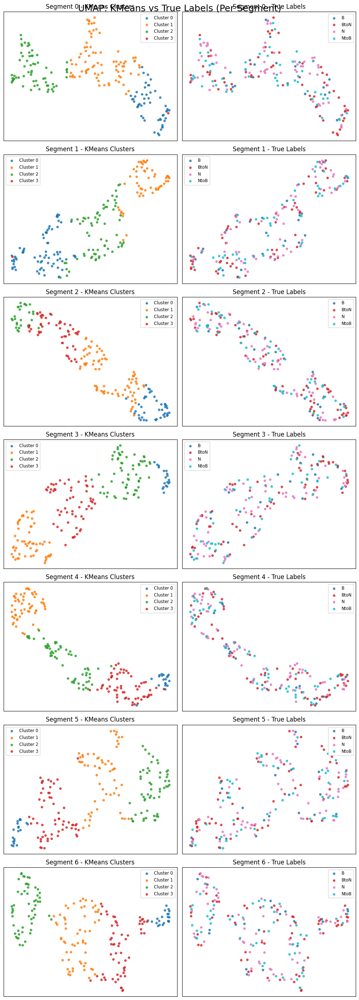

In [ ]:
segments = segment_data_all_tests(smoothed_comb_data_dict, class_dict)
visualize_umap_segments_with_clusters_and_labels(segments, n_clusters=4)


In [ ]:
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, accuracy_score
from scipy.optimize import linear_sum_assignment
from sklearn.preprocessing import LabelEncoder

def compute_clustering_metrics(true_labels, pred_labels):
    """Compute ARI, NMI, and best-match accuracy for clustering results."""
    
    # Encode true labels to integers
    le = LabelEncoder()
    true_encoded = le.fit_transform(true_labels)

    # Contingency matrix (confusion matrix)
    n_clusters = max(pred_labels.max(), true_encoded.max()) + 1
    contingency = np.zeros((n_clusters, n_clusters), dtype=int)
    for true, pred in zip(true_encoded, pred_labels):
        contingency[true, pred] += 1

    # Hungarian algorithm to align labels for best accuracy
    row_ind, col_ind = linear_sum_assignment(-contingency)
    acc = contingency[row_ind, col_ind].sum() / len(true_labels)

    ari = adjusted_rand_score(true_encoded, pred_labels)
    nmi = normalized_mutual_info_score(true_encoded, pred_labels)

    return {'ARI': ari, 'NMI': nmi, 'Accuracy': acc}


In [ ]:
all_metrics = {}

for seg_idx, segment_data in segments.items():
    if len(segment_data) < 4:
        continue
    
    df = pd.DataFrame(segment_data)
    X = df.drop(['label', 'test_id'], axis=1).values
    X_scaled = StandardScaler().fit_transform(X)

    true_labels = df['label'].values

    # KMeans clustering
    kmeans = KMeans(n_clusters=4, random_state=42)
    pred_labels = kmeans.fit_predict(X_scaled)

    # Compute metrics
    metrics = compute_clustering_metrics(true_labels, pred_labels)
    all_metrics[seg_idx] = metrics
    print(f"Segment {seg_idx}: ARI={metrics['ARI']:.3f}, NMI={metrics['NMI']:.3f}, Accuracy={metrics['Accuracy']:.3f}")


Segment 0: ARI=0.012, NMI=0.029, Accuracy=0.379
Segment 1: ARI=-0.001, NMI=0.019, Accuracy=0.349
Segment 2: ARI=-0.002, NMI=0.017, Accuracy=0.313
Segment 3: ARI=-0.008, NMI=0.011, Accuracy=0.313
Segment 4: ARI=-0.006, NMI=0.014, Accuracy=0.313
Segment 5: ARI=-0.008, NMI=0.009, Accuracy=0.313
Segment 6: ARI=-0.008, NMI=0.014, Accuracy=0.303


## AUC as a feature for classification

/tmp/ipykernel_11798/2465458556.py:35: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  area = np.trapz(hop_filtered, h_filtered)


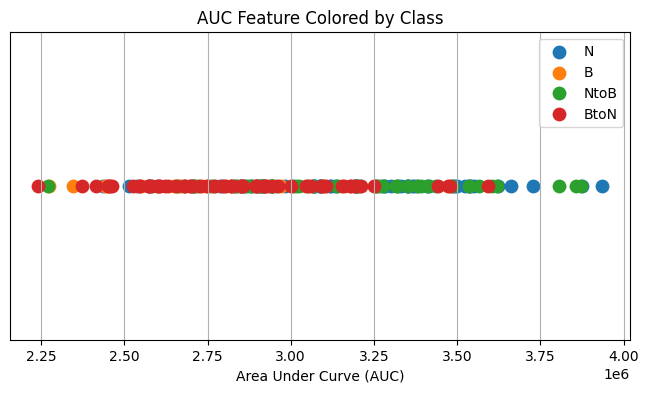


--- Random Forest ---
Fold 1 Accuracy: 0.51
Fold 2 Accuracy: 0.38
Fold 3 Accuracy: 0.36
Fold 4 Accuracy: 0.31
Fold 5 Accuracy: 0.36

--- SVM ---
Fold 1 Accuracy: 0.46
Fold 2 Accuracy: 0.49
Fold 3 Accuracy: 0.36
Fold 4 Accuracy: 0.38
Fold 5 Accuracy: 0.38

=== Summary ===
      Classifier  Mean Accuracy   Std Dev
0  Random Forest       0.384615  0.068802
1            SVM       0.415385  0.049720


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import auc as sklearn_auc

# 1. Build the DataFrame from smoothed_comb_data_dict and class_dict
def compute_auc_features(smoothed_comb_data_dict, class_dict, max_h=900):
    data = []

    for label, test_ids in class_dict.items():
        for test_id in test_ids:
            if test_id not in smoothed_comb_data_dict:
                continue

            df = smoothed_comb_data_dict[test_id]

            # Get h and hop values
            h = df['Déplacement corrigé dérive thermique (nm)'].values
            hop = df['HOP (MPa)'].values

            # Filter h values between 0 and max_h
            mask = (h >= 10) & (h <= max_h)
            h_filtered = h[mask]
            hop_filtered = hop[mask]

            if len(h_filtered) < 2:
                continue  # Not enough points to compute AUC

            # Compute AUC using trapezoidal rule
            area = np.trapz(hop_filtered, h_filtered)

            data.append({
                'test_id': test_id,
                'auc': area,
                'label': label
            })

    return pd.DataFrame(data)

# 2. Visualization function
def plot_auc_distribution(df):
    plt.figure(figsize=(8, 4))
    for label in df['label'].unique():
        subset = df[df['label'] == label]
        plt.scatter(subset['auc'], [0]*len(subset), label=label, s=80)

    plt.xlabel('Area Under Curve (AUC)')
    plt.yticks([])
    plt.title('AUC Feature Colored by Class')
    plt.legend()
    plt.grid(True)
    plt.show()

# 3. Classifier evaluation function
def evaluate_auc_classifiers(df, n_splits=5):
    X = df[['auc']].values
    y = LabelEncoder().fit_transform(df['label'])

    kf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

    classifiers = {
        'Random Forest': RandomForestClassifier(random_state=42),
        'SVM': SVC(kernel='rbf', gamma='scale', random_state=42)
    }

    results = []

    for clf_name, clf in classifiers.items():
        print(f"\n--- {clf_name} ---")
        acc_scores = []

        for fold, (train_idx, test_idx) in enumerate(kf.split(X, y), 1):
            X_train, X_test = X[train_idx], X[test_idx]
            y_train, y_test = y[train_idx], y[test_idx]

            clf.fit(X_train, y_train)
            y_pred = clf.predict(X_test)

            report = classification_report(y_test, y_pred, output_dict=True, zero_division=0)
            acc_scores.append(report['accuracy'])
            print(f"Fold {fold} Accuracy: {report['accuracy']:.2f}")

        mean_acc = np.mean(acc_scores)
        std_acc = np.std(acc_scores)
        results.append({
            'Classifier': clf_name,
            'Mean Accuracy': mean_acc,
            'Std Dev': std_acc
        })

    results_df = pd.DataFrame(results)
    print("\n=== Summary ===")
    print(results_df)
    return results_df

# --- Execution ---

# Step 1: Build the AUC DataFrame
auc_df = compute_auc_features(smoothed_comb_data_dict, class_dict)

# Step 2: Visualize AUC distribution
plot_auc_distribution(auc_df)

# Step 3: Evaluate classifiers
results_df = evaluate_auc_classifiers(auc_df)


In [ ]:
def compute_auc_feature_raw(data_dict, class_dict):
    records = []
    h_grid = np.linspace(0, 900, 900)  # fixed grid without normalization

    for label, test_ids in class_dict.items():
        for test_id in test_ids:
            df = data_dict.get(test_id)
            if df is None:
                continue

            # Filter displacement > 0
            mask = df['Déplacement corrigé dérive thermique (nm)'] > 10
            h = df.loc[mask, 'Déplacement corrigé dérive thermique (nm)'].values
            hop = df.loc[mask, 'HOP (MPa)'].values

            if len(h) < 2:
                continue

            # Interpolation on common grid
            hop_interp = np.interp(h_grid, h, hop)

            # Area under the curve (trapezoidal integration)
            auc = np.trapz(hop_interp, h_grid)

            records.append({'test_id': test_id, 'auc': auc, 'label': label})

    return pd.DataFrame(records)

In [ ]:
def run_auc_classification(df_auc, n_splits=5):
    from sklearn.ensemble import RandomForestClassifier
    from xgboost import XGBClassifier
    from catboost import CatBoostClassifier
    from lightgbm import LGBMClassifier
    from sklearn.svm import SVC
    from sklearn.preprocessing import LabelEncoder

    X = df_auc[['auc']]
    y = LabelEncoder().fit_transform(df_auc['label'])

    classifiers = {
        'Random Forest': RandomForestClassifier(),
        'XGBoost': XGBClassifier(verbosity=0, use_label_encoder=False),
        'CatBoost': CatBoostClassifier(verbose=0),
        'LightGBM': LGBMClassifier(),
        'SVM': SVC()
    }

    results = []
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

    for clf_name, clf in classifiers.items():
        print(f"\nClassifier: {clf_name}")
        all_reports = []
        for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):
            X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
            y_train, y_test = y[train_idx], y[test_idx]

            clf.fit(X_train, y_train)
            y_pred = clf.predict(X_test)

            report = classification_report(y_test, y_pred, output_dict=True)
            all_reports.append(report['accuracy'])

        avg_acc = np.mean(all_reports)
        std_acc = np.std(all_reports)
        results.append({'Classifier': clf_name, 'Mean Accuracy': avg_acc, 'Std Accuracy': std_acc})

    return pd.DataFrame(results)

In [ ]:
df_auc = compute_auc_feature_raw(smoothed_comb_data_dict, class_dict)
df_results = run_auc_classification(df_auc, n_splits=5)
print(df_results)


/tmp/ipykernel_11798/2991920939.py:23: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  auc = np.trapz(hop_interp, h_grid)



Classifier: Random Forest

Classifier: XGBoost

Classifier: CatBoost

Classifier: LightGBM
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000057 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 53
[LightGBM] [Info] Number of data points in the train set: 156, number of used features: 1
[LightGBM] [Info] Start training from score -2.216643
[LightGBM] [Info] Start training from score -1.158036
[LightGBM] [Info] Start training from score -1.118030
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

/home/stagiaire/Documents/stage/nano-app/venv-py311/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stagiaire/Documents/stage/nano-app/venv-py311/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stagiaire/Documents/stage/nano-app/venv-py311/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/stagiaire/Documents/stage/nano-app/venv-py311/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stagiaire/Documents/stage/nano-app/venv-py311/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stagiaire/Documents/stage/nano-app/venv-py311/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

In [ ]:
class_dict

{'N': ['006',
  '011',
  '014',
  '015',
  '016',
  '017',
  '021',
  '022',
  '024',
  '031',
  '039',
  '043',
  '046',
  '047',
  '048',
  '054',
  '055',
  '059',
  '063',
  '064',
  '066',
  '068',
  '070',
  '075',
  '076',
  '081',
  '090',
  '095',
  '096',
  '097',
  '098',
  '102',
  '103',
  '105',
  '106',
  '112',
  '123',
  '124',
  '125',
  '127',
  '128',
  '129',
  '135',
  '138',
  '140',
  '140',
  '141',
  '142',
  '144',
  '148',
  '149',
  '154',
  '158',
  '159',
  '163',
  '164',
  '166',
  '178',
  '179',
  '184',
  '189',
  '194',
  '196',
  '198'],
 'B': ['012',
  '018',
  '019',
  '020',
  '023',
  '036',
  '040',
  '042',
  '049',
  '053',
  '083',
  '091',
  '121',
  '133',
  '134',
  '146',
  '151',
  '155',
  '172',
  '177',
  '192'],
 'NtoB': ['001',
  '003',
  '005',
  '004',
  '007',
  '032',
  '033',
  '034',
  '037',
  '056',
  '065',
  '067',
  '070',
  '082',
  '084',
  '086',
  '087',
  '094',
  '107',
  '109',
  '110',
  '111',
  '116',
  '118',

/tmp/ipykernel_11798/1325511408.py:53: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  label_colors = plt.cm.get_cmap('tab10', len(labels))


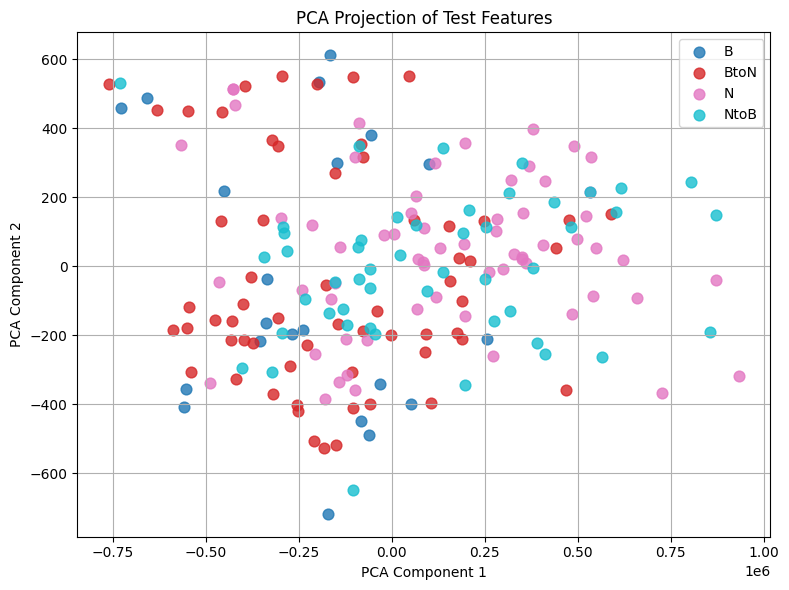

In [ ]:
def compute_features(smoothed_comb_data_dict, class_dict):
    rows = []

    for label, test_ids in class_dict.items():
        for test_id in test_ids:
            if test_id not in smoothed_comb_data_dict:
                continue

            df = smoothed_comb_data_dict[test_id]

            h = df['Déplacement corrigé dérive thermique (nm)'].values
            hop = df['HOP (MPa)'].values

            # AUC between 0 and 900
            mask_auc = (h >= 10) & (h <= 900)
            if np.sum(mask_auc) < 2:
                continue
            auc_value = np.trapezoid(hop[mask_auc], h[mask_auc])

            # h at which hop is maximum (within 0 to 1100)
            mask_hmax = (h >= 10) & (h <= 1100)
            #if np.sum(mask_hmax) == 0: continue

            h_range = h[mask_hmax]
            hop_range = hop[mask_hmax]
            hop_at_max = np.argmax(hop_range)

            # hop at h = 1100 (interpolate if needed)
            try:
                hop_at_1100 = np.interp(1100, h, hop)
            except:
                hop_at_1100 = np.nan

            rows.append({
                'test_id': test_id,
                'auc': auc_value,
                'h_at_max_hop': hop_at_max,
                
                'label': label
            })

    return pd.DataFrame(rows)

# --- PCA Visualization ---
def plot_pca(df_features):
    X = df_features[['auc', 'h_at_max_hop']].values
    y = df_features['label'].values
    labels = np.unique(y)

    # Encode labels to colors
    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(y)
    label_colors = plt.cm.get_cmap('tab10', len(labels))

    # Apply PCA
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X)

    # Plot
    plt.figure(figsize=(8, 6))
    for i, label in enumerate(labels):
        idxs = (y == label)
        plt.scatter(X_pca[idxs, 0], X_pca[idxs, 1],
                    label=label, s=60, alpha=0.8,
                    color=label_colors(i))

    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.title("PCA Projection of Test Features")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# --- Run the pipeline ---
features_df = compute_features(smoothed_comb_data_dict, class_dict)
plot_pca(features_df)

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture
import seaborn as sns

# 1. Compute AUC features
def compute_auc_features(smoothed_comb_data_dict, class_dict, max_h=900):
    data = []

    for label, test_ids in class_dict.items():
        for test_id in test_ids:
            if test_id not in smoothed_comb_data_dict:
                continue

            df = smoothed_comb_data_dict[test_id]
            h = df['Déplacement corrigé dérive thermique (nm)'].values
            hop = df['HOP (MPa)'].values

            mask = (h >= 10) & (h <= max_h)
            h_filtered = h[mask]
            hop_filtered = hop[mask]

            if len(h_filtered) < 2:
                continue

            area = np.trapz(hop_filtered, h_filtered)
            data.append({'test_id': test_id, 'auc': area, 'label': label})

    return pd.DataFrame(data)

# 2. Plot AUCs + GMM components
def plot_auc_with_gmm(df, n_components=4):
    auc_values = df['auc'].values.reshape(-1, 1)

    # Fit Gaussian Mixture Model
    gmm = GaussianMixture(n_components=n_components, random_state=42)
    gmm.fit(auc_values)

    # Plot histogram of AUCs
    plt.figure(figsize=(10, 5))
    sns.histplot(df['auc'], bins=20, kde=False, color='skyblue', stat='density', label='AUC histogram')

    # Plot each Gaussian component
    x = np.linspace(min(df['auc']), max(df['auc']), 1000).reshape(-1, 1)
    densities = np.exp(gmm.score_samples(x))

    plt.plot(x, densities, color='black', linewidth=2, label='GMM total density')

    for i in range(n_components):
        mean = gmm.means_[i][0]
        std = np.sqrt(gmm.covariances_[i][0][0])
        weight = gmm.weights_[i]
        gaussian = weight * (1 / (std * np.sqrt(2 * np.pi))) * np.exp(-(x - mean)**2 / (2 * std**2))
        plt.plot(x, gaussian, label=f'Component {i+1}')

    plt.xlabel('AUC')
    plt.ylabel('Density')
    plt.title(f'GMM Fit with {n_components} Components')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    return gmm


/tmp/ipykernel_11798/1662624506.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  auc = np.trapz(hop_filtered, h_filtered)


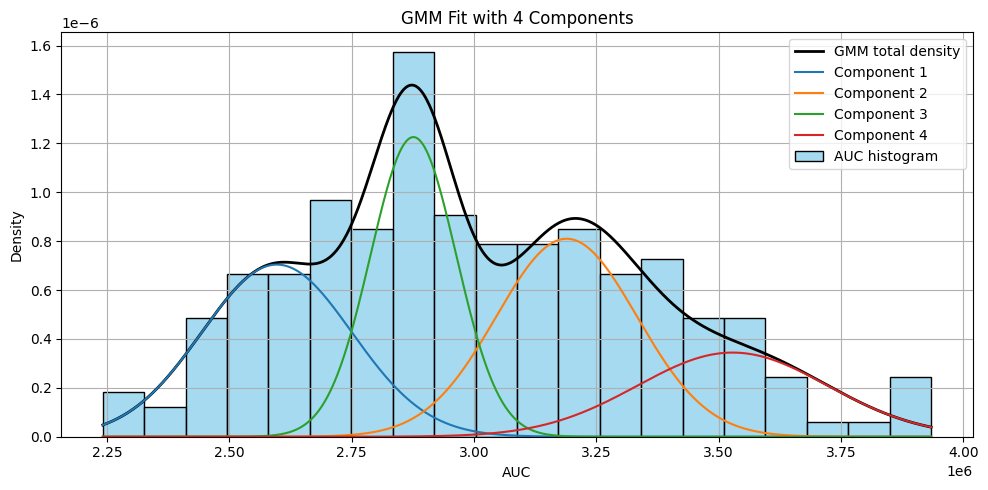

In [ ]:
df_auc = compute_auc_features(smoothed_comb_data_dict, class_dict)
gmm_model = plot_auc_with_gmm(df_auc, n_components=4)  # Or try 3, 4, ...


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture
import seaborn as sns

# 1. Compute AUC features from your test data
def compute_auc_features(smoothed_comb_data_dict, class_dict, max_h=900):
    data = []
    for label, test_ids in class_dict.items():
        for test_id in test_ids:
            if test_id not in smoothed_comb_data_dict:
                continue

            df = smoothed_comb_data_dict[test_id]

            h = df['Déplacement corrigé dérive thermique (nm)'].values
            hop = df['HOP (MPa)'].values

            mask = (h >= 10) & (h <= max_h)
            h_filtered = h[mask]
            hop_filtered = hop[mask]

            if len(h_filtered) < 2:
                continue

            auc = np.trapz(hop_filtered, h_filtered)

            data.append({
                'test_id': test_id,
                'auc': auc,
                'label': label
            })

    return pd.DataFrame(data)

# 2. Fit GMM and assign cluster labels
def fit_gmm_and_cluster(df_auc, n_components=4):
    X = df_auc[['auc']].values  # You can later add more features here
    gmm = GaussianMixture(n_components=n_components, random_state=42)
    df_auc['gmm_cluster'] = gmm.fit_predict(X)
    return df_auc, gmm

# 3. Visualize AUCs colored by GMM cluster
def plot_auc_by_gmm_cluster(df_auc):
    plt.figure(figsize=(10, 4))
    sns.scatterplot(data=df_auc, x='auc', y=[0]*len(df_auc), hue='gmm_cluster', palette='tab10', s=80)
    plt.xlabel('Area Under Curve (AUC)')
    plt.title('AUC Feature Colored by GMM Cluster')
    plt.yticks([])
    plt.grid(True)
    plt.legend(title='GMM Cluster')
    plt.show()

# 4. Cross-tabulate true labels vs GMM clusters
def show_cluster_label_alignment(df_auc):
    crosstab = pd.crosstab(df_auc['label'], df_auc['gmm_cluster'])
    print("True Labels vs GMM Cluster Assignment:")
    print(crosstab)
    return crosstab


/tmp/ipykernel_11798/1662624506.py:27: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  auc = np.trapz(hop_filtered, h_filtered)


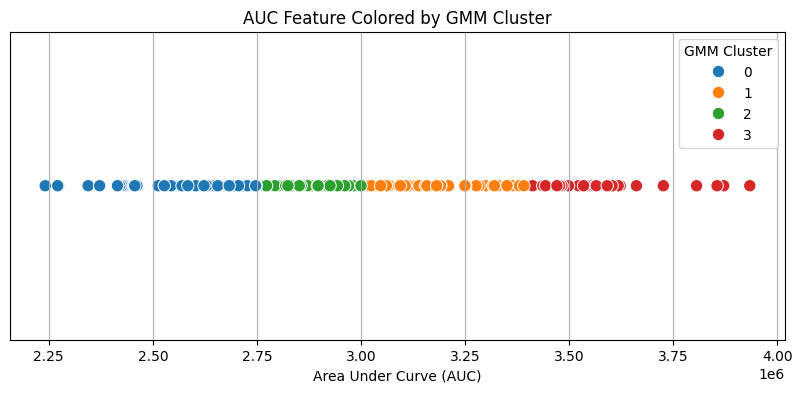

True Labels vs GMM Cluster Assignment:
gmm_cluster   0   1   2   3
label                      
B             9   3   9   0
BtoN         27  13  17   4
N             7  26  16  15
NtoB          8  17  14  10


In [ ]:
# Step 1: Compute AUC features
df_auc = compute_auc_features(smoothed_comb_data_dict, class_dict)

# Step 2: Fit GMM and assign clusters
df_auc, gmm = fit_gmm_and_cluster(df_auc, n_components=4)

# Step 3: Visualize AUC by cluster
plot_auc_by_gmm_cluster(df_auc)

# Step 4: Print label-cluster relationship
crosstab = show_cluster_label_alignment(df_auc)
